In [1]:
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from vector import array as vec_array

# Physical constants
M_PROTON = 0.938  # GeV
M_PION0  = 0.13498  # GeV

# Optional: Style
plt.style.use("seaborn-v0_8-poster")

# Load skimmed data file
file_path = "/home/ubuntu/nps_analysis/pi0_analysis/data/nps_hms_coin_skimmed_4398.root"
tree = uproot.open(file_path)["T"]

# Load branches
branches = tree.arrays([
    "T.hms.hEDTM_tdcTimeRaw", "T.hms.hTRIG4_tdcTimeRaw", "H.cal.etot", "H.cal.etotnorm",
    "H.cal.etottracknorm", "H.cal.etrack", "H.cal.etracknorm",
    "H.cer.npeSum", "H.gtr.dp", "H.gtr.th", "H.gtr.ph", "H.gtr.y", "H.gtr.p", 
    "H.gtr.px", "H.gtr.py", "H.gtr.pz", "H.gtr.x", "H.gtr.y", "NPS.cal.nclust", "NPS.cal.clusE",
    "NPS.cal.clusX", "NPS.cal.clusY", "NPS.cal.clusT"
])

tree.keys()

['Ndata.NPS.cal.clusE',
 'NPS.cal.clusE',
 'Ndata.NPS.cal.clusT',
 'NPS.cal.clusT',
 'Ndata.NPS.cal.clusX',
 'NPS.cal.clusX',
 'Ndata.NPS.cal.clusY',
 'NPS.cal.clusY',
 'H.cal.etot',
 'H.cal.etotnorm',
 'H.cal.etottracknorm',
 'H.cal.etrack',
 'H.cal.etracknorm',
 'H.cer.npeSum',
 'H.gtr.dp',
 'H.gtr.p',
 'H.gtr.ph',
 'H.gtr.px',
 'H.gtr.py',
 'H.gtr.pz',
 'H.gtr.th',
 'H.gtr.x',
 'H.gtr.y',
 'NPS.cal.nclust',
 'T.hms.hEDTM_tdcTimeRaw',
 'T.hms.hTRIG1_tdcTimeRaw',
 'T.hms.hTRIG2_tdcTimeRaw',
 'T.hms.hTRIG3_tdcTimeRaw',
 'T.hms.hTRIG4_tdcTimeRaw',
 'T.hms.hTRIG5_tdcTimeRaw',
 'T.hms.hTRIG6_tdcTimeRaw']

In [ ]:
#!/usr/bin/env python3
"""
Optimized π⁰ cluster tagging with Numba & NumPy
- Computes all photon pairs per event
- Applies inequality cut and opening-angle cut
- Outputs CSVs for all candidates, passing candidates, and cluster tags
- Multiplicity histograms for inequality, opening-angle, and both
"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import awkward as ak
import numba as nb
from itertools import combinations
from tqdm import tqdm

# ======================
# Constants
# ======================
m_e = 0.000511
m_p = 0.938
m_pi = 0.135
E_beam = 10.537  # GeV
Z_NPS = 407.0
THETA_DEG = -17.51
THETA_RAD = np.deg2rad(THETA_DEG)
COS_THETA = np.cos(THETA_RAD)
SIN_THETA = np.sin(THETA_RAD)
OA_TOL = 0.02  # radians: opening angle tolerance

# Beam and target 4-vectors
p4_ein = np.array([E_beam, 0.0, 0.0, E_beam])
p4_pin = np.array([m_p, 0.0, 0.0, 0.0])

# ======================
# Load branches (2-cluster requirement)
# ======================
has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2

px_e = ak.to_numpy(branches["H.gtr.px"])[has_two_clust]
py_e = ak.to_numpy(branches["H.gtr.py"])[has_two_clust]
pz_e = ak.to_numpy(branches["H.gtr.pz"])[has_two_clust]
Ee   = ak.to_numpy(branches["H.gtr.p"])[has_two_clust]

clusE = branches["NPS.cal.clusE"][has_two_clust]
clusX = branches["NPS.cal.clusX"][has_two_clust]
clusY = branches["NPS.cal.clusY"][has_two_clust]

# ======================
# Numba helper functions
# ======================
@nb.njit
def rotate_photon(px, py, pz, cos_t, sin_t):
    px_r = cos_t*px + sin_t*pz
    pz_r = -sin_t*px + cos_t*pz
    return px_r, py, pz_r

@nb.njit
def photon_4vector(E, x, y, z):
    norm = np.sqrt(x*x + y*y + z*z)
    return np.array([E, E*x/norm, E*y/norm, E*z/norm])

@nb.njit
def compute_Q2(p4_eout):
    q_vec = p4_ein - p4_eout
    return -(q_vec[0]**2 - (q_vec[1]**2 + q_vec[2]**2 + q_vec[3]**2))

@nb.njit
def inequality_pass(E_pi, Ee, Q2):
    E_p_scat = (E_beam + m_p - Ee - E_pi)
    lhs = ((2*m_p**2 + m_pi**2 + Q2 +
           2*(E_p_scat*E_pi - E_pi*m_p - E_p_scat*m_p)))/2
    rhs = np.sqrt((E_p_scat**2 - m_p**2) * (E_pi**2 - m_pi**2))
    return lhs <= rhs

@nb.njit
def unit_vec_from_xy(x, y, z):
    norm = np.sqrt(x*x + y*y + z*z)
    return x/norm, y/norm, z/norm

@nb.njit
def passes_opening_angle(e1, e2, x1, y1, x2, y2, z, m_pi0, tol):
    u1x, u1y, u1z = unit_vec_from_xy(x1, y1, z)
    u2x, u2y, u2z = unit_vec_from_xy(x2, y2, z)
    dot = u1x*u2x + u1y*u2y + u1z*u2z
    dot = min(1.0, max(-1.0, dot))  # clamp for arccos
    theta_data = np.arccos(dot)
    denom = 4.0*e1*e2
    if denom <= 0.0:
        return False
    arg = m_pi0**2 / denom
    if arg > 1.0:
        return False
    theta_ideal = 2.0*np.arcsin(np.sqrt(arg))
    return np.abs(theta_data - theta_ideal) < tol

# ======================
# Main processing function
# ======================
@nb.njit
def process_events(clusE, clusX, clusY, Ee, px_e, py_e, pz_e):
    Epi_all_list, Q2_all_list, idx_all_list = [], [], []
    Epi_ineq_list, Q2_ineq_list, idx_ineq_list = [], [], []
    Epi_oa_list, Q2_oa_list, idx_oa_list = [], [], []
    cluster_tags_list = []

    for ev in range(len(Ee)):
        nclus = len(clusE[ev])
        tags_ineq = np.zeros(nclus, dtype=np.bool_)
        tags_oa = np.zeros(nclus, dtype=np.bool_)
        p4_eout = np.array([Ee[ev], px_e[ev], py_e[ev], pz_e[ev]])

        if nclus < 2 or Ee[ev] < 3.5:
            cluster_tags_list.append((tags_ineq, tags_oa))
            continue

        for i in range(nclus-1):
            for j in range(i+1, nclus):
                ph1 = photon_4vector(clusE[ev][i], clusX[ev][i], clusY[ev][i], Z_NPS)
                ph2 = photon_4vector(clusE[ev][j], clusX[ev][j], clusY[ev][j], Z_NPS)

                p1x, p1y, p1z = rotate_photon(ph1[1], ph1[2], ph1[3], COS_THETA, SIN_THETA)
                p2x, p2y, p2z = rotate_photon(ph2[1], ph2[2], ph2[3], COS_THETA, SIN_THETA)

                p4_pi = np.array([ph1[0]+ph2[0], p1x+p2x, p1y+p2y, p1z+p2z])
                E_pi = p4_pi[0]
                Q2_val = compute_Q2(p4_eout)

                # store all candidates
                Epi_all_list.append(E_pi)
                Q2_all_list.append(Q2_val)
                idx_all_list.append(ev)

                # inequality tagging
                ineq_passed = inequality_pass(E_pi, Ee[ev], Q2_val)
                if ineq_passed:
                    tags_ineq[i] = True
                    tags_ineq[j] = True
                    Epi_ineq_list.append(E_pi)
                    Q2_ineq_list.append(Q2_val)
                    idx_ineq_list.append(ev)

                # opening-angle tagging
                oa_passed = passes_opening_angle(clusE[ev][i], clusE[ev][j],
                                                 clusX[ev][i], clusY[ev][i],
                                                 clusX[ev][j], clusY[ev][j],
                                                 Z_NPS, m_pi, OA_TOL)
                if oa_passed:
                    tags_oa[i] = True
                    tags_oa[j] = True
                    Epi_oa_list.append(E_pi)
                    Q2_oa_list.append(Q2_val)
                    idx_oa_list.append(ev)

        cluster_tags_list.append((tags_ineq, tags_oa))

    return (np.array(Epi_all_list), np.array(Q2_all_list), np.array(idx_all_list),
            np.array(Epi_ineq_list), np.array(Q2_ineq_list), np.array(idx_ineq_list),
            np.array(Epi_oa_list), np.array(Q2_oa_list), np.array(idx_oa_list),
            cluster_tags_list)

# ======================
# Run
# ======================
(Epi_all, Q2_all, idx_all,
 Epi_ineq, Q2_ineq, idx_ineq,
 Epi_oa, Q2_oa, idx_oa,
 cluster_tags) = process_events(clusE, clusX, clusY, Ee, px_e, py_e, pz_e)

# ======================
# Build combined cluster tagging
# ======================
# cluster_tag_df = []
# for i, (t_ineq, t_oa) in enumerate(cluster_tags):
#     for j in range(len(t_ineq)):
#         cluster_tag_df.append({
#             "event": i,
#             "cluster_index": j,
#             "energy": float(clusE[i][j]),
#             "x": float(clusX[i][j]),
#             "y": float(clusY[i][j]),
#             "inequality_tagged": bool(t_ineq[j]),
#             "opening_angle_tagged": bool(t_oa[j]),
#             "both_tags": bool(t_ineq[j] and t_oa[j])
#         })

# df_tags = pd.DataFrame(cluster_tag_df)
# df_tags.to_csv("cluster_tags_with_opening_angle.csv", index=False)

# ======================
# Fast CSV creation
# ======================
n_total_clusters = sum(len(t_ineq) for t_ineq, t_oa in cluster_tags)

# Pre-allocate arrays
event_arr  = np.zeros(n_total_clusters, dtype=np.int32)
cluster_idx_arr = np.zeros(n_total_clusters, dtype=np.int32)
energy_arr = np.zeros(n_total_clusters, dtype=np.float32)
x_arr = np.zeros(n_total_clusters, dtype=np.float32)
y_arr = np.zeros(n_total_clusters, dtype=np.float32)
ineq_tag_arr = np.zeros(n_total_clusters, dtype=bool)
oa_tag_arr = np.zeros(n_total_clusters, dtype=bool)
both_tag_arr = np.zeros(n_total_clusters, dtype=bool)

idx = 0
for ev, (t_ineq, t_oa) in enumerate(cluster_tags):
    nclus = len(t_ineq)
    for cl in range(nclus):
        event_arr[idx] = ev
        cluster_idx_arr[idx] = cl
        energy_arr[idx] = clusE[ev][cl]
        x_arr[idx] = clusX[ev][cl]
        y_arr[idx] = clusY[ev][cl]
        ineq_tag_arr[idx] = t_ineq[cl]
        oa_tag_arr[idx] = t_oa[cl]
        both_tag_arr[idx] = t_ineq[cl] and t_oa[cl]
        idx += 1

df_fast = pd.DataFrame({
    "event": event_arr,
    "cluster_index": cluster_idx_arr,
    "energy": energy_arr,
    "x": x_arr,
    "y": y_arr,
    "inequality_tagged": ineq_tag_arr,
    "opening_angle_tagged": oa_tag_arr,
    "both_tags": both_tag_arr
})

df_fast.to_csv("cluster_tags_fast_temp.csv", index=False)


print("Processing complete!")


NameError: name 'df_tags' is not defined

=== Before tagging ===
2-cluster events: 580641
3-cluster events: 457095
4-cluster events: 325311
5-cluster events: 212026
6-cluster events: 130115
7-cluster events: 75251
8-cluster events: 42140
9-cluster events: 22260
10-cluster events: 11445
11-cluster events: 5753
12-cluster events: 2725
13-cluster events: 1277
14-cluster events: 616
15-cluster events: 296
16-cluster events: 137
17-cluster events: 57
18-cluster events: 23
19-cluster events: 7
20-cluster events: 1
21-cluster events: 4
Fraction 2-cluster events (excluding 0- and 1-clusters): 0.3110
Fraction >2-cluster events (excluding 0- and 1-clusters): 0.6890
----------------------------------

=== Opening-angle tag ===
0-cluster events: 1636712
2-cluster events: 180812
3-cluster events: 37077
4-cluster events: 9763
5-cluster events: 2221
6-cluster events: 480
7-cluster events: 92
8-cluster events: 20
9-cluster events: 3
Fraction 2-cluster events (excluding 0- and 1-clusters): 0.7845
Fraction >2-cluster events (excluding 0- and 1-

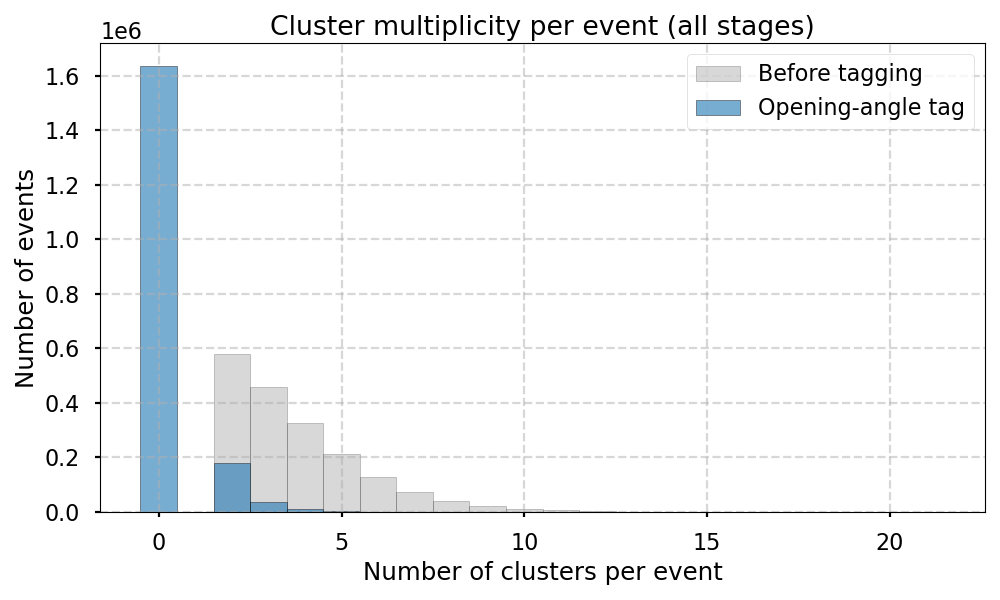

In [64]:
def plot_multiplicity_with_raw(df, filename=None):
    """
    Plots cluster multiplicity per event and prints detailed statistics:
    
    - Before any cut
    - After inequality cut
    - After opening-angle cut
    - After both cuts
    
    Prints for each stage:
    - Number of 2-cluster, 3-cluster, 4-cluster events, etc.
    - Fraction of 2-cluster vs >2-cluster events
    """
    import matplotlib.pyplot as plt
    import numpy as np

    stages = {
        "Before tagging": df.groupby("event")["cluster_index"].count().values,
        # "Inequality tag": df.groupby("event")["inequality_tagged"].sum().values,
        "Opening-angle tag": df.groupby("event")["opening_angle_tagged"].sum().values
        # "Both tags": df.groupby("event")["both_tags"].sum().values
    }

    # Print statistics excluding 0- and 1-cluster events
    for stage_name, n_clusters in stages.items():
        print(f"=== {stage_name} ===")
        unique, counts = np.unique(n_clusters, return_counts=True)
        for u, c in zip(unique, counts):
            print(f"{u}-cluster events: {c}")
        
        # Only consider events with 2 or more clusters
        n_clusters_valid = n_clusters[n_clusters >= 2]
        
        two_cluster_frac = np.sum(n_clusters_valid == 2) / len(n_clusters_valid)
        more_than_two_frac = np.sum(n_clusters_valid > 2) / len(n_clusters_valid)
        
        print(f"Fraction 2-cluster events (excluding 0- and 1-clusters): {two_cluster_frac:.4f}")
        print(f"Fraction >2-cluster events (excluding 0- and 1-clusters): {more_than_two_frac:.4f}")
        print("----------------------------------\n")



    # Automatic bins for histogram
    max_bin = max([n.max() for n in stages.values()])
    bins = np.arange(0, max_bin + 2) - 0.5  # include last bin

    # Plot histogram
    plt.figure(figsize=(10,6))
    colors = ["gray", "C0", "C1", "C2"]
    alphas = [0.3, 0.6, 0.6, 0.6]
    
    for i, (stage_name, n_clusters) in enumerate(stages.items()):
        plt.hist(n_clusters, bins=bins, alpha=alphas[i], label=stage_name, color=colors[i], edgecolor='black')

    plt.xlabel("Number of clusters per event")
    plt.ylabel("Number of events")
    plt.title("Cluster multiplicity per event (all stages)")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    
    # if filename:
    #     plt.savefig(filename, dpi=200)
    plt.show()

# Example usage
df_fast = pd.read_csv('cluster_tags_fast_temp.csv')
plot_multiplicity_with_raw(df_fast, "cluster_multiplicity_all.png")


In [ ]:
import pandas as pd
df_csv = pd.read_csv('cluster_tags_fast_temp.csv')
df_csv.head(10)

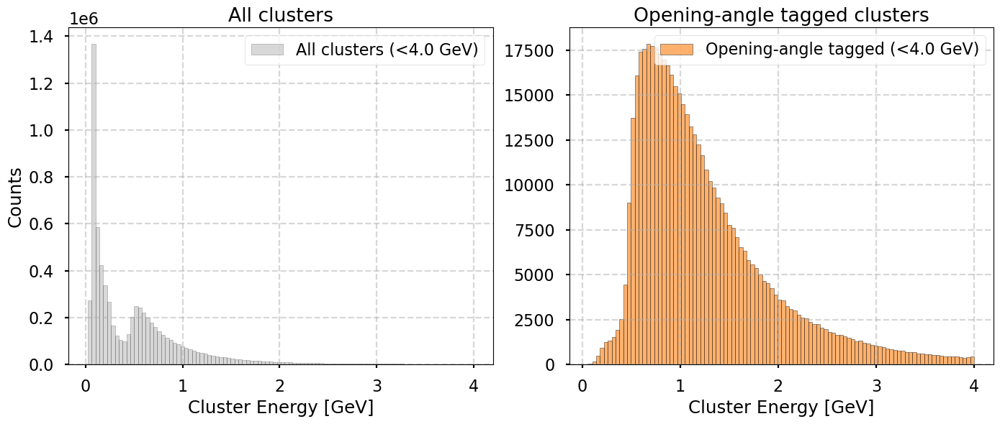

In [4]:
import pandas as pd

def plot_cluster_energy_subplots(df, filename_prefix="plots", energy_cut=4.0, save_figs=False):
    import matplotlib.pyplot as plt

    # Mask for energy cut
    mask = df['energy'] < energy_cut

    # Create figure with 2 subplots
    fig, axes = plt.subplots(1, 2, figsize=(14,6), sharey=False)

    # ---------------------
    # Left subplot: All and Inequality
    # ---------------------
    axes[0].hist(df.loc[mask, 'energy'], bins=100, alpha=0.3, label=f'All clusters (<{energy_cut} GeV)', color='gray', edgecolor='black')
    # axes[0].hist(df.loc[df['inequality_tagged'] & mask, 'energy'], bins=100, alpha=0.6, label=f'Inequality tagged (<{energy_cut} GeV)', color='C0', edgecolor='black')
    axes[0].set_xlabel("Cluster Energy [GeV]")
    axes[0].set_ylabel("Counts")
    axes[0].set_title("All clusters")
    axes[0].legend()
    axes[0].grid(True, linestyle='--', alpha=0.5)

    # ---------------------
    # Right subplot: Opening-angle and Both
    # ---------------------
    axes[1].hist(df.loc[df['opening_angle_tagged'] & mask, 'energy'], bins=100, alpha=0.6, label=f'Opening-angle tagged (<{energy_cut} GeV)', color='C1', edgecolor='black')
    # axes[1].hist(df.loc[df['both_tags'] & mask, 'energy'], bins=100, alpha=0.6, label=f'Both tags (<{energy_cut} GeV)', color='C2', edgecolor='black')
    axes[1].set_xlabel("Cluster Energy [GeV]")
    axes[1].set_title("Opening-angle tagged clusters")
    axes[1].legend()
    axes[1].grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    # if save_figs:
    #     plt.savefig(f"{filename_prefix}_energy_subplots.png", dpi=200)
    plt.show()

df_fast = pd.read_csv('cluster_tags_fast_temp.csv')
plot_cluster_energy_subplots(df_fast)

In [64]:
# import numpy as np
# import matplotlib.pyplot as plt
# import awkward as ak
# import itertools
# import pandas as pd

# has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2

# clusE = branches["NPS.cal.clusE"][has_two_clust]
# clusT = branches["NPS.cal.clusT"][has_two_clust]

# df_csv = pd.read_csv("cluster_tags_fast_temp.csv")

# # clus_pairs_0_oa = []
# # clus_pairs_1_oa = []

# # clus_pairs_0_both = []
# # clus_pairs_1_both = []

# clus_pairs_oa = []
# clus_pairs_both = []

# # check that the event lengths are consistent
# if len(clusE) and len(clusT) and (df_csv["event"].iloc[-1] + 1) == False:
#     raise TypeError("event lengths are inconsistent. Check input.")

# n_event = len(clusE)

# for event in clusT:
#     for i in range(len(event)):
#         if df_csv[df_csv["opening_angle_tagged"]==False]:
#             continue
#         for j in range(i+1, len(event)):
#             if df_csv[df_csv["opening_angle_tagged"]==False]:
#                 continue
#             clus_pairs_oa.append((event[i], event[j]))

# clus_pairs_oa = np.array(clus_pairs_oa)
# clus_pairs_0_oa = clus_pairs_oa[:, 0]
# clus_pairs_1_oa = clus_pairs_oa[:, 1]

# # === 2D Histogram ===
# bins = 150
# hist_range = [[140, 160], [140, 160]]
# counts, xedges, yedges = np.histogram2d(clus_pairs_0_oa, clus_pairs_1_oa, bins=bins, range=hist_range)

# # === Apply threshold ===
# threshold = 1  # Only show bins with counts > threshold
# counts_masked = np.where(counts > threshold, counts, np.nan)  # Mask low-count bins

# print(f"Generated {len(clus_pairs_0_oa)} 2-cluster pairs.")

# # === Plot masked 2D histogram ===
# plt.figure(figsize=(8,7))
# X, Y = np.meshgrid(xedges, yedges)
# pcm = plt.pcolormesh(X, Y, counts_masked.T, cmap='viridis')  # Transpose for correct orientation
# plt.colorbar(label=f'Counts (> {threshold})')
# plt.xlabel("Cluster i Timing [ns]")
# plt.ylabel("Cluster j Timing [ns]")
# plt.title(f"NPS Cluster Timing Pairs (E > 0.5 GeV)")
# plt.grid(False)
# plt.tight_layout()
# plt.show()            

import numpy as np
import matplotlib.pyplot as plt
import awkward as ak
import pandas as pd

# ======================
# Load data
# ======================
has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
clusE = branches["NPS.cal.clusE"][has_two_clust]
clusT = branches["NPS.cal.clusT"][has_two_clust]

df_csv = pd.read_csv("cluster_tags_fast_temp.csv")

# ======================
# Check consistency
# ======================
n_events = len(clusE)
max_event_id = df_csv["event"].max() + 1
if n_events != max_event_id:
    raise ValueError(f"Inconsistent number of events: ROOT={n_events}, CSV={max_event_id}")

# ======================
# Helper: build cluster pairs based on a tag
# ======================
def get_cluster_pairs(clusT, df_csv, tag_name):
    pairs = []
    grouped = df_csv.groupby("event")
    for ev_idx, ev_t in enumerate(clusT):
        tag_ev = grouped.get_group(ev_idx)[tag_name].to_numpy()
        for i in range(len(ev_t)):
            if not tag_ev[i]:
                continue
            for j in range(i + 1, len(ev_t)):
                if not tag_ev[j]:
                    continue
                pairs.append((ev_t[i], ev_t[j]))
    return np.array(pairs)

# ======================
# Create pairs for both tag types
# ======================
pairs_oa = get_cluster_pairs(clusT, df_csv, "opening_angle_tagged")
pairs_both = get_cluster_pairs(clusT, df_csv, "both_tags")

print(f"Generated {len(pairs_oa)} OA pairs and {len(pairs_both)} both-tag pairs.")

# ======================
# Function to make 2D timing plot
# ======================
def plot_timing_pairs(pairs, title, bins=150, hist_range=(140, 160), threshold=1):
    if len(pairs) == 0:
        print(f"No pairs found for {title}")
        return
    counts, xedges, yedges = np.histogram2d(
        pairs[:, 0], pairs[:, 1],
        bins=bins, range=[hist_range, hist_range]
    )
    counts_masked = np.where(counts > threshold, counts, np.nan)

    X, Y = np.meshgrid(xedges, yedges)
    plt.figure(figsize=(8,7))
    pcm = plt.pcolormesh(X, Y, counts_masked.T, cmap='viridis')
    plt.colorbar(label=f'Counts (> {threshold})')
    plt.xlabel("Cluster i Timing [ns]")
    plt.ylabel("Cluster j Timing [ns]")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# ======================
# Plot both
# ======================
plot_timing_pairs(pairs_oa, "Opening-angle Tagged Timing Pairs (E > 0.5 GeV)")
plot_timing_pairs(pairs_both, "Both-tags Timing Pairs (E > 0.5 GeV)")


KeyboardInterrupt: 

✅ Histograms built with Numba acceleration.


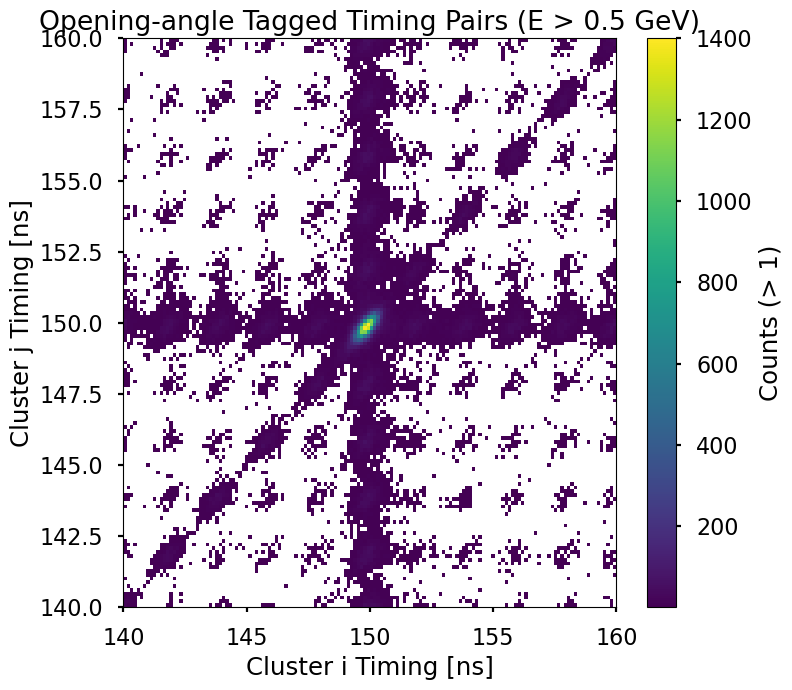

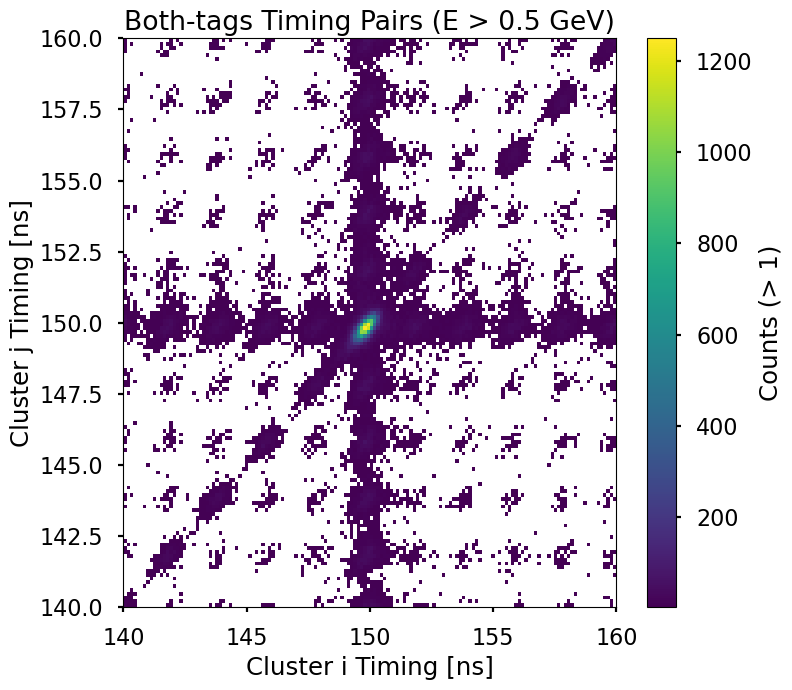

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import awkward as ak
import pandas as pd
import numba as nb

# ==========================================================
#  Load ROOT + CSV data
# ==========================================================
has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
clusT = branches["NPS.cal.clusT"][has_two_clust]

df_csv = pd.read_csv("cluster_tags_fast_temp.csv")

# ----------------------------------------------------------
#  Consistency check
# ----------------------------------------------------------
n_events = len(clusT)
max_event_id = df_csv["event"].max() + 1
if n_events != max_event_id:
    raise ValueError(f"Inconsistent event counts: ROOT={n_events}, CSV={max_event_id}")

# ==========================================================
#  Prepare per-event timing arrays + tag masks
# ==========================================================
def prepare_event_arrays(clusT, df_csv, tag_name):
    grouped = df_csv.groupby("event")
    timing = []
    tagmask = []
    for ev_idx, ev_t in enumerate(clusT):
        tag_ev = grouped.get_group(ev_idx)[tag_name].to_numpy().astype(np.bool_)
        timing.append(np.asarray(ev_t, dtype=np.float64))
        tagmask.append(tag_ev)
    return timing, tagmask


timing_oa, mask_oa = prepare_event_arrays(clusT, df_csv, "opening_angle_tagged")
timing_both, mask_both = prepare_event_arrays(clusT, df_csv, "both_tags")

# ==========================================================
#  Numba-accelerated histogram builder
# ==========================================================
@nb.njit(parallel=True)
def fill_hist_numba(timing_list, mask_list, n_bins, hist_min, hist_max, threshold):
    bin_w = (hist_max - hist_min) / n_bins
    hist = np.zeros((n_bins, n_bins), dtype=np.int32)

    for ev in nb.prange(len(timing_list)):
        t_ev = timing_list[ev]
        m_ev = mask_list[ev]
        n = len(t_ev)
        for i in range(n - 1):
            if not m_ev[i]:
                continue
            ti = t_ev[i]
            if ti < hist_min or ti >= hist_max:
                continue
            for j in range(i + 1, n):
                if not m_ev[j]:
                    continue
                tj = t_ev[j]
                if tj < hist_min or tj >= hist_max:
                    continue
                xi = int((ti - hist_min) / bin_w)
                yj = int((tj - hist_min) / bin_w)
                hist[xi, yj] += 1

    # Threshold filter (mark low-count bins as -1)
    for i in nb.prange(n_bins):
        for j in range(n_bins):
            if hist[i, j] <= threshold:
                hist[i, j] = -1
    return hist

# ==========================================================
#  Helper for plotting
# ==========================================================
def plot_hist_2d(hist, title, hist_min, hist_max, threshold):
    counts_plot = np.where(hist == -1, np.nan, hist)
    n_bins = hist.shape[0]
    X, Y = np.meshgrid(
        np.linspace(hist_min, hist_max, n_bins + 1),
        np.linspace(hist_min, hist_max, n_bins + 1)
    )

    plt.figure(figsize=(8, 7))
    pcm = plt.pcolormesh(X, Y, counts_plot.T, cmap='viridis')
    plt.colorbar(label=f'Counts (> {threshold})')
    plt.xlabel("Cluster i Timing [ns]")
    plt.ylabel("Cluster j Timing [ns]")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# ==========================================================
#  Run and plot for both tag types
# ==========================================================
n_bins = 150
hist_min, hist_max = 140.0, 160.0
threshold = 1

hist_oa = fill_hist_numba(timing_oa, mask_oa, n_bins, hist_min, hist_max, threshold)
hist_both = fill_hist_numba(timing_both, mask_both, n_bins, hist_min, hist_max, threshold)

print("Histograms built with Numba acceleration.")

# Store results
np.savez(
    "cluster_timing_histograms_fast.npz",
    hist_oa=hist_oa,
    hist_both=hist_both,
    hist_min=hist_min,
    hist_max=hist_max,
    n_bins=n_bins,
    threshold=threshold
)

# ==========================================================
#  Plot results
# ==========================================================
plot_hist_2d(hist_oa, "Opening-angle Tagged Timing Pairs (E > 0.5 GeV)", hist_min, hist_max, threshold)
plot_hist_2d(hist_both, "Both-tags Timing Pairs (E > 0.5 GeV)", hist_min, hist_max, threshold)


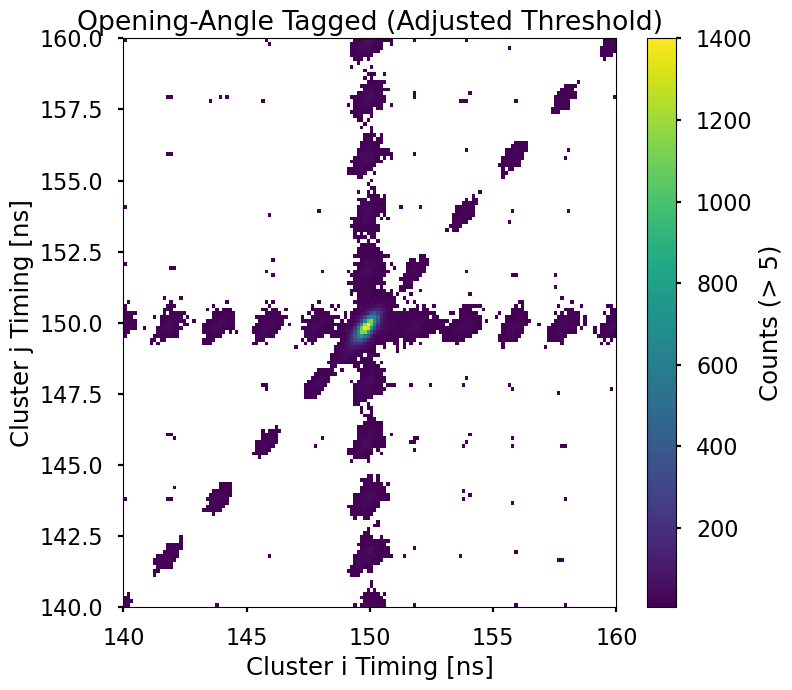

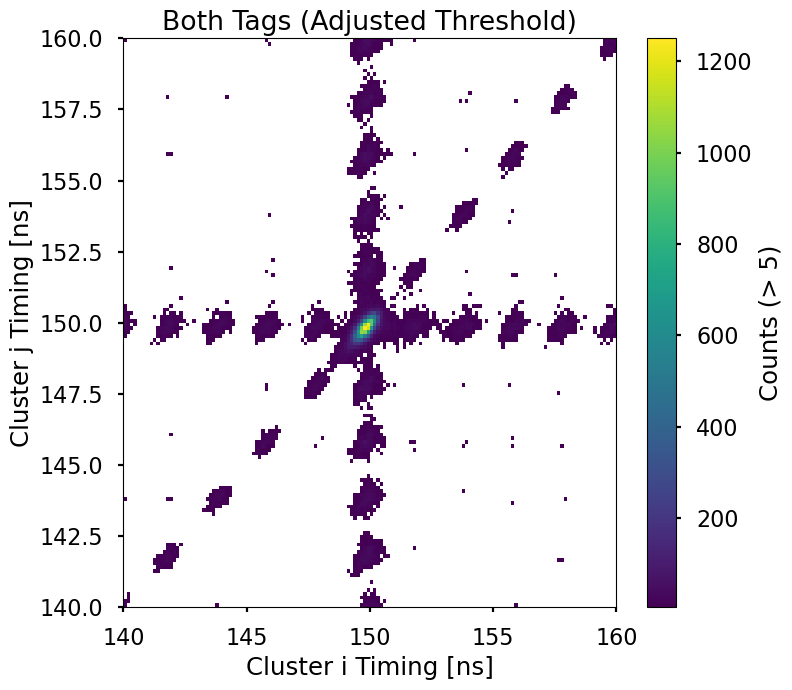

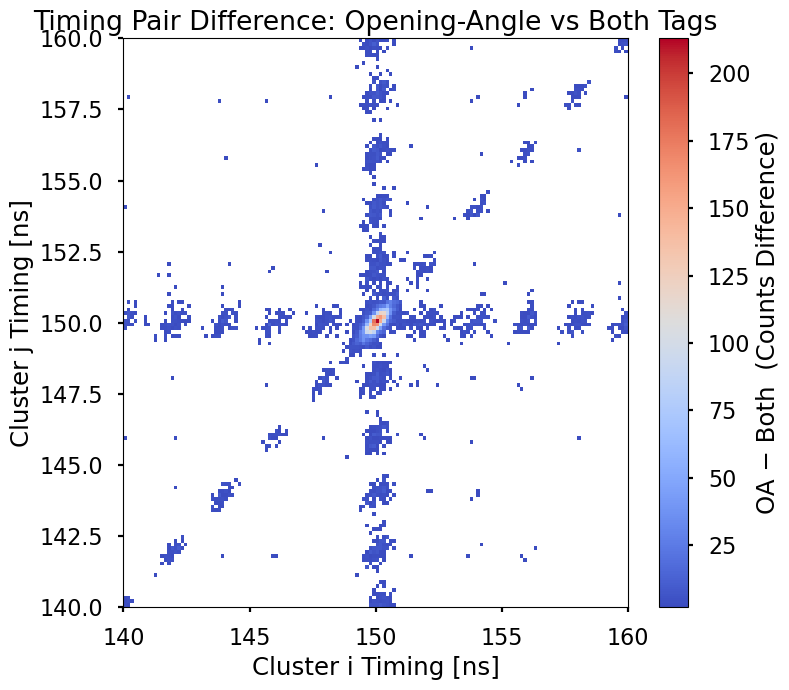

In [67]:
import numpy as np
import matplotlib.pyplot as plt

# Load saved results
data = np.load("cluster_timing_histograms_fast.npz")

hist_oa = data["hist_oa"]
hist_both = data["hist_both"]
hist_min = float(data["hist_min"])
hist_max = float(data["hist_max"])
n_bins = int(data["n_bins"])

def plot_hist_from_npz(hist, title, hist_min, hist_max, threshold=1):
    """Plot histogram with a new threshold applied."""
    # Apply new threshold dynamically (no recomputation)
    counts_plot = np.where(hist > threshold, hist, np.nan)

    X, Y = np.meshgrid(
        np.linspace(hist_min, hist_max, hist.shape[0] + 1),
        np.linspace(hist_min, hist_max, hist.shape[1] + 1)
    )

    plt.figure(figsize=(8, 7))
    pcm = plt.pcolormesh(X, Y, counts_plot.T, cmap="viridis")
    plt.colorbar(label=f"Counts (> {threshold})")
    plt.xlabel("Cluster i Timing [ns]")
    plt.ylabel("Cluster j Timing [ns]")
    plt.title(title)
    plt.tight_layout()
    plt.show()

plot_hist_from_npz(hist_oa, "Opening-Angle Tagged (Adjusted Threshold)", hist_min, hist_max, threshold=5)
plot_hist_from_npz(hist_both, "Both Tags (Adjusted Threshold)", hist_min, hist_max, threshold=5)

# Compute difference
diff_hist = hist_oa.astype(float) - hist_both.astype(float)

# Mask low counts for cleaner plot
threshold = 1
diff_masked = np.where(
    (np.abs(diff_hist) > threshold) & (hist_oa > 0) & (hist_both > 0),
    diff_hist,
    np.nan
)

# Plot comparison
X, Y = np.meshgrid(
    np.linspace(hist_min, hist_max, n_bins + 1),
    np.linspace(hist_min, hist_max, n_bins + 1)
)

plt.figure(figsize=(8, 7))
pcm = plt.pcolormesh(X, Y, diff_masked.T, cmap="coolwarm", shading="auto")
plt.colorbar(label="OA − Both  (Counts Difference)")
plt.xlabel("Cluster i Timing [ns]")
plt.ylabel("Cluster j Timing [ns]")
plt.title("Timing Pair Difference: Opening-Angle vs Both Tags")
plt.tight_layout()
plt.show()


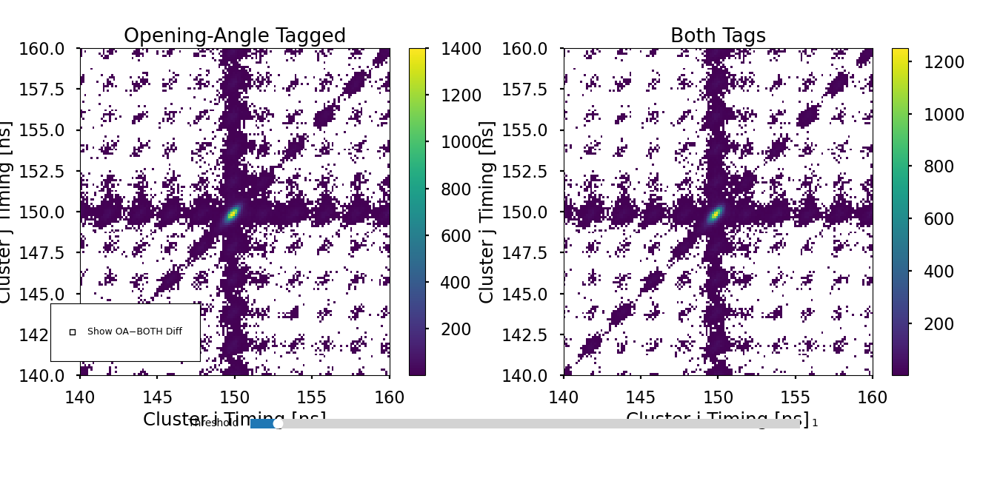

In [4]:
%matplotlib widget
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider, CheckButtons

# ======================
# Load precomputed histograms
# ======================
data = np.load("cluster_timing_histograms_fast.npz")
hist_oa = data["hist_oa"]
hist_both = data["hist_both"]
hist_min = float(data["hist_min"])
hist_max = float(data["hist_max"])
n_bins = int(data["n_bins"])

# ======================
# Helper functions
# ======================
def apply_threshold(hist, threshold):
    """Mask low-count bins below threshold."""
    return np.where(hist > threshold, hist, np.nan)

X, Y = np.meshgrid(
    np.linspace(hist_min, hist_max, n_bins + 1),
    np.linspace(hist_min, hist_max, n_bins + 1)
)

# ======================
# Figure setup
# ======================
init_threshold = 1
fig, axes = plt.subplots(1, 2, figsize=(13.5, 6.5))
plt.subplots_adjust(left=0.08, right=0.95, top=0.9, bottom=0.22, wspace=0.25)

# Initial plots
masked_oa = apply_threshold(hist_oa, init_threshold)
masked_both = apply_threshold(hist_both, init_threshold)

pcm_oa = axes[0].pcolormesh(X, Y, masked_oa.T, cmap="viridis", shading="auto")
pcm_both = axes[1].pcolormesh(X, Y, masked_both.T, cmap="viridis", shading="auto")

axes[0].set_title("Opening-Angle Tagged")
axes[1].set_title("Both Tags")

for ax in axes:
    ax.set_xlabel("Cluster i Timing [ns]")
    ax.set_ylabel("Cluster j Timing [ns]")

# cbar_oa = fig.colorbar(pcm_oa, ax=axes[0], label=f"Counts (> {init_threshold})")
# cbar_both = fig.colorbar(pcm_both, ax=axes[1], label=f"Counts (> {init_threshold})")
cbar_oa = fig.colorbar(pcm_oa, ax=axes[0])
cbar_both = fig.colorbar(pcm_both, ax=axes[1])

# ======================
# Slider and checkbox widgets (cleaner placement)
# ======================
ax_slider = plt.axes([0.25, 0.10, 0.55, 0.04])   # slightly lower & larger
threshold_slider = Slider(ax_slider, "Threshold", 0, 20, valinit=init_threshold, valstep=1)

ax_checkbox = plt.axes([0.05, 0.25, 0.15, 0.12])  # top-left corner, compact
checkbox = CheckButtons(ax_checkbox, ["Show OA−BOTH Diff"], [False])

# Make checkbox labels slightly smaller for better fit
for label in checkbox.labels:
    label.set_fontsize(9)

# ======================
# Update function
# ======================
def update(val):
    threshold = threshold_slider.val
    show_diff = checkbox.get_status()[0]

    if not show_diff:
        # Normal two-panel mode
        axes[1].set_visible(True)
        pcm_oa.set_cmap("viridis")

        masked_oa = apply_threshold(hist_oa, threshold)
        masked_both = apply_threshold(hist_both, threshold)

        pcm_oa.set_array(masked_oa.T.ravel())
        pcm_both.set_array(masked_both.T.ravel())

        pcm_oa.set_clim(vmin=np.nanmin(masked_oa), vmax=np.nanmax(masked_oa))
        pcm_both.set_clim(vmin=np.nanmin(masked_both), vmax=np.nanmax(masked_both))

        cbar_oa.update_normal(pcm_oa)
        cbar_both.update_normal(pcm_both)

        axes[0].set_title(f"Opening-Angle Tagged (>{threshold})")
        axes[1].set_title(f"Both Tags (>{threshold})")

    else:
        # OA−BOTH difference
        diff_hist = hist_oa.astype(float) - hist_both.astype(float)
        diff_masked = np.where(np.abs(diff_hist) > threshold, diff_hist, np.nan)

        axes[1].set_visible(False)
        pcm_oa.set_array(diff_masked.T.ravel())
        pcm_oa.set_cmap("coolwarm")
        pcm_oa.set_clim(vmin=-np.nanmax(abs(diff_masked)), vmax=np.nanmax(abs(diff_masked)))
        cbar_oa.update_normal(pcm_oa)

        axes[0].set_title(f"Difference (OA − BOTH), threshold={threshold}")

    fig.canvas.draw_idle()

threshold_slider.on_changed(update)
checkbox.on_clicked(update)

plt.show()


Histograms (2D + 1D) built with Numba acceleration.


/tmp/ipykernel_1354/2120349318.py:166: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


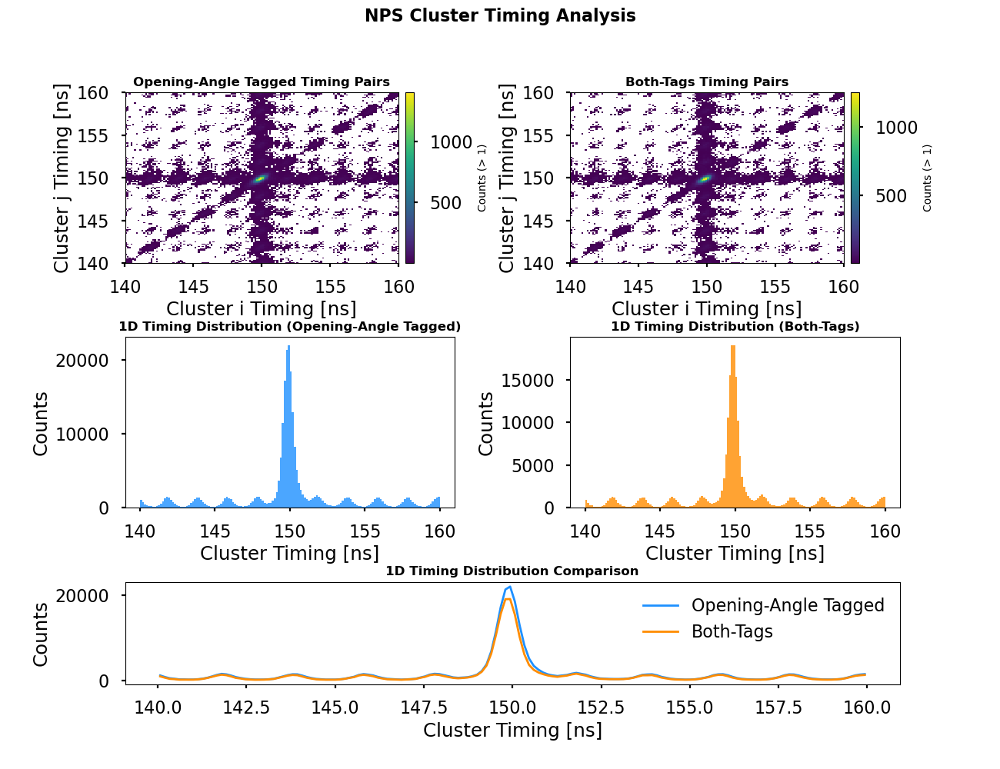

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import awkward as ak
import pandas as pd
import numba as nb
import matplotlib.gridspec as gridspec

# ==========================================================
#  Load ROOT + CSV data
# ==========================================================
has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
clusT = branches["NPS.cal.clusT"][has_two_clust]

df_csv = pd.read_csv("cluster_tags_fast_temp.csv")

# ----------------------------------------------------------
#  Consistency check
# ----------------------------------------------------------
n_events = len(clusT)
max_event_id = df_csv["event"].max() + 1
if n_events != max_event_id:
    raise ValueError(f"Inconsistent event counts: ROOT={n_events}, CSV={max_event_id}")

# ==========================================================
#  Prepare per-event timing arrays + tag masks
# ==========================================================
def prepare_event_arrays(clusT, df_csv, tag_name):
    grouped = df_csv.groupby("event")
    timing = []
    tagmask = []
    for ev_idx, ev_t in enumerate(clusT):
        tag_ev = grouped.get_group(ev_idx)[tag_name].to_numpy().astype(np.bool_)
        timing.append(np.asarray(ev_t, dtype=np.float64))
        tagmask.append(tag_ev)
    return timing, tagmask

timing_oa, mask_oa = prepare_event_arrays(clusT, df_csv, "opening_angle_tagged")
timing_both, mask_both = prepare_event_arrays(clusT, df_csv, "both_tags")

# ==========================================================
#  Numba-accelerated 2D histogram builder
# ==========================================================
@nb.njit(parallel=True)
def fill_hist_numba(timing_list, mask_list, n_bins, hist_min, hist_max, threshold):
    bin_w = (hist_max - hist_min) / n_bins
    hist = np.zeros((n_bins, n_bins), dtype=np.int32)

    for ev in nb.prange(len(timing_list)):
        t_ev = timing_list[ev]
        m_ev = mask_list[ev]
        n = len(t_ev)
        for i in range(n - 1):
            if not m_ev[i]:
                continue
            ti = t_ev[i]
            if ti < hist_min or ti >= hist_max:
                continue
            for j in range(i + 1, n):
                if not m_ev[j]:
                    continue
                tj = t_ev[j]
                if tj < hist_min or tj >= hist_max:
                    continue
                xi = int((ti - hist_min) / bin_w)
                yj = int((tj - hist_min) / bin_w)
                hist[xi, yj] += 1

    for i in nb.prange(n_bins):
        for j in range(n_bins):
            if hist[i, j] <= threshold:
                hist[i, j] = -1
    return hist

# ==========================================================
#  1D histogram builder
# ==========================================================
def build_1d_hist(timing_list, mask_list, n_bins, hist_min, hist_max):
    all_vals = []
    for t_ev, m_ev in zip(timing_list, mask_list):
        all_vals.extend(t_ev[m_ev])
    counts, edges = np.histogram(all_vals, bins=n_bins, range=(hist_min, hist_max))
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, counts


# ==========================================================
#  Helper for plotting (clean layout)
# ==========================================================
def plot_results(hist_oa, hist_both, centers_oa, counts_oa, centers_both, counts_both, hist_min, hist_max, threshold):
    # Figure layout using GridSpec for better control
    fig = plt.figure(figsize=(13, 10))
    gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 0.6], hspace=0.5, wspace=0.35)

    # ==========================================================
    # 2D Opening-Angle Tagged
    # ==========================================================
    ax1 = fig.add_subplot(gs[0, 0])
    counts_plot_oa = np.where(hist_oa == -1, np.nan, hist_oa)
    n_bins = hist_oa.shape[0]
    X, Y = np.meshgrid(
        np.linspace(hist_min, hist_max, n_bins + 1),
        np.linspace(hist_min, hist_max, n_bins + 1)
    )
    pcm1 = ax1.pcolormesh(X, Y, counts_plot_oa.T, cmap='viridis')
    cbar1 = fig.colorbar(pcm1, ax=ax1, pad=0.02)
    cbar1.set_label(f'Counts (> {threshold})', fontsize=10)
    ax1.set_title("Opening-Angle Tagged Timing Pairs", fontsize=12, fontweight="bold")
    ax1.set_xlabel("Cluster i Timing [ns]")
    ax1.set_ylabel("Cluster j Timing [ns]")

    # ==========================================================
    # 2D Both-Tags
    # ==========================================================
    ax2 = fig.add_subplot(gs[0, 1])
    counts_plot_both = np.where(hist_both == -1, np.nan, hist_both)
    pcm2 = ax2.pcolormesh(X, Y, counts_plot_both.T, cmap='viridis')
    cbar2 = fig.colorbar(pcm2, ax=ax2, pad=0.02)
    cbar2.set_label(f'Counts (> {threshold})', fontsize=10)
    ax2.set_title("Both-Tags Timing Pairs", fontsize=12, fontweight="bold")
    ax2.set_xlabel("Cluster i Timing [ns]")
    ax2.set_ylabel("Cluster j Timing [ns]")

    # ==========================================================
    # 1D Opening-Angle Tagged
    # ==========================================================
    ax3 = fig.add_subplot(gs[1, 0])
    ax3.bar(
        centers_oa, counts_oa,
        width=(centers_oa[1] - centers_oa[0]),
        color='dodgerblue', alpha=0.8
        # , edgecolor='black', linewidth=0.5
    )
    ax3.set_title("1D Timing Distribution (Opening-Angle Tagged)", fontsize=12, fontweight="bold")
    ax3.set_xlabel("Cluster Timing [ns]")
    ax3.set_ylabel("Counts")

    # ==========================================================
    # 1D Both-Tags
    # ==========================================================
    ax4 = fig.add_subplot(gs[1, 1])
    ax4.bar(
        centers_both, counts_both,
        width=(centers_both[1] - centers_both[0]),
        color='darkorange', alpha=0.8
        # , edgecolor='black', linewidth=0.5
    )
    ax4.set_title("1D Timing Distribution (Both-Tags)", fontsize=12, fontweight="bold")
    ax4.set_xlabel("Cluster Timing [ns]")
    ax4.set_ylabel("Counts")

    # ==========================================================
    # Combined Comparison (Overlay)
    # ==========================================================
    ax5 = fig.add_subplot(gs[2, :])
    ax5.plot(centers_oa, counts_oa, color='dodgerblue', lw=2, label="Opening-Angle Tagged")
    ax5.plot(centers_both, counts_both, color='darkorange', lw=2, label="Both-Tags")
    ax5.set_title("1D Timing Distribution Comparison", fontsize=12, fontweight="bold")
    ax5.set_xlabel("Cluster Timing [ns]")
    ax5.set_ylabel("Counts")
    ax5.legend(frameon=False)

    # ==========================================================
    # Global Figure Title and Formatting
    # ==========================================================
    fig.suptitle("NPS Cluster Timing Analysis", fontsize=16, fontweight='bold', y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# ==========================================================
#  Run analysis
# ==========================================================
n_bins = 150
hist_min, hist_max = 140.0, 160.0
threshold = 1

hist_oa = fill_hist_numba(timing_oa, mask_oa, n_bins, hist_min, hist_max, threshold)
hist_both = fill_hist_numba(timing_both, mask_both, n_bins, hist_min, hist_max, threshold)

centers_oa, counts_oa = build_1d_hist(timing_oa, mask_oa, n_bins, hist_min, hist_max)
centers_both, counts_both = build_1d_hist(timing_both, mask_both, n_bins, hist_min, hist_max)

print("Histograms (2D + 1D) built with Numba acceleration.")

# Store results
np.savez(
    "cluster_timing_histograms_full.npz",
    hist_oa=hist_oa,
    hist_both=hist_both,
    centers_oa=centers_oa,
    counts_oa=counts_oa,
    centers_both=centers_both,
    counts_both=counts_both,
    hist_min=hist_min,
    hist_max=hist_max,
    n_bins=n_bins,
    threshold=threshold
)

# Plot
plot_results(hist_oa, hist_both, centers_oa, counts_oa, centers_both, counts_both, hist_min, hist_max, threshold)


/tmp/ipykernel_1226/1721888933.py:96: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


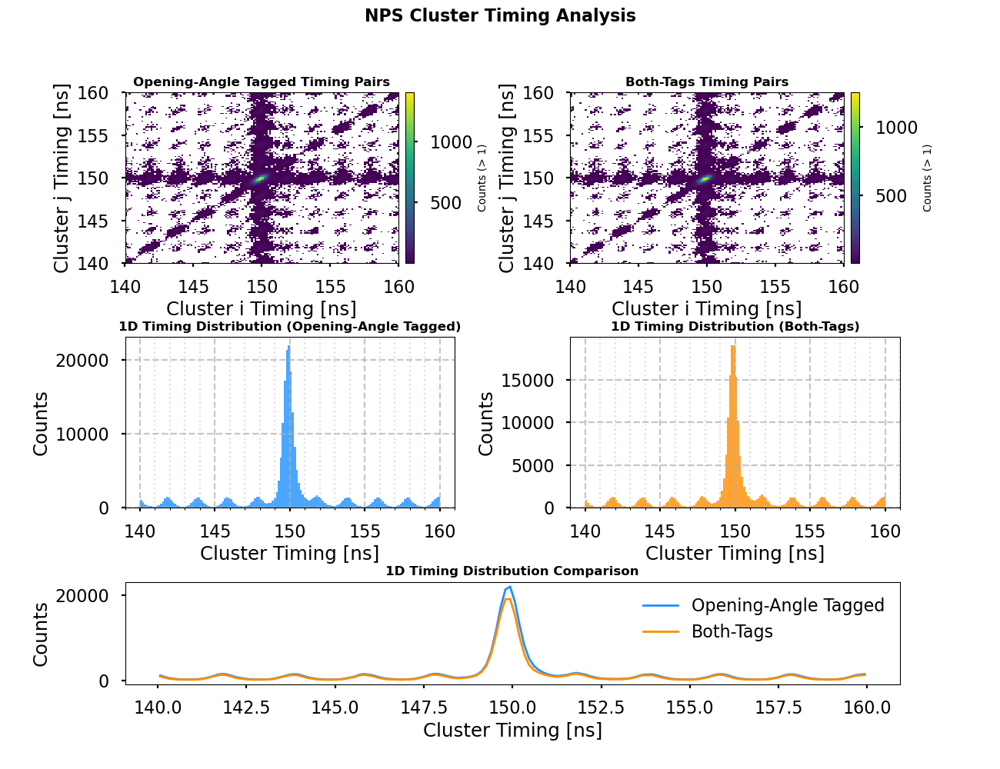

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker

# ==========================================================
#  Helper for plotting (clean layout)
# ==========================================================
def plot_results(hist_oa, hist_both, centers_oa, counts_oa, centers_both, counts_both, hist_min, hist_max, threshold):
    # Figure layout using GridSpec for better control
    fig = plt.figure(figsize=(13, 10))
    gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 0.6], hspace=0.5, wspace=0.35)

    # ==========================================================
    # 2D Opening-Angle Tagged
    # ==========================================================
    ax1 = fig.add_subplot(gs[0, 0])
    counts_plot_oa = np.where(hist_oa == -1, np.nan, hist_oa)
    n_bins = hist_oa.shape[0]
    X, Y = np.meshgrid(
        np.linspace(hist_min, hist_max, n_bins + 1),
        np.linspace(hist_min, hist_max, n_bins + 1)
    )
    pcm1 = ax1.pcolormesh(X, Y, counts_plot_oa.T, cmap='viridis')
    cbar1 = fig.colorbar(pcm1, ax=ax1, pad=0.02)
    cbar1.set_label(f'Counts (> {threshold})', fontsize=10)
    ax1.set_title("Opening-Angle Tagged Timing Pairs", fontsize=12, fontweight="bold")
    ax1.set_xlabel("Cluster i Timing [ns]")
    ax1.set_ylabel("Cluster j Timing [ns]")

    # ==========================================================
    # 2D Both-Tags
    # ==========================================================
    ax2 = fig.add_subplot(gs[0, 1])
    counts_plot_both = np.where(hist_both == -1, np.nan, hist_both)
    pcm2 = ax2.pcolormesh(X, Y, counts_plot_both.T, cmap='viridis')
    cbar2 = fig.colorbar(pcm2, ax=ax2, pad=0.02)
    cbar2.set_label(f'Counts (> {threshold})', fontsize=10)
    ax2.set_title("Both-Tags Timing Pairs", fontsize=12, fontweight="bold")
    ax2.set_xlabel("Cluster i Timing [ns]")
    ax2.set_ylabel("Cluster j Timing [ns]")

    # ==========================================================
    # 1D Opening-Angle Tagged
    # ==========================================================
    ax3 = fig.add_subplot(gs[1, 0])
    ax3.bar(
        centers_oa, counts_oa,
        width=(centers_oa[1] - centers_oa[0]),
        color='dodgerblue', alpha=0.8
        # , edgecolor='black', linewidth=0.5
    )
    ax3.set_title("1D Timing Distribution (Opening-Angle Tagged)", fontsize=12, fontweight="bold")
    ax3.set_xlabel("Cluster Timing [ns]")
    ax3.set_ylabel("Counts")
    # Minor gridlines every 1 ns
    ax3 = plt.gca()
    ax3.xaxis.set_minor_locator(mticker.MultipleLocator(1))
    ax3.grid(which='major', linestyle='--', alpha=0.7)
    ax3.grid(which='minor', linestyle=':', alpha=0.4)

    # ==========================================================
    # 1D Both-Tags
    # ==========================================================
    ax4 = fig.add_subplot(gs[1, 1])
    ax4.bar(
        centers_both, counts_both,
        width=(centers_both[1] - centers_both[0]),
        color='darkorange', alpha=0.8
        # , edgecolor='black', linewidth=0.5
    )
    ax4.set_title("1D Timing Distribution (Both-Tags)", fontsize=12, fontweight="bold")
    ax4.set_xlabel("Cluster Timing [ns]")
    ax4.set_ylabel("Counts")
    # Minor gridlines every 1 ns
    ax4 = plt.gca()
    ax4.xaxis.set_minor_locator(mticker.MultipleLocator(1))
    ax4.grid(which='major', linestyle='--', alpha=0.7)
    ax4.grid(which='minor', linestyle=':', alpha=0.4)

    # ==========================================================
    # Combined Comparison (Overlay)
    # ==========================================================
    ax5 = fig.add_subplot(gs[2, :])
    ax5.plot(centers_oa, counts_oa, color='dodgerblue', lw=2, label="Opening-Angle Tagged")
    ax5.plot(centers_both, counts_both, color='darkorange', lw=2, label="Both-Tags")
    ax5.set_title("1D Timing Distribution Comparison", fontsize=12, fontweight="bold")
    ax5.set_xlabel("Cluster Timing [ns]")
    ax5.set_ylabel("Counts")
    ax5.legend(frameon=False)

    # ==========================================================
    # Global Figure Title and Formatting
    # ==========================================================
    fig.suptitle("NPS Cluster Timing Analysis", fontsize=16, fontweight='bold', y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# import matplotlib.pyplot as plt
# import numpy as np
# import matplotlib.gridspec as gridspec

# # ==========================================================
# #  Enhanced plotting function (with entry counts)
# # ==========================================================
# def plot_results(
#     hist_oa, hist_both,
#     centers_oa, counts_oa,
#     centers_both, counts_both,
#     hist_min, hist_max, threshold
# ):
#     # --- compute entry counts ---
#     total_entries_oa = np.sum(hist_oa[hist_oa > 0])
#     total_entries_both = np.sum(hist_both[hist_both > 0])

#     surviving_entries_oa = np.sum(hist_oa[hist_oa > threshold])
#     surviving_entries_both = np.sum(hist_both[hist_both > threshold])

#     # --- layout setup ---
#     fig = plt.figure(figsize=(13, 10))
#     gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 0.6], hspace=0.5, wspace=0.35)

#     # ==========================================================
#     # 2D Opening-Angle Tagged
#     # ==========================================================
#     ax1 = fig.add_subplot(gs[0, 0])
#     counts_plot_oa = np.where(hist_oa == -1, np.nan, hist_oa)
#     n_bins = hist_oa.shape[0]
#     X, Y = np.meshgrid(
#         np.linspace(hist_min, hist_max, n_bins + 1),
#         np.linspace(hist_min, hist_max, n_bins + 1)
#     )
#     pcm1 = ax1.pcolormesh(X, Y, counts_plot_oa.T, cmap='viridis')
#     cbar1 = fig.colorbar(pcm1, ax=ax1, pad=0.02)
#     cbar1.set_label(f'Counts (> {threshold})', fontsize=10)
#     ax1.set_title(
#         f"Opening-Angle Tagged Timing Pairs\n"
#         f"Entries: {total_entries_oa:,} | >thr: {surviving_entries_oa:,}",
#         fontsize=12, fontweight="bold"
#     )
#     ax1.set_xlabel("Cluster i Timing [ns]")
#     ax1.set_ylabel("Cluster j Timing [ns]")

#     # ==========================================================
#     # 2D Both-Tags
#     # ==========================================================
#     ax2 = fig.add_subplot(gs[0, 1])
#     counts_plot_both = np.where(hist_both == -1, np.nan, hist_both)
#     pcm2 = ax2.pcolormesh(X, Y, counts_plot_both.T, cmap='viridis')
#     cbar2 = fig.colorbar(pcm2, ax=ax2, pad=0.02)
#     cbar2.set_label(f'Counts (> {threshold})', fontsize=10)
#     ax2.set_title(
#         f"Both-Tags Timing Pairs\n"
#         f"Entries: {total_entries_both:,} | >thr: {surviving_entries_both:,}",
#         fontsize=12, fontweight="bold"
#     )
#     ax2.set_xlabel("Cluster i Timing [ns]")
#     ax2.set_ylabel("Cluster j Timing [ns]")

#     # ==========================================================
#     # 1D Opening-Angle Tagged
#     # ==========================================================
#     ax3 = fig.add_subplot(gs[1, 0])
#     ax3.bar(
#         centers_oa, counts_oa,
#         width=(centers_oa[1] - centers_oa[0]),
#         color='dodgerblue', alpha=0.8, edgecolor='black', linewidth=0.5
#     )
#     ax3.set_title(
#         f"1D Timing (OA Tagged)\nEntries: {int(np.sum(counts_oa)):,}",
#         fontsize=12, fontweight="bold"
#     )
#     ax3.set_xlabel("Cluster Timing [ns]")
#     ax3.set_ylabel("Counts")

#     # ==========================================================
#     # 1D Both-Tags
#     # ==========================================================
#     ax4 = fig.add_subplot(gs[1, 1])
#     ax4.bar(
#         centers_both, counts_both,
#         width=(centers_both[1] - centers_both[0]),
#         color='darkorange', alpha=0.8, edgecolor='black', linewidth=0.5
#     )
#     ax4.set_title(
#         f"1D Timing (Both Tags)\nEntries: {int(np.sum(counts_both)):,}",
#         fontsize=12, fontweight="bold"
#     )
#     ax4.set_xlabel("Cluster Timing [ns]")
#     ax4.set_ylabel("Counts")

#     # ==========================================================
#     # Combined 1D Comparison
#     # ==========================================================
#     ax5 = fig.add_subplot(gs[2, :])
#     ax5.plot(centers_oa, counts_oa, color='dodgerblue', lw=2, label=f"OA Tagged ({int(np.sum(counts_oa)):,})")
#     ax5.plot(centers_both, counts_both, color='darkorange', lw=2, label=f"Both Tags ({int(np.sum(counts_both)):,})")
#     ax5.set_title("1D Timing Comparison (OA vs Both)", fontsize=12, fontweight="bold")
#     ax5.set_xlabel("Cluster Timing [ns]")
#     ax5.set_ylabel("Counts")
#     ax5.legend(frameon=False, fontsize=10)

#     # ==========================================================
#     # Figure formatting
#     # ==========================================================
#     fig.suptitle("NPS Cluster Timing Analysis", fontsize=16, fontweight='bold', y=0.99)
#     plt.tight_layout(rect=[0, 0, 1, 0.96])
#     plt.show()


data = np.load("cluster_timing_histograms_full.npz")
hist_oa = data["hist_oa"]
hist_both = data["hist_both"]
centers_oa = data["centers_oa"]
counts_oa = data["counts_oa"]
centers_both = data["centers_both"]
counts_both = data["counts_both"]
hist_min = float(data["hist_min"])
hist_max = float(data["hist_max"])
n_bins = int(data["n_bins"])
threshold = int(data["threshold"])

# You can replot easily:
plot_results(hist_oa, hist_both, centers_oa, counts_oa, centers_both, counts_both, hist_min, hist_max, threshold)


In [ ]:
# df_csv[df_csv["event"]==5]
# df_csv.head()
# for times in clusT:
#     # Generate all unique 2-combinations
#     for t0, t1 in itertools.combinations(times, 2):a
#         print(t0,t1)
# clusT

,event,cluster_index,energy,x,y,inequality_tagged,opening_angle_tagged,both_tags
0,0,0,0.276418,-21.415045,5.400000,True,False,False
1,0,1,0.620013,-19.578661,-33.480000,True,False,False
2,0,2,0.075619,-24.840000,-27.000000,True,False,False
3,0,3,0.242769,-20.520000,-31.320000,True,False,False
4,1,0,0.489423,9.720000,-19.293213,True,False,False


In [5]:
# clusT
import pandas as pd
df_csv = pd.read_csv("cluster_tags_fast_temp.csv")
df_csv.loc[df_csv['both_tags'], 'energy'].max()

15.549263

In [33]:
df_csv[df_csv["event"]==2]

,event,cluster_index,energy,x,y,inequality_tagged,opening_angle_tagged,both_tags
6,2,0,0.248884,-14.04,-37.80,True,False,False
7,2,1,0.286875,-18.36,-1.08,True,False,False


Building Δt histogram for OA...
Building Δt histogram for BOTH...
Saved Δt histograms to cluster_dt_histograms.npz


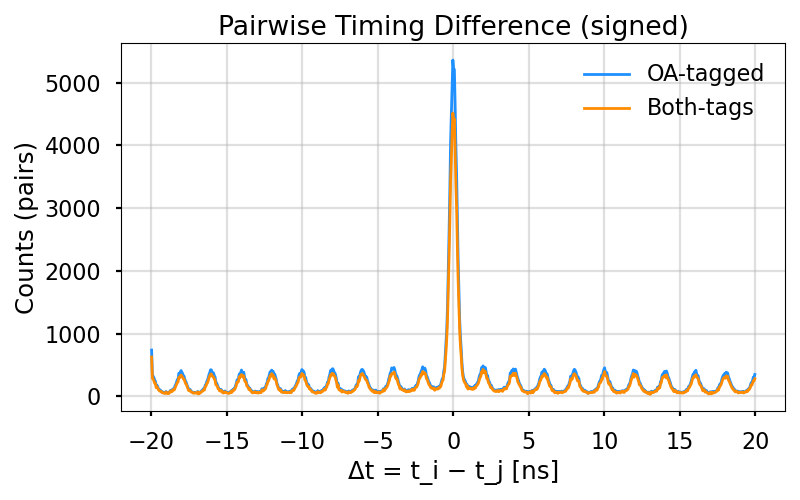

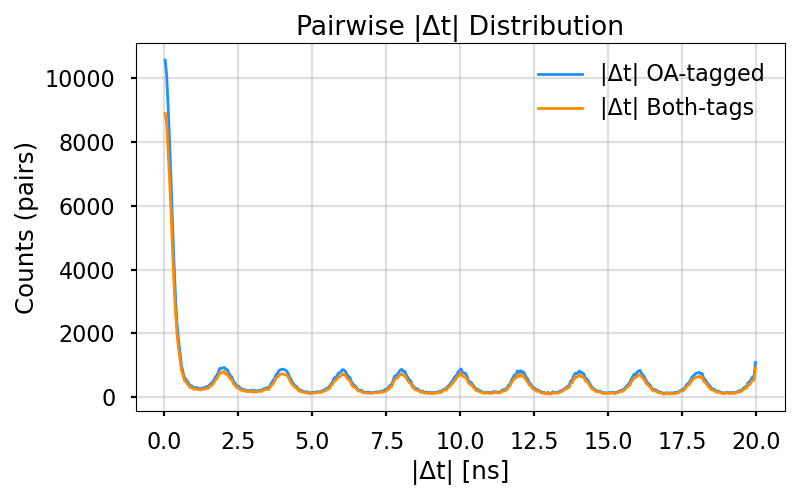

In [ ]:
#!/usr/bin/env python3
import numpy as np
import pandas as pd
import awkward as ak
import matplotlib.pyplot as plt
import numba as nb


df_csv = pd.read_csv("cluster_tags_fast_temp.csv")

# Select only events with ≥ 2 clusters
has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
clusT = branches["NPS.cal.clusT"][has_two_clust]

# Consistency check
n_events = len(clusT)
max_event_id = df_csv["event"].max() + 1
if n_events != max_event_id:
    raise ValueError(f"Inconsistent event counts: ROOT={n_events}, CSV={max_event_id}")

# ==========================================================
#  Prepare per-event arrays
# ==========================================================
def prepare_event_arrays(clusT, df_csv, tag_name):
    grouped = df_csv.groupby("event")
    timing, tagmask = [], []
    for ev_idx, ev_t in enumerate(clusT):
        tag_ev = grouped.get_group(ev_idx)[tag_name].to_numpy().astype(np.bool_)
        timing.append(np.asarray(ev_t, dtype=np.float64))
        tagmask.append(tag_ev)
    return timing, tagmask

timing_oa, mask_oa = prepare_event_arrays(clusT, df_csv, "opening_angle_tagged")
timing_both, mask_both = prepare_event_arrays(clusT, df_csv, "both_tags")

# ==========================================================
#  Numba kernel for Δt histogram (unique unordered pairs)
# ==========================================================
@nb.njit(parallel=True)
def dt_hist_numba(timing_list, mask_list, dt_min, dt_max, n_bins):
    hist = np.zeros(n_bins, dtype=np.int64)
    bin_w = (dt_max - dt_min) / n_bins

    for ev in nb.prange(len(timing_list)):
        t_ev = timing_list[ev]
        m_ev = mask_list[ev]
        n = len(t_ev)
        if n < 2:
            continue
        for i in range(n - 1):
            if not m_ev[i]:
                continue
            ti = t_ev[i]
            for j in range(i + 1, n):
                if not m_ev[j]:
                    continue
                tj = t_ev[j]
                dt = ti - tj
                idx = int((dt - dt_min) / bin_w)
                if 0 <= idx < n_bins:
                    hist[idx] += 1
    return hist

# ==========================================================
#  Compute Δt histograms for OA and BOTH tags
# ==========================================================
def compute_dt_histograms(timing, mask, dt_min, dt_max, n_bins, tag_name):
    print(f"Building Δt histogram for {tag_name}...")
    hist = dt_hist_numba(timing, mask, dt_min, dt_max, n_bins)
    edges = np.linspace(dt_min, dt_max, n_bins + 1)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, hist

dt_min, dt_max, n_bins = -20.0, 20.0, 800

centers_oa, hist_oa = compute_dt_histograms(timing_oa, mask_oa, dt_min, dt_max, n_bins, "OA")
centers_both, hist_both = compute_dt_histograms(timing_both, mask_both, dt_min, dt_max, n_bins, "BOTH")

# ==========================================================
#  Save results
# ==========================================================
np.savez_compressed(
    "cluster_dt_histograms.npz",
    centers_oa=centers_oa, hist_oa=hist_oa,
    centers_both=centers_both, hist_both=hist_both,
    dt_min=dt_min, dt_max=dt_max, n_bins=n_bins
)

print("Saved Δt histograms to cluster_dt_histograms.npz")

# # ==========================================================
# #  Plot signed and |Δt|
# # ==========================================================
# def plot_dt_results(centers_oa, hist_oa, centers_both, hist_both):
#     # Signed Δt
#     plt.figure(figsize=(8,5))
#     plt.plot(centers_oa, hist_oa, color="dodgerblue", lw=2, label="OA-tagged")
#     plt.plot(centers_both, hist_both, color="darkorange", lw=2, label="Both-tags")
#     plt.xlabel("Δt = t_i − t_j [ns]")
#     plt.ylabel("Counts (pairs)")
#     plt.title("Pairwise Timing Difference (signed)")
#     plt.legend(frameon=False)
#     plt.grid(alpha=0.4)
#     plt.tight_layout()
#     plt.show()

#     # |Δt|
#     half = n_bins // 2
#     folded_oa = hist_oa[half:] + hist_oa[:half][::-1]
#     folded_both = hist_both[half:] + hist_both[:half][::-1]
#     abs_centers = centers_oa[half:]

#     plt.figure(figsize=(8,5))
#     plt.plot(abs_centers, folded_oa, color="dodgerblue", lw=2, label="|Δt| OA-tagged")
#     plt.plot(abs_centers, folded_both, color="darkorange", lw=2, label="|Δt| Both-tags")
#     plt.xlabel("|Δt| [ns]")
#     plt.ylabel("Counts (pairs)")
#     plt.title("Pairwise |Δt| Distribution")
#     plt.legend(frameon=False)
#     plt.grid(alpha=0.4)
#     plt.tight_layout()
#     plt.show()

# plot_dt_results(centers_oa, hist_oa, centers_both, hist_both)



Processing events with 2 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


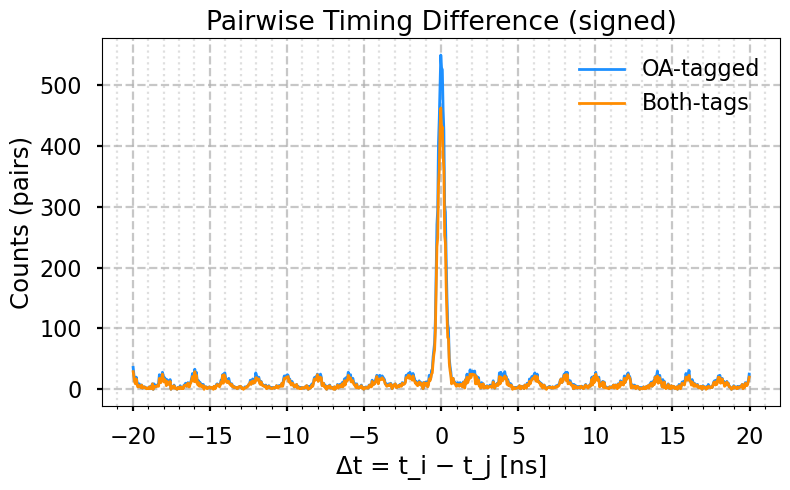


Processing events with 3 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


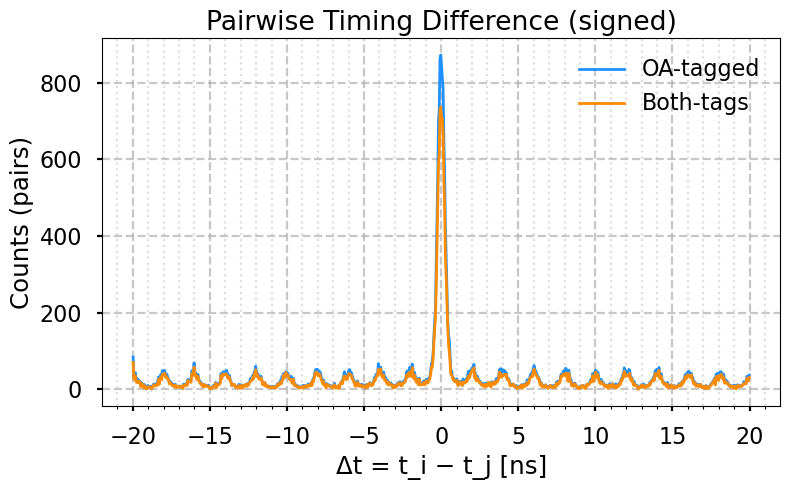


Processing events with 4 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


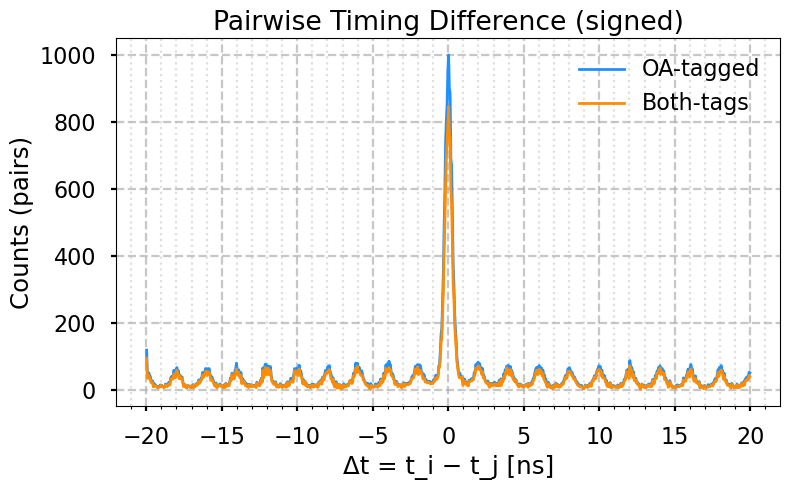


Processing events with 5 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


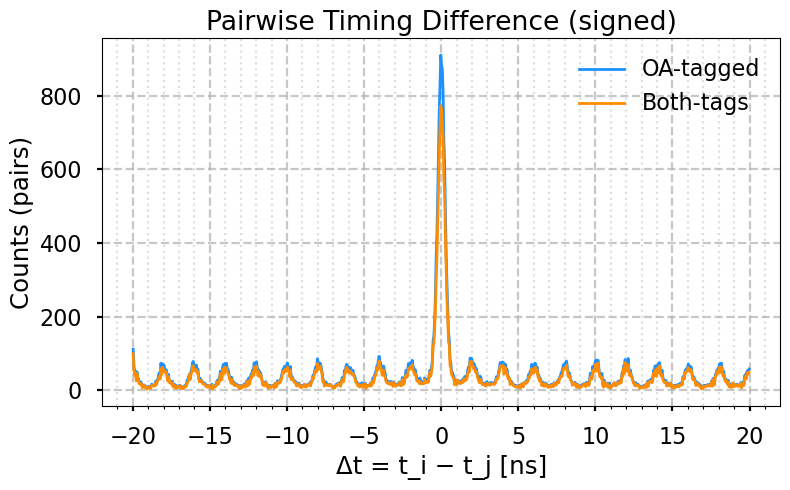


Processing events with 6 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


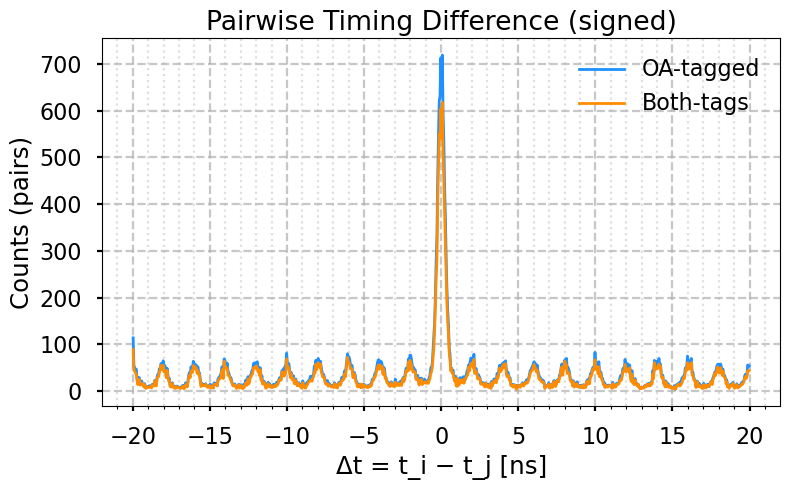


Processing events with 7 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


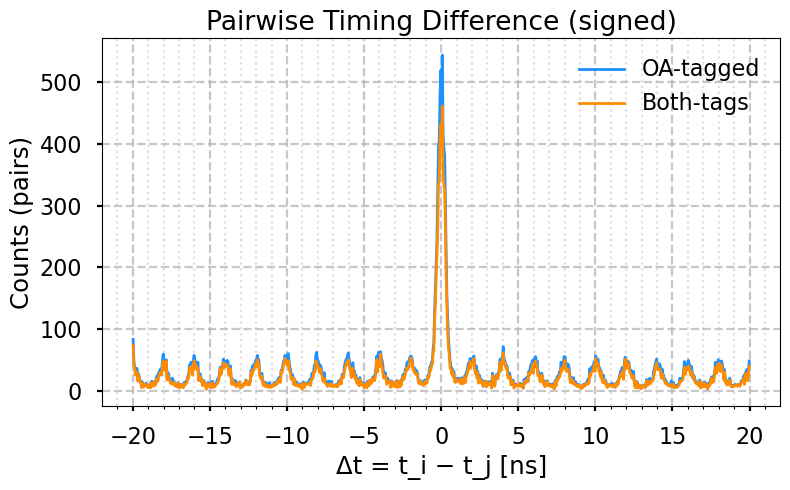


Processing events with 8 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


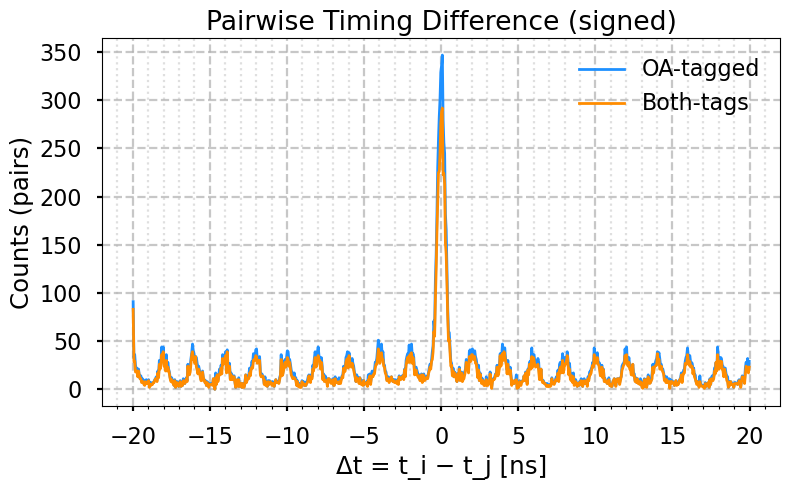


Processing events with 9 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


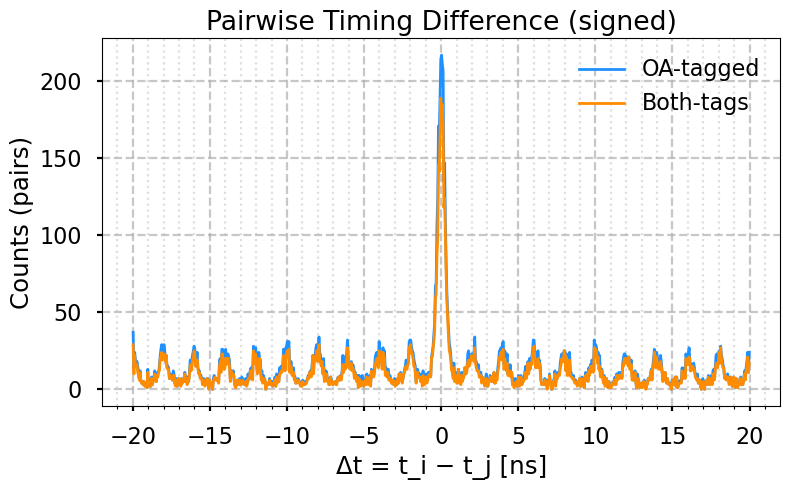


Processing events with 10 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


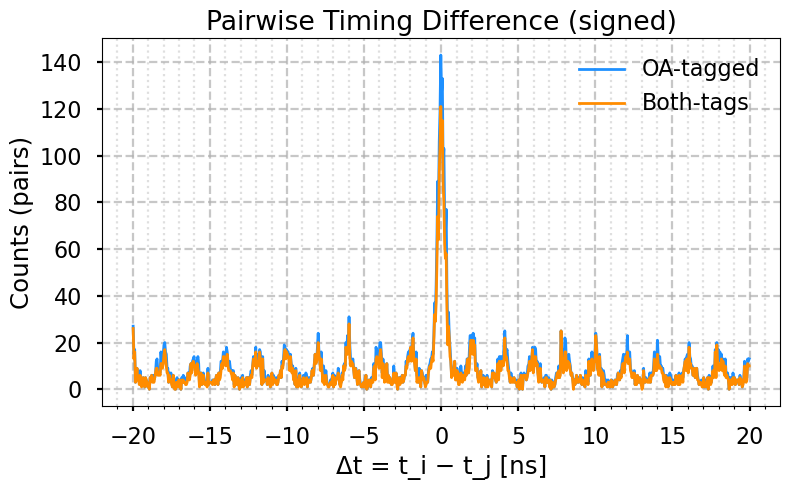


Processing events with 11 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


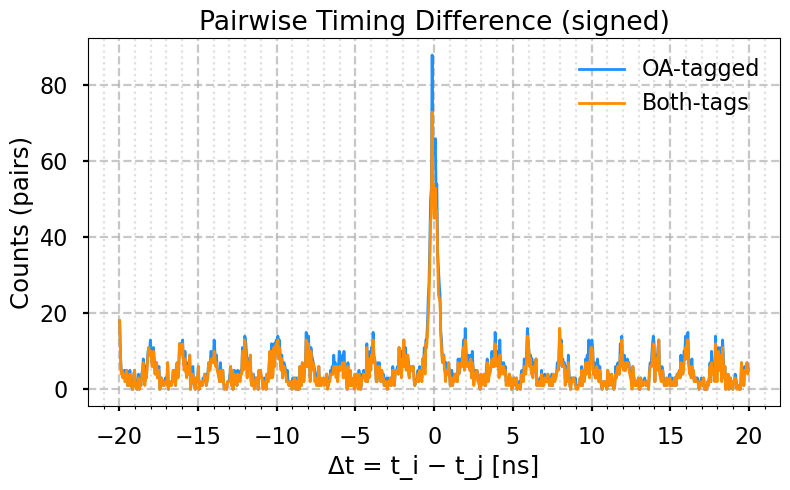


Processing events with 12 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


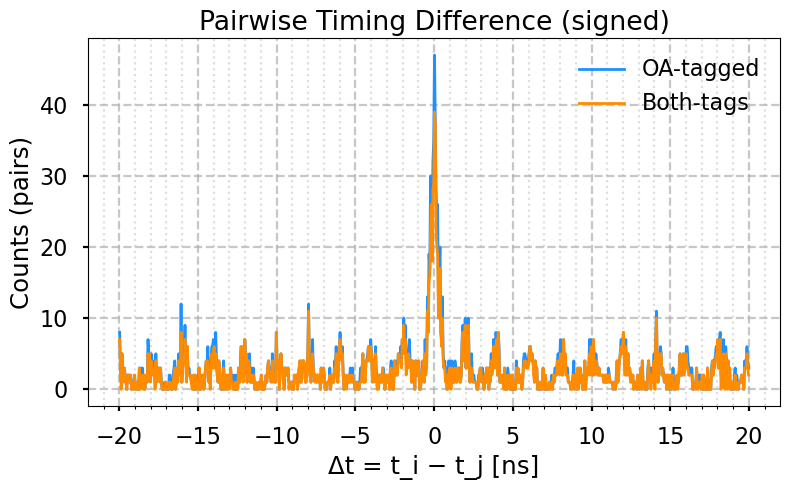


Processing events with 13 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


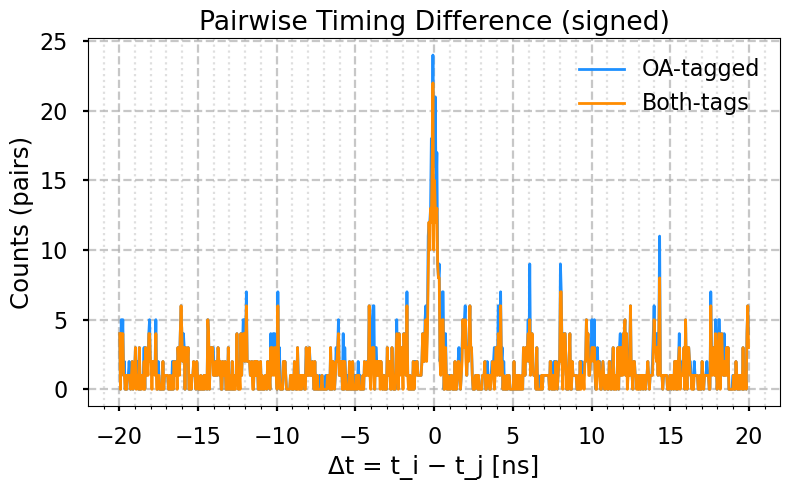


Processing events with 14 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


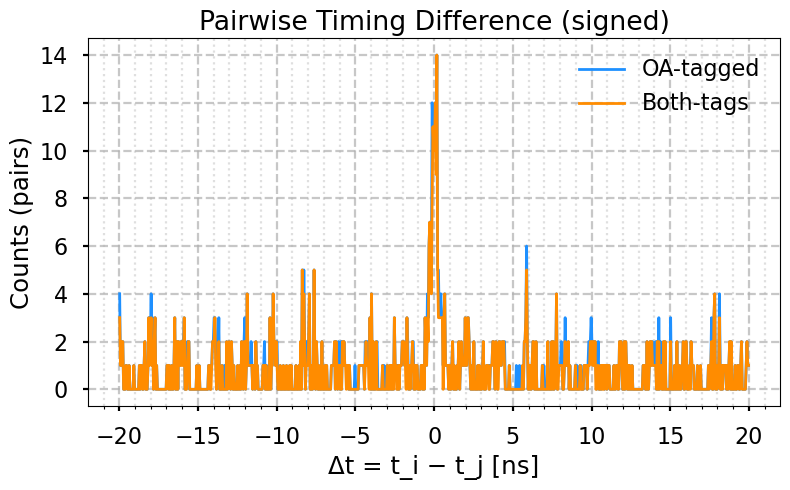


Processing events with 15 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


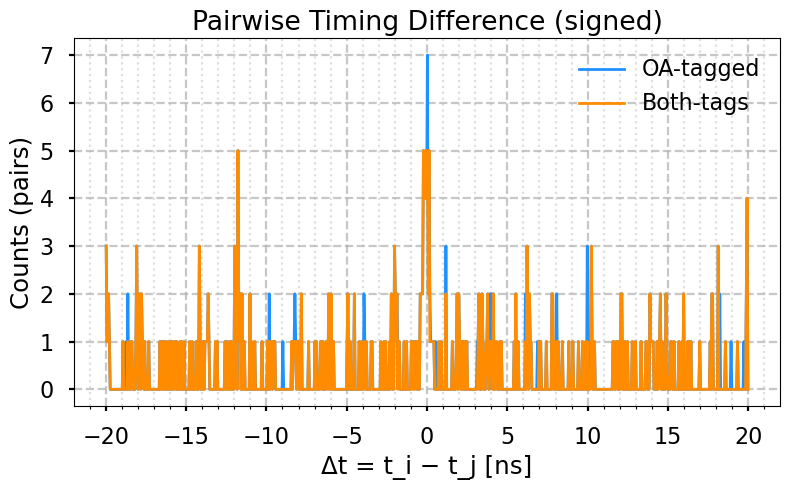


Processing events with 16 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


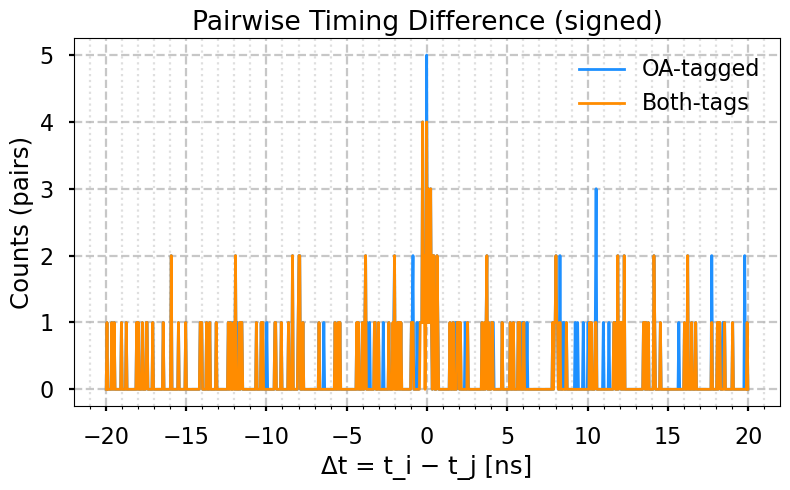


Processing events with 17 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


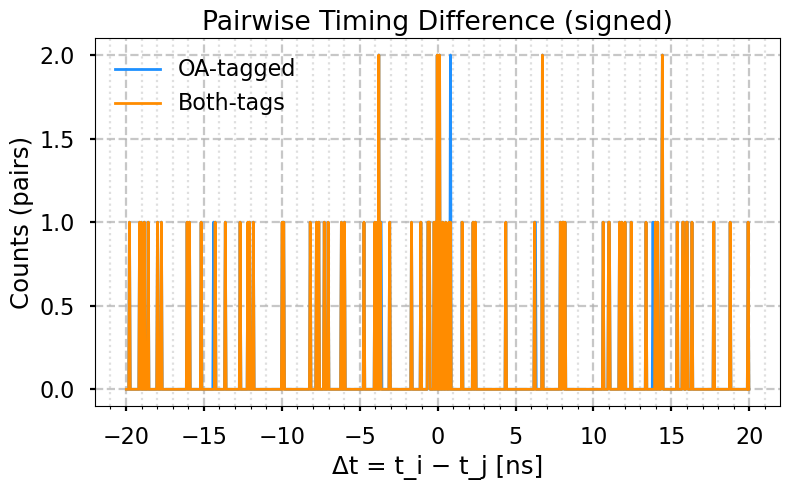


Processing events with 18 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


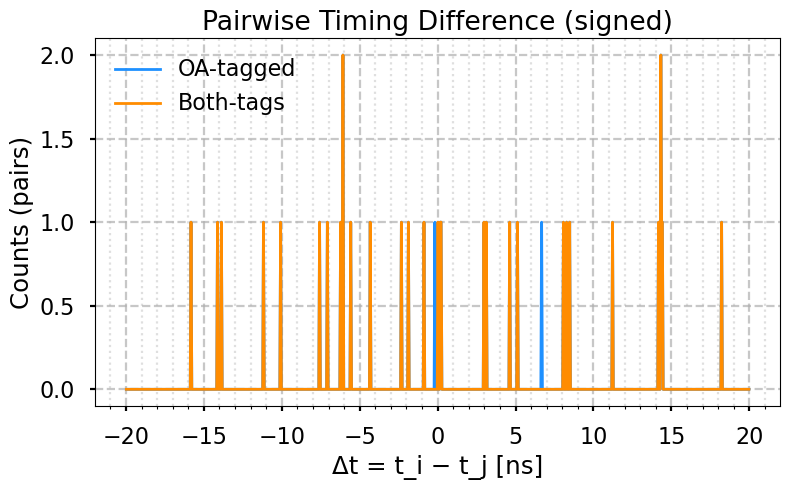


Processing events with 19 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


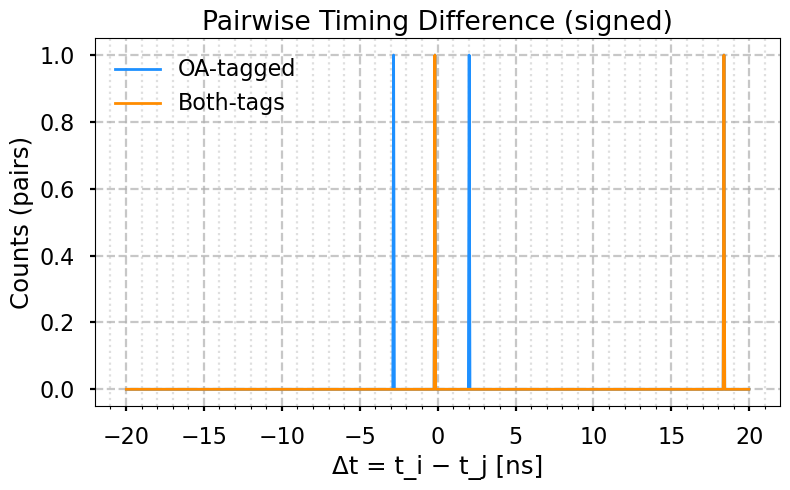


Processing events with 20 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


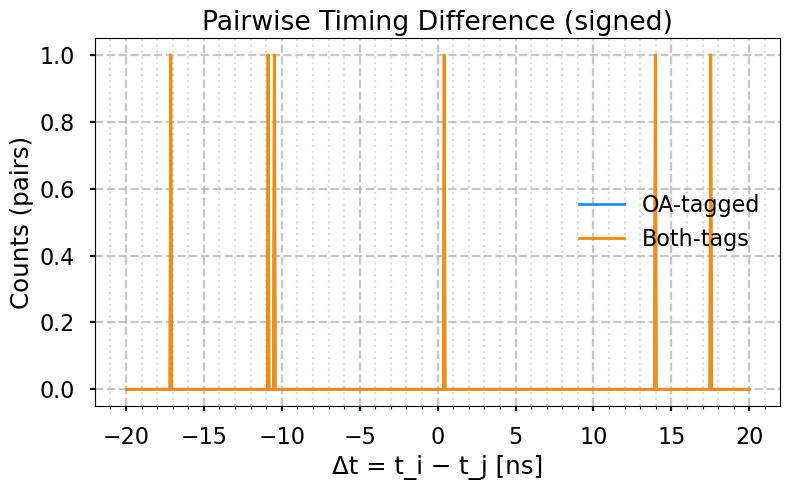


Processing events with 21 clusters...
Saved Δt histograms to cluster_dt_histograms.npz


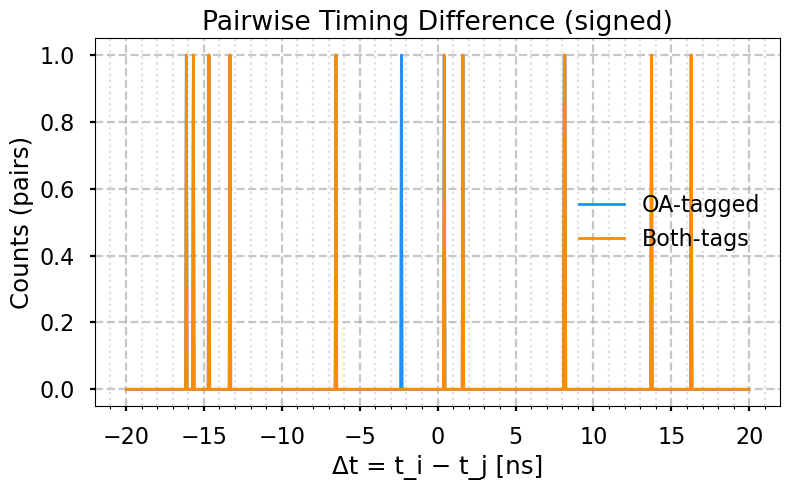

In [7]:
#!/usr/bin/env python3
import numpy as np
import pandas as pd
import awkward as ak
import matplotlib.pyplot as plt
import numba as nb

# ===============================
# Load CSV and ROOT branches
# ===============================
df_csv = pd.read_csv("cluster_tags_fast_temp.csv")

# ROOT branches (assume already loaded)
clusE_all = branches["NPS.cal.clusE"]
clusT_all = branches["NPS.cal.clusT"]

# Number of clusters per event
n_clusters = ak.num(clusE_all)  # Awkward Array

# Only consider events with >= 2 clusters
has_two_clust = n_clusters >= 2

# Filter the cluster arrays with Awkward
clusT_all = clusT_all[has_two_clust]
n_clusters = n_clusters[has_two_clust]

# Create integer event IDs for the filtered events
event_ids_all = np.arange(len(n_clusters))


# ===============================
# Prepare per-event arrays
# ===============================
def prepare_event_arrays(clusT_subset, df_csv, tag_name, event_ids):
    grouped = df_csv.groupby("event")
    timing, tagmask = [], []
    for ev_idx, ev_t in zip(event_ids, clusT_subset):
        tag_ev = grouped.get_group(ev_idx)[tag_name].to_numpy().astype(np.bool_)
        timing.append(np.asarray(ev_t, dtype=np.float64))
        tagmask.append(tag_ev)
    return timing, tagmask

# ===============================
# Numba kernel for Δt histogram
# ===============================
@nb.njit(parallel=True)
def dt_hist_numba(timing_list, mask_list, dt_min, dt_max, n_bins):
    hist = np.zeros(n_bins, dtype=np.int64)
    bin_w = (dt_max - dt_min) / n_bins

    for ev in nb.prange(len(timing_list)):
        t_ev = timing_list[ev]
        m_ev = mask_list[ev]
        n = len(t_ev)
        if n < 2:
            continue
        for i in range(n - 1):
            if not m_ev[i]:
                continue
            ti = t_ev[i]
            for j in range(i + 1, n):
                if not m_ev[j]:
                    continue
                tj = t_ev[j]
                dt = ti - tj
                idx = int((dt - dt_min) / bin_w)
                if 0 <= idx < n_bins:
                    hist[idx] += 1
    return hist

# ===============================
# Compute Δt histogram
# ===============================
def compute_dt_histograms(timing, mask, dt_min, dt_max, n_bins):
    hist = dt_hist_numba(timing, mask, dt_min, dt_max, n_bins)
    edges = np.linspace(dt_min, dt_max, n_bins + 1)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, hist

# ===============================
# Plot Δt histograms
# ===============================
def plot_dt_results(centers_oa, hist_oa, centers_both, hist_both, n_bins):
    # Signed Δt
    plt.figure(figsize=(8,5))
    plt.plot(centers_oa, hist_oa, color="dodgerblue", lw=2, label="OA-tagged")
    plt.plot(centers_both, hist_both, color="darkorange", lw=2, label="Both-tags")
    plt.xlabel("Δt = t_i − t_j [ns]")
    plt.ylabel("Counts (pairs)")
    plt.title("Pairwise Timing Difference (signed)")
    plt.legend(frameon=False)

    # Minor gridlines every 1 ns
    ax = plt.gca()
    ax.xaxis.set_minor_locator(mticker.MultipleLocator(1))
    ax.grid(which='major', linestyle='--', alpha=0.7)
    ax.grid(which='minor', linestyle=':', alpha=0.4)

    # plt.grid(alpha=0.4)
    plt.tight_layout()
    plt.show()

# ===============================
# Parameters
# ===============================
dt_min, dt_max, n_bins = -20.0, 20.0, 800

# ===============================
# Loop over multiplicities
# ===============================
for multiplicity in range(2, np.max(n_clusters)+1):
    print(f"\nProcessing events with {multiplicity} clusters...")

    # Indices of events with this multiplicity
    event_indices = event_ids_all[n_clusters == multiplicity]
    clusT_subset = clusT_all[n_clusters == multiplicity]

    if len(clusT_subset) == 0:
        continue

    # Prepare per-event arrays
    timing_oa, mask_oa = prepare_event_arrays(clusT_subset, df_csv, "opening_angle_tagged", event_indices)
    timing_both, mask_both = prepare_event_arrays(clusT_subset, df_csv, "both_tags", event_indices)

    # Compute Δt histograms
    centers_oa, hist_oa = compute_dt_histograms(timing_oa, mask_oa, dt_min, dt_max, n_bins)
    centers_both, hist_both = compute_dt_histograms(timing_both, mask_both, dt_min, dt_max, n_bins)

    # ==========================================================
    #  Save results
    # ==========================================================
    np.savez_compressed(
        f"cluster_dt_histograms_{multiplicity}_clusters.npz",
        centers_oa=centers_oa, hist_oa=hist_oa,
        centers_both=centers_both, hist_both=hist_both,
        dt_min=dt_min, dt_max=dt_max, n_bins=n_bins
    )

    print("Saved Δt histograms to cluster_dt_histograms.npz")

    # Plot
    plot_dt_results(centers_oa, hist_oa, centers_both, hist_both, n_bins)



<Array [4.54, 4.8, 5.41, 4.55, ..., 4.93, 5.31, 4.91] type='3222394 * float64'>

In [6]:
import pandas as pd

has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
clusT = branches["NPS.cal.clusT"][has_two_clust]

df_csv = pd.read_csv("cluster_tags_fast_temp.csv")

In [7]:
df_csv.head()

,event,cluster_index,energy,x,y,inequality_tagged,opening_angle_tagged,both_tags
0,0,0,0.276418,-21.415045,5.400000,True,False,False
1,0,1,0.620013,-19.578661,-33.480000,True,False,False
2,0,2,0.075619,-24.840000,-27.000000,True,False,False
3,0,3,0.242769,-20.520000,-31.320000,True,False,False
4,1,0,0.489423,9.720000,-19.293213,True,False,False


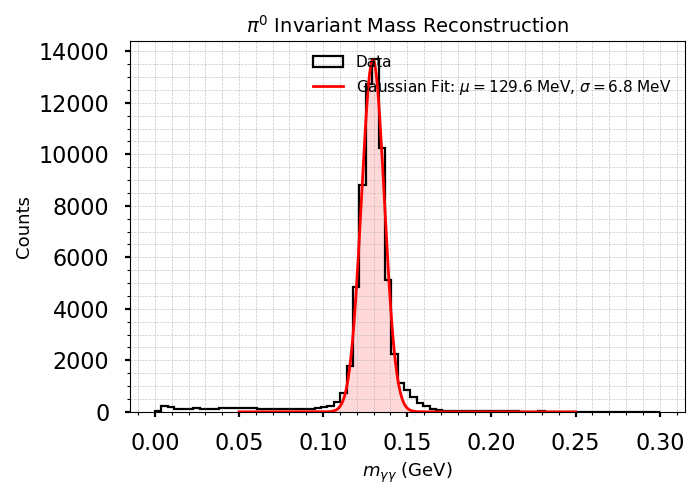

Reconstructed 68152 π⁰ candidates.
Events with more than one valid cluster pair: 2042


In [14]:
import numpy as np
import pandas as pd
import awkward as ak
import numba as nb
import matplotlib.pyplot as plt
from itertools import combinations
from scipy.optimize import curve_fit

# ======================
# Physics helpers
# ======================
@nb.njit
def unit_vec_from_xy(x, y, z_nps):
    r0 = x
    r1 = y
    r2 = z_nps
    norm = (r0*r0 + r1*r1 + r2*r2) ** 0.5
    return r0 / norm, r1 / norm, r2 / norm

@nb.njit
def reconstruct_mass_nb(e1, e2, x1, y1, x2, y2, z_nps):
    u10, u11, u12 = unit_vec_from_xy(x1, y1, z_nps)
    u20, u21, u22 = unit_vec_from_xy(x2, y2, z_nps)
    p10, p11, p12 = e1 * u10, e1 * u11, e1 * u12
    p20, p21, p22 = e2 * u20, e2 * u21, e2 * u22
    total_E = e1 + e2
    tp0, tp1, tp2 = p10 + p20, p11 + p21, p12 + p22
    p2 = tp0*tp0 + tp1*tp1 + tp2*tp2
    m2 = total_E*total_E - p2
    return np.sqrt(m2) if m2 > 0.0 else 0.0

# ======================
# Gaussian fit function
# ======================
def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# ======================
# Load data
# ======================
# npz = np.load("your_file.npz", allow_pickle=True)
# branches = npz["branches"].item()

has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
clusT = branches["NPS.cal.clusT"][has_two_clust]

df_csv = pd.read_csv("cluster_tags_fast_temp.csv")

# ======================
# Select clusters
# ======================
df_open = df_csv[df_csv["opening_angle_tagged"] == True].copy()
if df_open.empty:
    raise ValueError("No clusters found with opening_angle_tagged == True")

# ======================
# Loop over events
# ======================
z_nps = 407.0  # detector distance (cm or mm)
pi0_masses = []
multi_pair_events = 0

for event_id, group in df_open.groupby("event"):
    if event_id >= len(clusT):
        continue

    # times = np.array(clusT[event_id])
    times = np.asarray(ak.to_numpy(clusT[event_id]))

    indices = group["cluster_index"].values

    if len(indices) < 2:
        continue

    valid_pairs = []  # store valid (i1, i2) pairs for this event

    for i1, i2 in combinations(indices, 2):
        if i1 >= len(times) or i2 >= len(times):
            continue

        if abs(times[i1] - times[i2]) <= 1.0:  # within 1 ns
            e1, e2 = group.loc[group["cluster_index"] == i1, "energy"].values[0], \
                     group.loc[group["cluster_index"] == i2, "energy"].values[0]
            x1, y1 = group.loc[group["cluster_index"] == i1, ["x", "y"]].values[0]
            x2, y2 = group.loc[group["cluster_index"] == i2, ["x", "y"]].values[0]
            mass = reconstruct_mass_nb(e1, e2, x1, y1, x2, y2, z_nps)
            if mass > 0:
                pi0_masses.append(mass)
                valid_pairs.append((i1, i2))

    # Count events with >1 valid pair
    if len(valid_pairs) > 1:
        multi_pair_events += 1

pi0_masses = np.array(pi0_masses)

# ======================
# Fit and plot
# ======================
fig, ax = plt.subplots(figsize=(7,5))

# Histogram
bins = np.linspace(0, 0.3, 80)
counts, edges, _ = ax.hist(pi0_masses, bins=bins, histtype='step', linewidth=1.6, color='black', label="Data")

# Prepare x, y for fit
centers = 0.5 * (edges[1:] + edges[:-1])
mask = (centers > 0.05) & (centers < 0.25)
x_fit = centers[mask]
y_fit = counts[mask]

# Initial guess for [A, mu, sigma]
A_guess = np.max(y_fit)
mu_guess = 0.135
sigma_guess = 0.02

try:
    popt, pcov = curve_fit(gaussian, x_fit, y_fit, p0=[A_guess, mu_guess, sigma_guess])
    A_fit, mu_fit, sigma_fit = popt
    x_line = np.linspace(0.05, 0.25, 300)
    y_line = gaussian(x_line, *popt)

    ax.plot(x_line, y_line, 'r-', lw=2, label=fr'Gaussian Fit: $\mu={mu_fit*1000:.1f}$ MeV, $\sigma={sigma_fit*1000:.1f}$ MeV')
    ax.fill_between(x_line, y_line, alpha=0.15, color='red')

except RuntimeError:
    ax.text(0.15, 0.8*np.max(counts), "Fit failed", color='red', fontsize=12)

# Formatting
ax.set_xlabel(r"$m_{\gamma\gamma}$ (GeV)", fontsize=13)
ax.set_ylabel("Counts", fontsize=13)
ax.set_title(r"$\pi^0$ Invariant Mass Reconstruction", fontsize=14)
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
ax.minorticks_on()
ax.legend(fontsize=11, frameon=False, loc='upper right')

plt.tight_layout()
plt.show()

print(f"Reconstructed {len(pi0_masses)} π⁰ candidates.")
print(f"Events with more than one valid cluster pair: {multi_pair_events}")


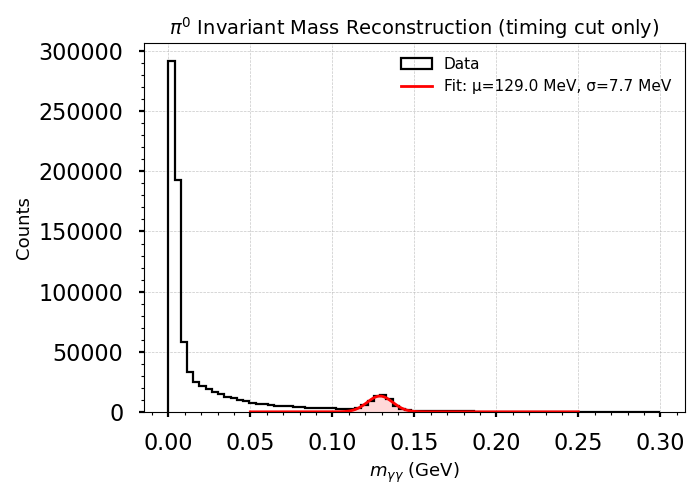

Reconstructed 859354 π⁰ candidates.
Events with more than one valid cluster pair: 146226


In [15]:
import numpy as np
import pandas as pd
import awkward as ak
import numba as nb
import matplotlib.pyplot as plt
from itertools import combinations
from scipy.optimize import curve_fit

# ======================
# Physics helpers
# ======================
@nb.njit
def unit_vec_from_xy(x, y, z_nps):
    norm = (x*x + y*y + z_nps*z_nps) ** 0.5
    return x / norm, y / norm, z_nps / norm

@nb.njit
def reconstruct_mass_nb(e1, e2, x1, y1, x2, y2, z_nps):
    u1 = unit_vec_from_xy(x1, y1, z_nps)
    u2 = unit_vec_from_xy(x2, y2, z_nps)
    p1 = np.array(u1) * e1
    p2 = np.array(u2) * e2
    total_E = e1 + e2
    p_sum = p1 + p2
    m2 = total_E**2 - np.dot(p_sum, p_sum)
    return np.sqrt(m2) if m2 > 0 else 0.0

# ======================
# Gaussian fit
# ======================
def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# ======================
# Load data
# ======================
# npz = np.load("your_file.npz", allow_pickle=True)
# branches = npz["branches"].item()

has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
clusT = branches["NPS.cal.clusT"][has_two_clust]

df_csv = pd.read_csv("cluster_tags_fast_temp.csv")

# --- Use all clusters, no opening angle cut ---
df_all = df_csv.copy()
if df_all.empty:
    raise ValueError("No clusters found in CSV.")

# ======================
# Event loop
# ======================
z_nps = 407.0  # cm or mm, consistent with your setup
pi0_masses = []
multi_pair_events = 0

for event_id, group in df_all.groupby("event"):
    if event_id >= len(clusT):
        continue

    times = np.asarray(ak.to_numpy(clusT[event_id]))
    indices = group["cluster_index"].values

    if len(indices) < 2:
        continue

    valid_pairs = []
    for i1, i2 in combinations(indices, 2):
        if i1 >= len(times) or i2 >= len(times):
            continue
        if abs(times[i1] - times[i2]) <= 1.0:  # ≤ 1 ns timing cut
            e1, e2 = group.loc[group["cluster_index"] == i1, "energy"].values[0], \
                     group.loc[group["cluster_index"] == i2, "energy"].values[0]
            x1, y1 = group.loc[group["cluster_index"] == i1, ["x", "y"]].values[0]
            x2, y2 = group.loc[group["cluster_index"] == i2, ["x", "y"]].values[0]
            m = reconstruct_mass_nb(e1, e2, x1, y1, x2, y2, z_nps)
            if m > 0:
                pi0_masses.append(m)
                valid_pairs.append((i1, i2))

    if len(valid_pairs) > 1:
        multi_pair_events += 1

pi0_masses = np.array(pi0_masses)

# ======================
# Fit and plot
# ======================
fig, ax = plt.subplots(figsize=(7,5))
bins = np.linspace(0, 0.3, 80)
counts, edges, _ = ax.hist(pi0_masses, bins=bins, histtype='step', linewidth=1.6, color='black', label="Data")

centers = 0.5 * (edges[1:] + edges[:-1])
mask = (centers > 0.05) & (centers < 0.25)
x_fit, y_fit = centers[mask], counts[mask]

try:
    popt, _ = curve_fit(gaussian, x_fit, y_fit, p0=[np.max(y_fit), 0.135, 0.02])
    A, mu, sigma = popt
    x_line = np.linspace(0.05, 0.25, 300)
    y_line = gaussian(x_line, *popt)
    ax.plot(x_line, y_line, 'r-', lw=2, label=fr'Fit: μ={mu*1000:.1f} MeV, σ={sigma*1000:.1f} MeV')
    ax.fill_between(x_line, y_line, alpha=0.15, color='red')
except RuntimeError:
    ax.text(0.15, 0.8*np.max(counts), "Fit failed", color='red', fontsize=12)

ax.set_xlabel(r"$m_{\gamma\gamma}$ (GeV)", fontsize=13)
ax.set_ylabel("Counts", fontsize=13)
ax.set_title(r"$\pi^0$ Invariant Mass Reconstruction (timing cut only)", fontsize=14)
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.minorticks_on()
ax.legend(fontsize=11, frameon=False, loc='upper right')

plt.tight_layout()
plt.show()

print(f"Reconstructed {len(pi0_masses)} π⁰ candidates.")
print(f"Events with more than one valid cluster pair: {multi_pair_events}")


Estimated mass peak (from first pass): 131.0 MeV


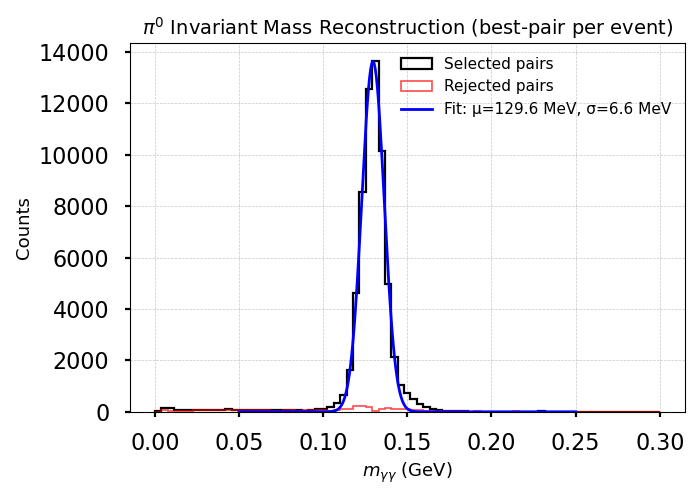

Selected 64647 best π⁰ candidates.
Rejected 3505 secondary pairs.
Events with multiple cluster pairs: 2042


In [17]:
import numpy as np
import pandas as pd
import awkward as ak
import numba as nb
import matplotlib.pyplot as plt
from itertools import combinations
from scipy.optimize import curve_fit

# ======================
# Physics helpers
# ======================
@nb.njit
def unit_vec_from_xy(x, y, z_nps):
    norm = (x*x + y*y + z_nps*z_nps) ** 0.5
    return x / norm, y / norm, z_nps / norm

@nb.njit
def reconstruct_mass_nb(e1, e2, x1, y1, x2, y2, z_nps):
    u1 = unit_vec_from_xy(x1, y1, z_nps)
    u2 = unit_vec_from_xy(x2, y2, z_nps)
    p1 = np.array(u1) * e1
    p2 = np.array(u2) * e2
    total_E = e1 + e2
    p_sum = p1 + p2
    m2 = total_E**2 - np.dot(p_sum, p_sum)
    return np.sqrt(m2) if m2 > 0 else 0.0

# ======================
# Gaussian fit
# ======================
def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# ======================
# Load data
# ======================
# npz = np.load("your_file.npz", allow_pickle=True)
# branches = npz["branches"].item()

has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
clusT = branches["NPS.cal.clusT"][has_two_clust]

df_csv = pd.read_csv("cluster_tags_fast_temp.csv")

# df_all = df_csv.copy()
# if df_all.empty:
#     raise ValueError("No clusters found in CSV.")

# ======================
# Select clusters
# ======================
df_all = df_csv[df_csv["opening_angle_tagged"] == True].copy()
if df_all.empty:
    raise ValueError("No clusters found with opening_angle_tagged == True")

# ======================
# Event loop
# ======================
z_nps = 407.0  # detector distance (cm or mm)
event_masses = []
rejected_masses = []
multi_pair_events = 0

# --- First pass: collect all masses to find peak dynamically ---
all_masses_tmp = []

for event_id, group in df_all.groupby("event"):
    if event_id >= len(clusT):
        continue

    times = np.asarray(ak.to_numpy(clusT[event_id]))
    indices = group["cluster_index"].values
    if len(indices) < 2:
        continue

    for i1, i2 in combinations(indices, 2):
        if i1 >= len(times) or i2 >= len(times):
            continue
        if abs(times[i1] - times[i2]) <= 1.0:
            e1, e2 = group.loc[group["cluster_index"] == i1, "energy"].values[0], \
                     group.loc[group["cluster_index"] == i2, "energy"].values[0]
            x1, y1 = group.loc[group["cluster_index"] == i1, ["x", "y"]].values[0]
            x2, y2 = group.loc[group["cluster_index"] == i2, ["x", "y"]].values[0]
            m = reconstruct_mass_nb(e1, e2, x1, y1, x2, y2, z_nps)
            if m > 0:
                all_masses_tmp.append(m)

# --- Rough estimate of peak location ---
if len(all_masses_tmp) == 0:
    raise ValueError("No valid γγ pairs found in data.")
hist_vals, hist_bins = np.histogram(all_masses_tmp, bins=np.linspace(0, 0.3, 80))
peak_center = 0.5 * (hist_bins[np.argmax(hist_vals)] + hist_bins[np.argmax(hist_vals)+1])
print(f"Estimated mass peak (from first pass): {peak_center*1000:.1f} MeV")

# --- Second pass: select best pairs ---
for event_id, group in df_all.groupby("event"):
    if event_id >= len(clusT):
        continue

    times = np.asarray(ak.to_numpy(clusT[event_id]))
    indices = group["cluster_index"].values
    if len(indices) < 2:
        continue

    masses = []
    for i1, i2 in combinations(indices, 2):
        if i1 >= len(times) or i2 >= len(times):
            continue
        if abs(times[i1] - times[i2]) <= 1.0:
            e1, e2 = group.loc[group["cluster_index"] == i1, "energy"].values[0], \
                     group.loc[group["cluster_index"] == i2, "energy"].values[0]
            x1, y1 = group.loc[group["cluster_index"] == i1, ["x", "y"]].values[0]
            x2, y2 = group.loc[group["cluster_index"] == i2, ["x", "y"]].values[0]
            m = reconstruct_mass_nb(e1, e2, x1, y1, x2, y2, z_nps)
            if m > 0:
                masses.append(m)

    if len(masses) == 0:
        continue
    elif len(masses) == 1:
        event_masses.append(masses[0])
    else:
        multi_pair_events += 1
        masses = np.array(masses)
        best_idx = np.argmin(np.abs(masses - peak_center))
        event_masses.append(masses[best_idx])
        # Save the rejected ones
        rejected = np.delete(masses, best_idx)
        rejected_masses.extend(rejected)

pi0_masses = np.array(event_masses)
rejected_masses = np.array(rejected_masses)

# ======================
# Fit and plot
# ======================
fig, ax = plt.subplots(figsize=(7,5))
bins = np.linspace(0, 0.3, 80)
counts, edges, _ = ax.hist(pi0_masses, bins=bins, histtype='step', linewidth=1.6, color='black', label="Selected pairs")

# --- Rejected pairs ---
ax.hist(rejected_masses, bins=bins, histtype='step', linewidth=1.2, color='red', alpha=0.7, label="Rejected pairs")

# Fit only the selected (main) π0 distribution
centers = 0.5 * (edges[1:] + edges[:-1])
mask = (centers > 0.05) & (centers < 0.25)
x_fit, y_fit = centers[mask], counts[mask]

try:
    popt, _ = curve_fit(gaussian, x_fit, y_fit, p0=[np.max(y_fit), 0.135, 0.02])
    A, mu, sigma = popt
    x_line = np.linspace(0.05, 0.25, 300)
    y_line = gaussian(x_line, *popt)
    ax.plot(x_line, y_line, 'b-', lw=2, label=fr'Fit: μ={mu*1000:.1f} MeV, σ={sigma*1000:.1f} MeV')
except RuntimeError:
    ax.text(0.15, 0.8*np.max(counts), "Fit failed", color='red', fontsize=12)

# Plot formatting
ax.set_xlabel(r"$m_{\gamma\gamma}$ (GeV)", fontsize=13)
ax.set_ylabel("Counts", fontsize=13)
ax.set_title(r"$\pi^0$ Invariant Mass Reconstruction (best-pair per event)", fontsize=14)
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.legend(fontsize=11, frameon=False, loc='upper right')

plt.tight_layout()
plt.show()

print(f"Selected {len(pi0_masses)} best π⁰ candidates.")
print(f"Rejected {len(rejected_masses)} secondary pairs.")
print(f"Events with multiple cluster pairs: {multi_pair_events}")


[INFO] Selected 230468 clusT entries corresponding to 230468 tagged events.
Estimated π⁰ peak center: 131.0 MeV
[No pair] Event 31: Δt = 20.44 ns
[No pair] Event 58: Δt = 20.43 ns
[No pair] Event 78: Δt = 17.98 ns
[No pair] Event 81: Δt = 32.44 ns
[No pair] Event 102: Δt = 22.83 ns
[No pair] Event 103: Δt = 20.94 ns
[No pair] Event 113: Δt = 26.33 ns
[No pair] Event 154: Δt = 12.03 ns
[No pair] Event 208: Δt = 22.58 ns
[No pair] Event 210: Δt = 37.59 ns
[No pair] Event 218: Δt = 36.04 ns
[No pair] Event 219: Δt = 42.40 ns
[No pair] Event 223: Δt = 36.70 ns
[No pair] Event 226: Δt = 23.35 ns
[No pair] Event 260: Δt = 73.95 ns
[No pair] Event 295: Δt = 20.07 ns
[No pair] Event 303: Δt = 17.87 ns
[No pair] Event 343: Δt = 66.10 ns
[No pair] Event 353: Δt = 13.63 ns
[No pair] Event 379: Δt = 22.22 ns
[No pair] Event 434: Δt = 36.62 ns
[No pair] Event 441: Δt = 32.59 ns
[No pair] Event 451: Δt = 27.77 ns
[No pair] Event 472: Δt = 58.10 ns
[No pair] Event 505: Δt = 67.75 ns
[No pair] Event 5

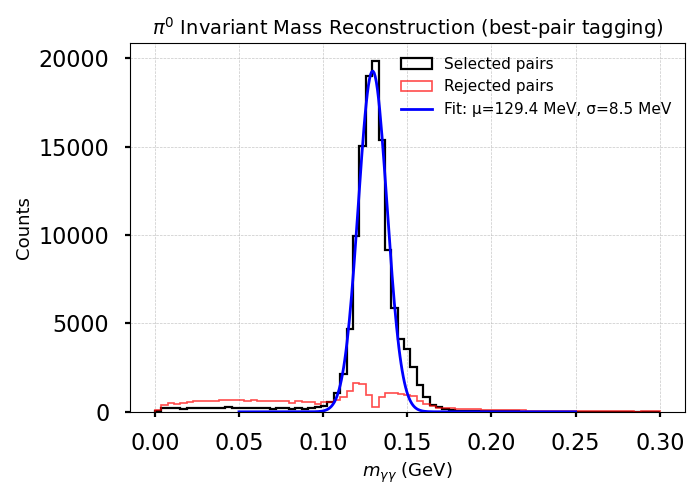

In [66]:
import numpy as np
import pandas as pd
import awkward as ak
import numba as nb
from itertools import combinations
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# ======================
# Physics helpers
# ======================
@nb.njit
def unit_vec_from_xy(x, y, z_nps):
    norm = (x * x + y * y + z_nps * z_nps) ** 0.5
    return x / norm, y / norm, z_nps / norm

@nb.njit
def reconstruct_mass_nb(e1, e2, x1, y1, x2, y2, z_nps):
    u1 = unit_vec_from_xy(x1, y1, z_nps)
    u2 = unit_vec_from_xy(x2, y2, z_nps)
    p1 = np.array(u1) * e1
    p2 = np.array(u2) * e2
    total_E = e1 + e2
    p_sum = p1 + p2
    m2 = total_E**2 - np.dot(p_sum, p_sum)
    return np.sqrt(m2) if m2 > 0 else 0.0

def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# ======================
# Load data
# ======================
df_csv = pd.read_csv("cluster_tags_fast_temp.csv")

# Filter only clusters passing the opening angle tag
df_all = df_csv[df_csv["opening_angle_tagged"] == True].copy()
if df_all.empty:
    raise ValueError("No clusters found with opening_angle_tagged == True")

df_all["best_candidate"] = False  # Initialize column

# ======================
# Load NPZ and setup timing arrays
# ======================
# Example: branches = np.load("nps_clusters.npz", allow_pickle=True)
# Must contain NPS.cal.clusE and NPS.cal.clusT arrays
has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
clusT = branches["NPS.cal.clusT"][has_two_clust]

# ======================
# Match event IDs between df_all and clusT
# ======================
tagged_event_ids = df_all["event"].unique()

# Map from event → index (assumes clusT index corresponds to event number)
event_to_index = {evt: idx for idx, evt in enumerate(np.arange(len(clusT)))}

# Select only events that exist in both
valid_events = [evt for evt in tagged_event_ids if evt in event_to_index]
clusT_indices = [event_to_index[e] for e in valid_events]
clusT_tagged = clusT[clusT_indices]

print(f"[INFO] Selected {len(clusT_tagged)} clusT entries corresponding to {len(valid_events)} tagged events.")
if len(valid_events) != len(clusT_tagged):
    print(f"⚠️ Event count mismatch: CSV={len(valid_events)}, NPZ={len(clusT_tagged)}")

# ======================
# Step 1: Estimate π⁰ peak center
# ======================
z_nps = 407.0  # cm or mm depending on your convention
all_masses_tmp = []

for event_id, group in df_all.groupby("event"):
    if event_id not in event_to_index:
        continue
    idx = event_to_index[event_id]
    times = np.asarray(ak.to_numpy(clusT[idx]))
    indices = group["cluster_index"].values

    if len(indices) < 2:
        continue

    for i1, i2 in combinations(indices, 2):
        if i1 >= len(times) or i2 >= len(times):
            continue
        if abs(times[i1] - times[i2]) <= 12.0:  # 1 ns window
            e1, e2 = (
                group.loc[group["cluster_index"] == i1, "energy"].values[0],
                group.loc[group["cluster_index"] == i2, "energy"].values[0],
            )
            x1, y1 = group.loc[group["cluster_index"] == i1, ["x", "y"]].values[0]
            x2, y2 = group.loc[group["cluster_index"] == i2, ["x", "y"]].values[0]
            m = reconstruct_mass_nb(e1, e2, x1, y1, x2, y2, z_nps)
            if m > 0:
                all_masses_tmp.append(m)

if len(all_masses_tmp) == 0:
    raise ValueError("No valid γγ pairs found in data.")

hist_vals, hist_bins = np.histogram(all_masses_tmp, bins=np.linspace(0, 0.3, 80))
peak_center = 0.5 * (hist_bins[np.argmax(hist_vals)] + hist_bins[np.argmax(hist_vals) + 1])
print(f"Estimated π⁰ peak center: {peak_center*1000:.1f} MeV")

# ======================
# Step 2: Select best candidate pairs
# ======================
event_masses = []
rejected_masses = []
multi_pair_events = 0

for event_id, group in df_all.groupby("event"):
    if event_id not in event_to_index:
        continue
    idx = event_to_index[event_id]
    times = np.asarray(ak.to_numpy(clusT[idx]))
    indices = group["cluster_index"].values

    if len(indices) < 2:
        continue

    pair_data = []
    for i1, i2 in combinations(indices, 2):
        if i1 >= len(times) or i2 >= len(times):
            continue
        dt = abs(times[i1] - times[i2])
        if dt <= 12.0:
            e1, e2 = (
                group.loc[group["cluster_index"] == i1, "energy"].values[0],
                group.loc[group["cluster_index"] == i2, "energy"].values[0],
            )
            x1, y1 = group.loc[group["cluster_index"] == i1, ["x", "y"]].values[0]
            x2, y2 = group.loc[group["cluster_index"] == i2, ["x", "y"]].values[0]
            m = reconstruct_mass_nb(e1, e2, x1, y1, x2, y2, z_nps)
            if m > 0:
                pair_data.append((m, (i1, i2)))

    if len(pair_data) == 0:
        # Debug for 2-cluster events that fail timing cut
        if len(indices) == 2:
            i1, i2 = indices
            print(f"[No pair] Event {event_id}: Δt = {abs(times[i1]-times[i2]):.2f} ns")
        continue

    elif len(pair_data) == 1:
        best_mass, (i1, i2) = pair_data[0]
        event_masses.append(best_mass)
        df_all.loc[
            (df_all["event"] == event_id) & (df_all["cluster_index"].isin([i1, i2])),
            "best_candidate",
        ] = True

    else:
        multi_pair_events += 1
        masses = np.array([m for m, _ in pair_data])
        pairs = [p for _, p in pair_data]
        best_idx = np.argmin(np.abs(masses - peak_center))
        best_mass = masses[best_idx]
        best_pair = pairs[best_idx]
        event_masses.append(best_mass)
        df_all.loc[
            (df_all["event"] == event_id) & (df_all["cluster_index"].isin(best_pair)),
            "best_candidate",
        ] = True
        rejected_masses.extend(np.delete(masses, best_idx))

pi0_masses = np.array(event_masses)
rejected_masses = np.array(rejected_masses)

# ======================
# Save updated CSV
# ======================
df_all.to_csv("cluster_tags_with_best_candidate.csv", index=False)
print(f"✅ Saved 'cluster_tags_with_best_candidate.csv'")
print(
    f"Selected {len(pi0_masses)} π⁰ candidates, rejected {len(rejected_masses)} pairs, "
    f"multi-pair events: {multi_pair_events}"
)

# ======================
# Step 3: Fit and plot
# ======================
fig, ax = plt.subplots(figsize=(7, 5))
bins = np.linspace(0, 0.3, 80)
counts, edges, _ = ax.hist(
    pi0_masses, bins=bins, histtype="step", linewidth=1.6, color="black", label="Selected pairs"
)
ax.hist(
    rejected_masses,
    bins=bins,
    histtype="step",
    linewidth=1.2,
    color="red",
    alpha=0.7,
    label="Rejected pairs",
)

centers = 0.5 * (edges[1:] + edges[:-1])
mask = (centers > 0.05) & (centers < 0.25)
x_fit, y_fit = centers[mask], counts[mask]

try:
    popt, _ = curve_fit(gaussian, x_fit, y_fit, p0=[np.max(y_fit), 0.135, 0.02])
    A, mu, sigma = popt
    x_line = np.linspace(0.05, 0.25, 300)
    y_line = gaussian(x_line, *popt)
    ax.plot(
        x_line,
        y_line,
        "b-",
        lw=2,
        label=fr"Fit: μ={mu*1000:.1f} MeV, σ={sigma*1000:.1f} MeV",
    )
except RuntimeError:
    ax.text(0.15, 0.8 * np.max(counts), "Fit failed", color="red", fontsize=12)

ax.set_xlabel(r"$m_{\gamma\gamma}$ (GeV)", fontsize=13)
ax.set_ylabel("Counts", fontsize=13)
ax.set_title(r"$\pi^0$ Invariant Mass Reconstruction (best-pair tagging)", fontsize=14)
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.7)
ax.legend(fontsize=11, frameon=False, loc="upper right")

plt.tight_layout()
plt.show()


Prepared timing arrays for 230468 events.


/tmp/ipykernel_1226/4186891926.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


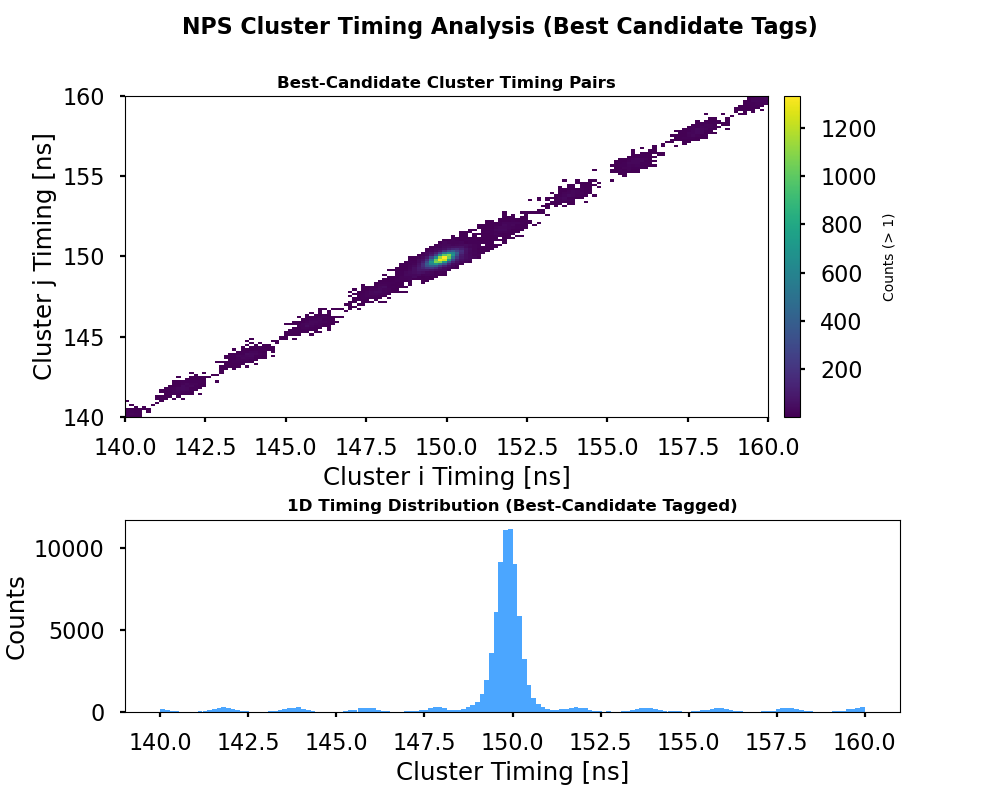

In [39]:
import numpy as np
import awkward as ak
import pandas as pd
import numba as nb
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# ======================
# Load CSV and ROOT-like data
# ======================
df_csv = pd.read_csv("cluster_tags_with_best_candidate.csv")

# Filter CSV if needed (optional)
# df_csv = df_csv[df_csv["opening_angle_tagged"] == True].copy()

# Load ROOT clusters (example: branches["NPS.cal.clusT"] / "clusE")
has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
clusT = branches["NPS.cal.clusT"][has_two_clust]

# ======================
# Match events between CSV and ROOT
# ======================
tagged_event_ids = df_csv["event"].unique()

# Map event → ROOT index (assumes ROOT events are in order)
event_to_index = {evt: idx for idx, evt in enumerate(np.arange(len(clusT)))}

# Keep only events that exist in both
valid_events = [evt for evt in tagged_event_ids if evt in event_to_index]
clusT_indices = [event_to_index[e] for e in valid_events]
clusT_tagged = clusT[clusT_indices]

# ======================
# Build per-event timing arrays and best_candidate masks
# ======================
timing_bc = []
mask_bc = []

grouped_csv = df_csv.groupby("event")

for evt_id in valid_events:
    df_ev = grouped_csv.get_group(evt_id)
    root_idx = event_to_index[evt_id]
    clus_ev = clusT[root_idx]
    mask_ev = np.zeros(len(clus_ev), dtype=bool)

    # Set mask for best_candidate clusters
    for _, row in df_ev.iterrows():
        cl_idx = int(row["cluster_index"])
        if cl_idx < len(mask_ev):
            mask_ev[cl_idx] = bool(row["best_candidate"])

    timing_bc.append(np.asarray(clus_ev, dtype=np.float64))
    mask_bc.append(mask_ev)

print(f"Prepared timing arrays for {len(timing_bc)} events.")

# ======================
# Numba-accelerated 2D histogram builder
# ======================
@nb.njit(parallel=True)
def fill_hist_numba(timing_list, mask_list, n_bins, hist_min, hist_max, threshold):
    bin_w = (hist_max - hist_min) / n_bins
    hist = np.zeros((n_bins, n_bins), dtype=np.int32)

    for ev in nb.prange(len(timing_list)):
        t_ev = timing_list[ev]
        m_ev = mask_list[ev]
        n = len(t_ev)
        for i in range(n - 1):
            if not m_ev[i]:
                continue
            ti = t_ev[i]
            if ti < hist_min or ti >= hist_max:
                continue
            for j in range(i + 1, n):
                if not m_ev[j]:
                    continue
                tj = t_ev[j]
                if tj < hist_min or tj >= hist_max:
                    continue
                xi = int((ti - hist_min) / bin_w)
                yj = int((tj - hist_min) / bin_w)
                hist[xi, yj] += 1

    for i in nb.prange(n_bins):
        for j in nb.prange(n_bins):
            if hist[i, j] <= threshold:
                hist[i, j] = -1
    return hist

# ======================
# 1D histogram builder
# ======================
def build_1d_hist(timing_list, mask_list, n_bins, hist_min, hist_max):
    all_vals = []
    for t_ev, m_ev in zip(timing_list, mask_list):
        all_vals.extend(t_ev[m_ev])
    counts, edges = np.histogram(all_vals, bins=n_bins, range=(hist_min, hist_max))
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, counts

# ======================
# Plotting helper
# ======================
def plot_results(hist_bc, centers_bc, counts_bc, hist_min, hist_max, threshold):
    fig = plt.figure(figsize=(10, 8))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.6], hspace=0.4)

    # 2D histogram
    ax1 = fig.add_subplot(gs[0])
    counts_plot_bc = np.where(hist_bc == -1, np.nan, hist_bc)
    n_bins = hist_bc.shape[0]
    X, Y = np.meshgrid(
        np.linspace(hist_min, hist_max, n_bins + 1),
        np.linspace(hist_min, hist_max, n_bins + 1)
    )
    pcm = ax1.pcolormesh(X, Y, counts_plot_bc.T, cmap='viridis')
    cbar = fig.colorbar(pcm, ax=ax1, pad=0.02)
    cbar.set_label(f'Counts (> {threshold})', fontsize=10)
    ax1.set_title("Best-Candidate Cluster Timing Pairs", fontsize=12, fontweight="bold")
    ax1.set_xlabel("Cluster i Timing [ns]")
    ax1.set_ylabel("Cluster j Timing [ns]")

    # 1D histogram
    ax2 = fig.add_subplot(gs[1])
    ax2.bar(centers_bc, counts_bc, width=(centers_bc[1] - centers_bc[0]),
            color='dodgerblue', alpha=0.8)
    ax2.set_title("1D Timing Distribution (Best-Candidate Tagged)", fontsize=12, fontweight="bold")
    ax2.set_xlabel("Cluster Timing [ns]")
    ax2.set_ylabel("Counts")

    fig.suptitle("NPS Cluster Timing Analysis (Best Candidate Tags)", fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# ======================
# Run analysis
# ======================
n_bins = 150
hist_min, hist_max = 140.0, 160.0
threshold = 1

hist_bc = fill_hist_numba(timing_bc, mask_bc, n_bins, hist_min, hist_max, threshold)
centers_bc, counts_bc = build_1d_hist(timing_bc, mask_bc, n_bins, hist_min, hist_max)

# Store results
np.savez(
    "cluster_timing_histograms_best_candidate.npz",
    hist_bc=hist_bc,
    centers_bc=centers_bc,
    counts_bc=counts_bc,
    hist_min=hist_min,
    hist_max=hist_max,
    n_bins=n_bins,
    threshold=threshold
)

# Plot
plot_results(hist_bc, centers_bc, counts_bc, hist_min, hist_max, threshold)


In [57]:
import numpy as np
import pandas as pd
import awkward as ak
import numba as nb
from itertools import combinations
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# ======================
# Physics helpers
# ======================
@nb.njit
def unit_vec_from_xy(x, y, z_nps):
    norm = (x*x + y*y + z_nps*z_nps) ** 0.5
    return x/norm, y/norm, z_nps/norm

@nb.njit
def reconstruct_mass_nb(e1, e2, x1, y1, x2, y2, z_nps):
    u1 = unit_vec_from_xy(x1, y1, z_nps)
    u2 = unit_vec_from_xy(x2, y2, z_nps)
    p1 = np.array(u1) * e1
    p2 = np.array(u2) * e2
    total_E = e1 + e2
    p_sum = p1 + p2
    m2 = total_E**2 - np.dot(p_sum, p_sum)
    return np.sqrt(m2) if m2>0 else 0.0

def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5*((x-mu)/sigma)**2)

# ======================
# Load data
# ======================
df_csv = pd.read_csv("cluster_tags_with_best_candidate.csv")

# Filter clusters passing opening-angle tag
df_all = df_csv[df_csv["opening_angle_tagged"] == True].copy()
df_all["best_candidate"] = False

# Load NPZ/ROOT clusters
has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
clusT = branches["NPS.cal.clusT"][has_two_clust]

# ======================
# Match CSV and ROOT events
# ======================
tagged_event_ids = df_all["event"].unique()
event_to_index = {evt: idx for idx, evt in enumerate(np.arange(len(clusT)))}
valid_events = [evt for evt in tagged_event_ids if evt in event_to_index]
clusT_indices = [event_to_index[e] for e in valid_events]
clusT_tagged = clusT[clusT_indices]
print(f"[INFO] {len(clusT_tagged)} clusT entries for {len(valid_events)} events.")

# ======================
# Step 1: Estimate π0 peak center using Gaussian fit
# ======================
z_nps = 407.0
all_masses_tmp = []

for event_id, group in df_all.groupby("event"):
    if event_id not in event_to_index: continue
    idx = event_to_index[event_id]
    times = np.asarray(ak.to_numpy(clusT[idx]))
    indices = group["cluster_index"].values
    if len(indices)<2: continue

    for i1, i2 in combinations(indices,2):
        if i1>=len(times) or i2>=len(times): continue
        if abs(times[i1]-times[i2]) <= 20.0: # three times NPS timing resolution
            e1,e2 = group.loc[group["cluster_index"]==i1,"energy"].values[0], group.loc[group["cluster_index"]==i2,"energy"].values[0]
            x1,y1 = group.loc[group["cluster_index"]==i1,["x","y"]].values[0]
            x2,y2 = group.loc[group["cluster_index"]==i2,["x","y"]].values[0]
            m = reconstruct_mass_nb(e1,e2,x1,y1,x2,y2,z_nps)
            if m>0: all_masses_tmp.append(m)

if len(all_masses_tmp)==0: raise ValueError("No valid gamma-gamma pairs found")

# Histogram for fitting
bins_fit = np.linspace(0.12, 0.14, 50)
hist_vals, hist_edges = np.histogram(all_masses_tmp, bins=bins_fit)
centers = 0.5*(hist_edges[1:] + hist_edges[:-1])

# Gaussian fit
try:
    popt, _ = curve_fit(gaussian, centers, hist_vals, p0=[np.max(hist_vals), 0.135, 0.005])
    A, peak_center, sigma = popt
    print(f"Gaussian fit: peak_center = {peak_center*1000:.1f} MeV, sigma = {sigma*1000:.1f} MeV")
except RuntimeError:
    # Fallback if fit fails
    peak_center = 0.5*(hist_edges[np.argmax(hist_vals)] + hist_edges[np.argmax(hist_vals)+1])
    print(f"Fit failed, fallback peak: {peak_center*1000:.1f} MeV")


# ======================
# Step 2: Select best candidate pairs & build timing arrays
# ======================
timing_bc, mask_bc = [], []
event_masses = []
rejected_masses = []

for event_id, group in df_all.groupby("event"):
    if event_id not in event_to_index: continue
    idx = event_to_index[event_id]
    times = np.asarray(ak.to_numpy(clusT[idx]))
    indices = group["cluster_index"].values
    if len(indices)<2: continue

    pair_data = []
    for i1,i2 in combinations(indices,2):
        if i1>=len(times) or i2>=len(times): continue
        dt = abs(times[i1]-times[i2])
        if dt>20.0: continue # three times NPS timing resolution
        e1,e2 = group.loc[group["cluster_index"]==i1,"energy"].values[0], group.loc[group["cluster_index"]==i2,"energy"].values[0]
        x1,y1 = group.loc[group["cluster_index"]==i1,["x","y"]].values[0]
        x2,y2 = group.loc[group["cluster_index"]==i2,["x","y"]].values[0]
        m = reconstruct_mass_nb(e1,e2,x1,y1,x2,y2,z_nps)
        if m>0: pair_data.append((m,(i1,i2)))

    if len(pair_data)==0: continue
    elif len(pair_data)==1:
        best_mass,(i1,i2)=pair_data[0]
    else:
        masses = np.array([m for m,_ in pair_data])
        pairs = [p for _,p in pair_data]
        best_idx = np.argmin(np.abs(masses-peak_center))
        best_mass = masses[best_idx]
        i1,i2 = pairs[best_idx]
        rejected_masses.extend(np.delete(masses,best_idx))

    event_masses.append(best_mass)
    df_all.loc[(df_all["event"]==event_id)&(df_all["cluster_index"].isin([i1,i2])),"best_candidate"]=True

    # Build timing arrays
    mask_ev = np.zeros(len(times),dtype=bool)
    mask_ev[[i1,i2]]=True
    timing_bc.append(times)
    mask_bc.append(mask_ev)

pi0_masses = np.array(event_masses)
rejected_masses = np.array(rejected_masses)
df_all.to_csv("cluster_tags_with_best_candidate.csv",index=False)
print(f"✅ Saved updated CSV. Selected {len(pi0_masses)} π0 candidates, rejected {len(rejected_masses)} pairs.")

# ======================
# Step 3: Numba 2D histogram
# ======================
@nb.njit(parallel=True)
def fill_hist_numba(timing_list, mask_list, n_bins, hist_min, hist_max, threshold):
    bin_w = (hist_max-hist_min)/n_bins
    hist = np.zeros((n_bins,n_bins),dtype=np.int32)
    for ev in nb.prange(len(timing_list)):
        t_ev = timing_list[ev]
        m_ev = mask_list[ev]
        n = len(t_ev)
        for i in range(n-1):
            if not m_ev[i]: continue
            ti = t_ev[i]
            if ti<hist_min or ti>=hist_max: continue
            for j in range(i+1,n):
                if not m_ev[j]: continue
                tj = t_ev[j]
                if tj<hist_min or tj>=hist_max: continue
                xi = int((ti-hist_min)/bin_w)
                yj = int((tj-hist_min)/bin_w)
                hist[xi,yj]+=1
    for i in nb.prange(n_bins):
        for j in nb.prange(n_bins):
            if hist[i,j]<=threshold: hist[i,j]=-1
    return hist

# ======================
# Step 4: 1D histogram
# ======================
def build_1d_hist(timing_list, mask_list, n_bins, hist_min, hist_max):
    all_vals = []
    for t_ev,m_ev in zip(timing_list,mask_list):
        all_vals.extend(t_ev[m_ev])
    counts,edges=np.histogram(all_vals,bins=n_bins,range=(hist_min,hist_max))
    centers=0.5*(edges[1:]+edges[:-1])
    return centers,counts

# ======================
# Step 5: Run histogram analysis
# ======================
n_bins = 150
hist_min,hist_max = 140.0,160.0
threshold=1

hist_bc = fill_hist_numba(timing_bc,mask_bc,n_bins,hist_min,hist_max,threshold)
centers_bc, counts_bc = build_1d_hist(timing_bc,mask_bc,n_bins,hist_min,hist_max)

np.savez("cluster_timing_histograms_best_candidate.npz",
         hist_bc=hist_bc,
         centers_bc=centers_bc,
         counts_bc=counts_bc,
         hist_min=hist_min,
         hist_max=hist_max,
         n_bins=n_bins,
         threshold=threshold)

# # ======================
# # Step 6: Plot 1D + 2D timing histograms
# # ======================
# fig = plt.figure(figsize=(10,8))
# gs = gridspec.GridSpec(2,1,height_ratios=[1,0.5],hspace=0.35)

# # 2D
# ax1 = fig.add_subplot(gs[0])
# counts_plot = np.where(hist_bc==-1,np.nan,hist_bc)
# X,Y = np.meshgrid(np.linspace(hist_min,hist_max,n_bins+1),
#                   np.linspace(hist_min,hist_max,n_bins+1))
# pcm=ax1.pcolormesh(X,Y,counts_plot.T,cmap='viridis')
# cbar=fig.colorbar(pcm,ax=ax1,pad=0.02)
# cbar.set_label(f'Counts (> {threshold})')
# ax1.set_xlabel("Cluster i Timing [ns]")
# ax1.set_ylabel("Cluster j Timing [ns]")
# ax1.set_title("Best-Candidate Cluster Timing Pairs")

# # 1D
# ax2 = fig.add_subplot(gs[1])
# ax2.bar(centers_bc,counts_bc,width=(centers_bc[1]-centers_bc[0]),
#         color='dodgerblue',alpha=0.8)
# ax2.set_xlabel("Cluster Timing [ns]")
# ax2.set_ylabel("Counts")
# ax2.set_title("1D Timing Distribution (Best-Candidate Tagged)")

# plt.tight_layout()
# plt.show()


[INFO] 230468 clusT entries for 230468 events.
Gaussian fit: peak_center = 128.4 MeV, sigma = 9.3 MeV
✅ Saved updated CSV. Selected 152313 π0 candidates, rejected 59448 pairs.


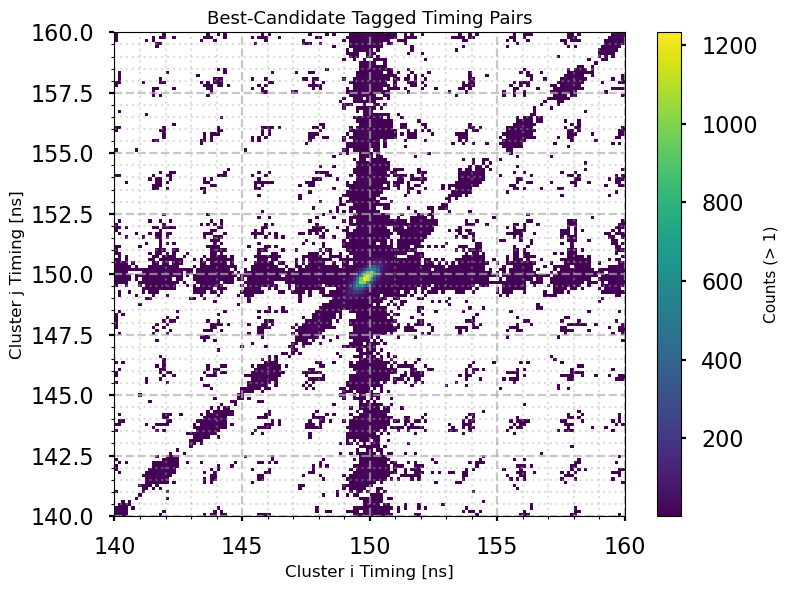

[INFO] Gaussian Fit: Amplitude=15992.6, Mean=149.88 ns, Sigma=0.32 ns


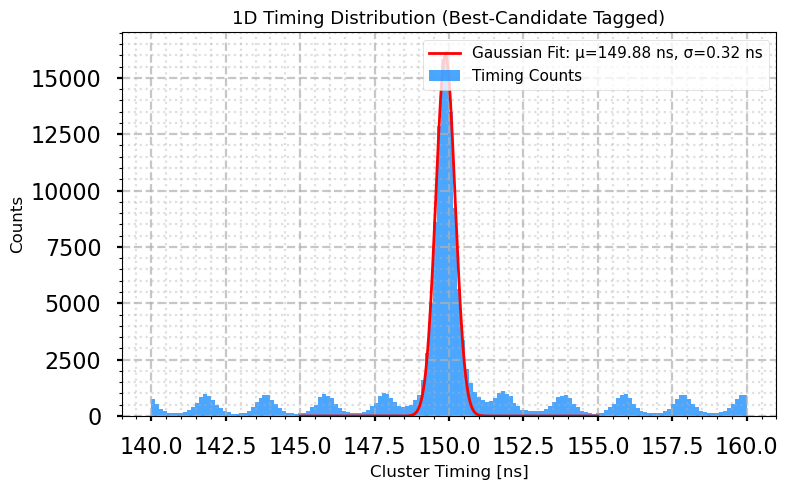

KeyboardInterrupt: 

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from itertools import combinations

plt.ioff()  # Turn off interactive mode

# ================================
# Gaussian function for fitting
# ================================
def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu)/sigma)**2)

# ================================
# Reconstruct invariant mass
# ================================
def reconstruct_mass(e1, e2, x1, y1, x2, y2, z_nps=407.0):
    """Reconstruct gamma-gamma invariant mass (GeV)"""
    def unit_vec(x, y, z):
        norm = np.sqrt(x*x + y*y + z*z)
        return np.array([x/norm, y/norm, z/norm])
    u1 = unit_vec(x1, y1, z_nps)
    u2 = unit_vec(x2, y2, z_nps)
    p1 = u1 * e1
    p2 = u2 * e2
    total_E = e1 + e2
    p_sum = p1 + p2
    m2 = total_E**2 - np.dot(p_sum, p_sum)
    return np.sqrt(m2) if m2 > 0 else 0.0

# ================================
# 2D Timing Histogram
# ================================
def plot_2d_timing(hist_bc, hist_min, hist_max, threshold, save_path=None):
    counts_plot = np.where(hist_bc == -1, np.nan, hist_bc)
    n_bins = hist_bc.shape[0]
    X, Y = np.meshgrid(
        np.linspace(hist_min, hist_max, n_bins+1),
        np.linspace(hist_min, hist_max, n_bins+1)
    )
    plt.figure(figsize=(8,6))
    pcm = plt.pcolormesh(X, Y, counts_plot.T, cmap='viridis')
    cbar = plt.colorbar(pcm)
    cbar.set_label(f'Counts (> {threshold})', fontsize=11)
    plt.title("Best-Candidate Tagged Timing Pairs", fontsize=13)
    plt.xlabel("Cluster i Timing [ns]", fontsize=12)
    plt.ylabel("Cluster j Timing [ns]", fontsize=12)

    ax = plt.gca()
    ax.minorticks_on()
    ax.grid(which='major', linestyle='--', alpha=0.7)
    ax.grid(which='minor', linestyle=':', alpha=0.4)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    plt.show()
    # plt.close()

# ================================
# 1D Timing Histogram + Gaussian Fit
# ================================
def plot_1d_timing_with_fit(centers_bc, counts_bc, peak_range=(145,155), save_path=None):
    plt.figure(figsize=(8,5))
    plt.bar(centers_bc, counts_bc, width=(centers_bc[1]-centers_bc[0]),
            color='dodgerblue', alpha=0.8, label='Timing Counts')

    # Gaussian fit around peak_range
    mask = (centers_bc >= peak_range[0]) & (centers_bc <= peak_range[1])
    x_fit = centers_bc[mask]
    y_fit = counts_bc[mask]

    try:
        popt, _ = curve_fit(gaussian, x_fit, y_fit, p0=[np.max(y_fit), np.mean(x_fit), 1.0])
        A, mu, sigma = popt
        x_line = np.linspace(peak_range[0], peak_range[1], 300)
        y_line = gaussian(x_line, *popt)
        plt.plot(x_line, y_line, 'r-', lw=2, label=f'Gaussian Fit: μ={mu:.2f} ns, σ={sigma:.2f} ns')
        print(f"[INFO] Gaussian Fit: Amplitude={A:.1f}, Mean={mu:.2f} ns, Sigma={sigma:.2f} ns")
    except RuntimeError:
        print("[WARN] Gaussian fit failed")
        plt.text(0.5*np.mean(peak_range), 0.8*np.max(counts_bc), "Fit Failed", color="red")

    ax = plt.gca()
    ax.minorticks_on()
    ax.grid(which='major', linestyle='--', alpha=0.7)
    ax.grid(which='minor', linestyle=':', alpha=0.4)

    plt.title("1D Timing Distribution (Best-Candidate Tagged)", fontsize=13)
    plt.xlabel("Cluster Timing [ns]", fontsize=12)
    plt.ylabel("Counts", fontsize=12)
    plt.legend(fontsize=11)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    plt.show()
    # plt.close()

# ================================
# π⁰ Invariant Mass Histogram + Gaussian Fit
# ================================
def plot_pi0_mass(csv_file, z_nps=407.0, save_path=None):
    df = pd.read_csv(csv_file)
    df_bc = df[df['best_candidate'] == True].copy()
    if df_bc.empty:
        print("[WARN] No best-candidate clusters found in CSV")
        return

    masses = []
    for event_id, group in df_bc.groupby("event"):
        indices = group["cluster_index"].values
        if len(indices) < 2:
            continue
        for i1, i2 in combinations(indices, 2):
            e1, e2 = group.loc[group["cluster_index"]==i1,"energy"].values[0], group.loc[group["cluster_index"]==i2,"energy"].values[0]
            x1, y1 = group.loc[group["cluster_index"]==i1,["x","y"]].values[0]
            x2, y2 = group.loc[group["cluster_index"]==i2,["x","y"]].values[0]
            m = reconstruct_mass(e1,e2,x1,y1,x2,y2,z_nps)
            if m>0:
                masses.append(m)
    masses = np.array(masses)
    if len(masses) == 0:
        print("[WARN] No valid gamma-gamma pairs for invariant mass")
        return

    bins = np.linspace(0.0, 0.3, 80)
    counts, edges = np.histogram(masses, bins=bins)
    centers = 0.5*(edges[1:] + edges[:-1])

    plt.figure(figsize=(8,5))
    plt.bar(centers, counts, width=(centers[1]-centers[0]), color='green', alpha=0.8, label='π⁰ candidates')

    # Gaussian fit around 0.12-0.14 GeV
    mask = (centers >= 0.12) & (centers <= 0.14)
    x_fit, y_fit = centers[mask], counts[mask]
    try:
        popt, _ = curve_fit(
            gaussian, x_fit, y_fit,
            p0=[np.max(y_fit), 0.135, 0.01],
            bounds=([0, 0.12, 0], [np.inf, 0.14, 0.05])
        )
        A, mu, sigma = popt
        x_line = np.linspace(0.12, 0.14, 300)
        y_line = gaussian(x_line, *popt)
        plt.plot(x_line, y_line, 'r-', lw=2,
                 label=f'Gaussian Fit: μ={mu*1000:.1f} MeV, σ={sigma*1000:.1f} MeV')
        print(f"[INFO] π⁰ Gaussian Fit: μ={mu*1000:.1f} MeV, σ={sigma*1000:.1f} MeV")
    except RuntimeError:
        print("[WARN] π⁰ Gaussian fit failed")
        plt.text(0.125, 0.8*np.max(counts), "Fit Failed", color="red")

    ax = plt.gca()
    ax.minorticks_on()
    ax.grid(which='major', linestyle='--', alpha=0.7)
    ax.grid(which='minor', linestyle=':', alpha=0.4)

    plt.xlabel("m_{γγ} [GeV]", fontsize=12)
    plt.ylabel("Counts", fontsize=12)
    plt.title("π⁰ Invariant Mass (Best-Candidate)", fontsize=13)
    plt.legend(fontsize=11)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    plt.show()
    # plt.close()

# ================================
# Load saved histograms
# ================================
data = np.load("cluster_timing_histograms_best_candidate.npz")
hist_bc = data["hist_bc"]
centers_bc = data["centers_bc"]
counts_bc = data["counts_bc"]
hist_min = float(data["hist_min"])
hist_max = float(data["hist_max"])
threshold = int(data["threshold"])

# ================================
# Plot Timing
# ================================
plot_2d_timing(hist_bc, hist_min, hist_max, threshold, save_path="timing_2d_best_candidate.png")
plot_1d_timing_with_fit(centers_bc, counts_bc, peak_range=(145,155), save_path="timing_1d_best_candidate.png")

# ================================
# Plot π⁰ Invariant Mass
# ================================
plot_pi0_mass("cluster_tags_with_best_candidate.csv", save_path="pi0_invariant_mass_best_candidate.png")


In [63]:
df_all.head(10)

,event,cluster_index,energy,x,y,inequality_tagged,opening_angle_tagged,both_tags,best_candidate
0,4,0,1.657183,31.012610,23.689362,True,True,True,True
1,4,1,1.454241,-1.541647,33.480000,True,True,True,True
2,4,2,0.522390,25.592768,-35.640000,True,True,True,False
3,8,5,2.894413,16.863981,-8.145360,True,True,True,True
4,8,6,0.686936,-19.694294,-33.093613,True,True,True,True
5,31,0,2.446015,-1.433959,-10.971063,True,True,True,False
6,31,1,1.227521,23.491070,10.564426,True,True,True,False
7,36,1,3.581070,3.455872,21.209167,True,True,True,True
8,36,3,0.655377,11.009146,-16.200000,True,True,True,True
9,58,0,0.682102,29.795368,-21.923618,True,True,True,False


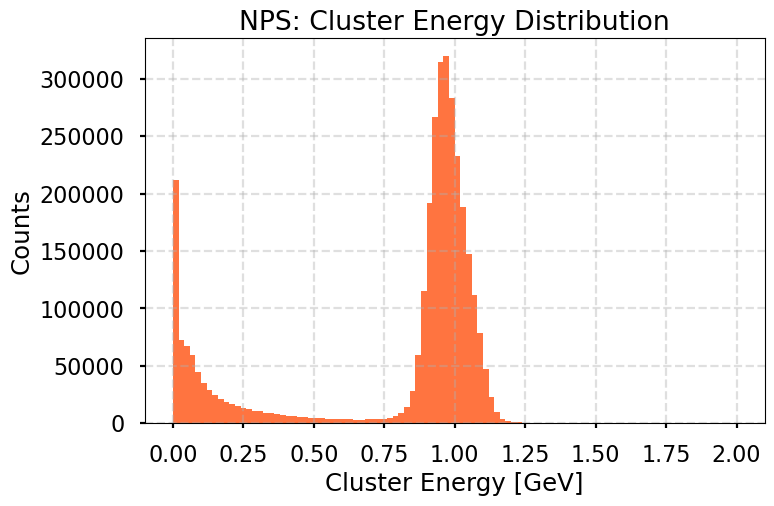

In [59]:
clusE = (branches["H.cal.etotnorm"])

plt.figure(figsize=(8,5))
plt.hist(clusE, bins=100, range=(0, 2), color="orangered", alpha=0.75)
plt.xlabel("Cluster Energy [GeV]")
plt.ylabel("Counts")
# plt.yscale('log')
plt.title("NPS: Cluster Energy Distribution")
plt.grid(True, linestyle="--", alpha=0.4)
plt.show()


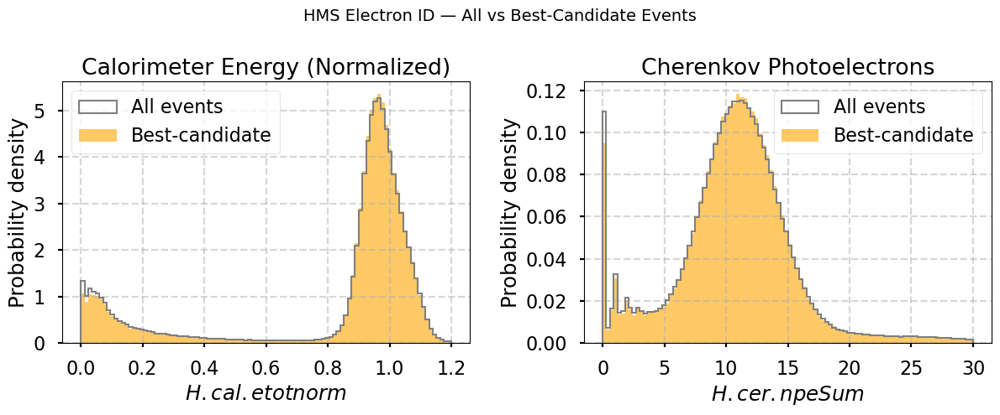

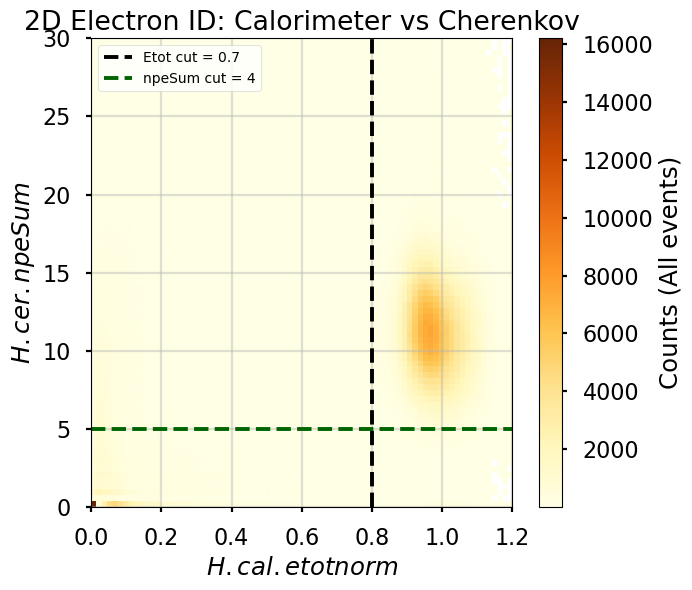


--- Event Summary ---
Total events: 1867180
Best-candidate events matched: 230468
Fraction = 12.343%

--- PID Statistics ---
H.cal.etot mean (all):  0.816, std: 0.339
H.cal.etot mean (best): 0.827, std: 0.330
H.cer.npeSum mean (all):  10.840, std: 5.249
H.cer.npeSum mean (best): 10.930, std: 5.175


In [60]:
import numpy as np
import awkward as ak
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# Load CSV (best candidate info) and ROOT-like branches
# ============================================================
df_csv = pd.read_csv("cluster_tags_with_best_candidate.csv")

# Example ROOT-like branches (already loaded in your session)
H_cal_etot = ak.to_numpy(branches["H.cal.etotnorm"])
H_cer_npesum = ak.to_numpy(branches["H.cer.npeSum"])

# ============================================================
# Filter events with at least 2 clusters (if relevant)
# ============================================================
has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
H_cal_etot = H_cal_etot[has_two_clust]
H_cer_npesum = H_cer_npesum[has_two_clust]
clusT = branches["NPS.cal.clusT"][has_two_clust]  # for event counting consistency

# ============================================================
# Match CSV best-candidate events to ROOT events
# ============================================================
tagged_event_ids = df_csv["event"].unique()
event_to_index = {evt: idx for idx, evt in enumerate(np.arange(len(H_cal_etot)))}

valid_events = [evt for evt in tagged_event_ids if evt in event_to_index]
etot_indices = [event_to_index[e] for e in valid_events]

H_cal_etot_valid = H_cal_etot[etot_indices]
H_cer_npesum_valid = H_cer_npesum[etot_indices]

# ============================================================
# Plot normalized histograms: Etot and NpeSum
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
plt.subplots_adjust(wspace=0.3)

# ----- H.cal.etotnorm -----
axes[0].hist(H_cal_etot, bins=100, density=True, range=(0, 1.2),
             histtype="step", color="gray", linewidth=1.5, label="All events")
axes[0].hist(H_cal_etot_valid, bins=100, density=True, range=(0, 1.2),
             histtype="stepfilled", alpha=0.6, color="orange", label="Best-candidate")
axes[0].set_xlabel(r"$H.cal.etotnorm$")
axes[0].set_ylabel("Probability density")
axes[0].set_title("Calorimeter Energy (Normalized)")
axes[0].grid(True, linestyle="--", alpha=0.5)
axes[0].legend()

# ----- H.cer.npeSum -----
axes[1].hist(H_cer_npesum, bins=100, density=True, range=(0, 30),
             histtype="step", color="gray", linewidth=1.5, label="All events")
axes[1].hist(H_cer_npesum_valid, bins=100, density=True, range=(0, 30),
             histtype="stepfilled", alpha=0.6, color="orange", label="Best-candidate")
axes[1].set_xlabel(r"$H.cer.npeSum$")
axes[1].set_ylabel("Probability density")
axes[1].set_title("Cherenkov Photoelectrons")
axes[1].grid(True, linestyle="--", alpha=0.5)
axes[1].legend()

plt.suptitle("HMS Electron ID — All vs Best-Candidate Events", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# ============================================================
# 2D Scatter / Density plot: Etotnorm vs npeSum
# ============================================================
plt.figure(figsize=(7,6))
plt.hist2d(H_cal_etot, H_cer_npesum, bins=[80,80], range=[[0,1.2],[0,30]],
           cmap="YlOrBr", cmin=1)
plt.colorbar(label="Counts (All events)")
# plt.scatter(H_cal_etot_valid, H_cer_npesum_valid, s=10, c="red", alpha=0.6, label="Best-candidate")
plt.axvline(0.8, color="black", linestyle="--", label="Etot cut = 0.7")
plt.axhline(5, color="darkgreen", linestyle="--", label="npeSum cut = 4")
plt.xlabel(r"$H.cal.etotnorm$")
plt.ylabel(r"$H.cer.npeSum$")
plt.title("2D Electron ID: Calorimeter vs Cherenkov")
plt.legend(fontsize=10)
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()

# ============================================================
# Summary Statistics
# ============================================================
print("\n--- Event Summary ---")
print(f"Total events: {len(clusT)}")
print(f"Best-candidate events matched: {len(valid_events)}")
print(f"Fraction = {len(valid_events)/len(clusT):.3%}")

print("\n--- PID Statistics ---")
print(f"H.cal.etot mean (all):  {np.mean(H_cal_etot):.3f}, std: {np.std(H_cal_etot):.3f}")
print(f"H.cal.etot mean (best): {np.mean(H_cal_etot_valid):.3f}, std: {np.std(H_cal_etot_valid):.3f}")
print(f"H.cer.npeSum mean (all):  {np.mean(H_cer_npesum):.3f}, std: {np.std(H_cer_npesum):.3f}")
print(f"H.cer.npeSum mean (best): {np.mean(H_cer_npesum_valid):.3f}, std: {np.std(H_cer_npesum_valid):.3f}")


Saved updated CSV with electron_tag: cluster_tags_with_electron_tag.csv


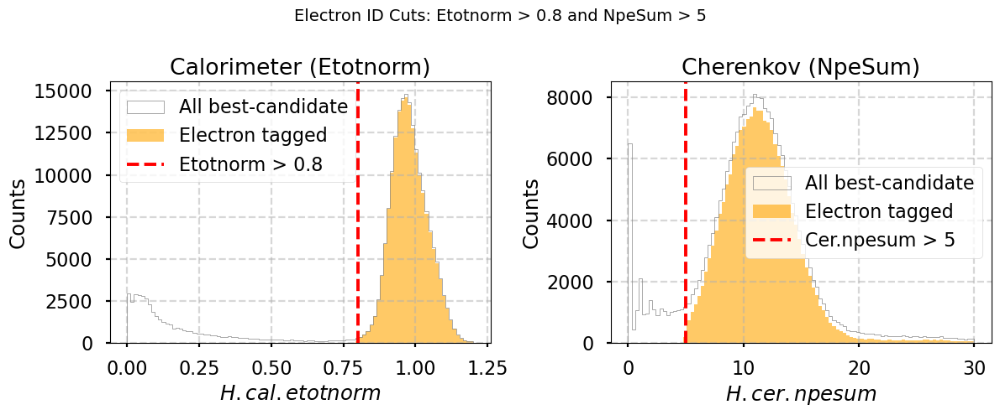


--- Event Summary ---
Total events: 1867180
Best-candidate events matched: 230468
Electron-tagged events: 183871
Fraction (electron/total) = 9.848%


In [61]:
import numpy as np
import awkward as ak
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# Load CSV and ROOT-like branches
# ============================================================
df_csv = pd.read_csv("cluster_tags_with_best_candidate.csv")

# Extract electron PID variables
H_cal_etotnorm = ak.to_numpy(branches["H.cal.etotnorm"])
H_cer_npesum = ak.to_numpy(branches["H.cer.npeSum"])

# Apply has_two_clust to keep alignment with NPS events
has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2
H_cal_etotnorm = H_cal_etotnorm[has_two_clust]
H_cer_npesum = H_cer_npesum[has_two_clust]
clusT = branches["NPS.cal.clusT"][has_two_clust]

# ============================================================
# Match CSV best-candidate events to ROOT events
# ============================================================
tagged_event_ids = df_csv["event"].unique()
event_to_index = {evt: idx for idx, evt in enumerate(np.arange(len(H_cal_etotnorm)))}

valid_events = [evt for evt in tagged_event_ids if evt in event_to_index]
etot_indices = [event_to_index[e] for e in valid_events]

H_cal_etotnorm_valid = H_cal_etotnorm[etot_indices]
H_cer_npesum_valid = H_cer_npesum[etot_indices]

# ============================================================
# Electron ID Cut: Etotnorm > 0.8 and Cer.npesum > 5
# ============================================================
electron_tag = (H_cal_etotnorm_valid > 0.8) & (H_cer_npesum_valid > 5)
electron_event_ids = np.array(valid_events)[electron_tag]

# Add electron_tag column to CSV
df_csv["electron_tag"] = df_csv["event"].isin(electron_event_ids)

# Save updated CSV
df_csv.to_csv("cluster_tags_with_electron_tag.csv", index=False)
print(f"Saved updated CSV with electron_tag: cluster_tags_with_electron_tag.csv")

# ============================================================
# Plot PID distributions with cuts
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
plt.subplots_adjust(wspace=0.3)

# ----- H.cal.etotnorm -----
axes[0].hist(H_cal_etotnorm_valid, bins=100, density=False, range = (0, 1.2), histtype="step", color="gray", label="All best-candidate")
axes[0].hist(H_cal_etotnorm_valid[electron_tag], bins=100, density=False, range = (0, 1.2), histtype="stepfilled", alpha=0.6, color="orange", label="Electron tagged")
axes[0].axvline(0.8, color="red", linestyle="--", label="Etotnorm > 0.8")
axes[0].set_xlabel(r"$H.cal.etotnorm$")
axes[0].set_ylabel("Counts")
axes[0].set_title("Calorimeter (Etotnorm)")
axes[0].legend()
axes[0].grid(True, linestyle="--", alpha=0.5)

# ----- H.cer.npesum -----
axes[1].hist(H_cer_npesum_valid, bins=100, density=False, histtype="step", range = (0, 30), color="gray", label="All best-candidate")
axes[1].hist(H_cer_npesum_valid[electron_tag], bins=100, density=False, range = (0, 30), histtype="stepfilled", alpha=0.6, color="orange", label="Electron tagged")
axes[1].axvline(5, color="red", linestyle="--", label="Cer.npesum > 5")
axes[1].set_xlabel(r"$H.cer.npesum$")
axes[1].set_ylabel("Counts")
axes[1].set_title("Cherenkov (NpeSum)")
axes[1].legend()
axes[1].grid(True, linestyle="--", alpha=0.5)

plt.suptitle("Electron ID Cuts: Etotnorm > 0.8 and NpeSum > 5", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# ============================================================
# Summary Statistics
# ============================================================
print("\n--- Event Summary ---")
print(f"Total events: {len(clusT)}")
print(f"Best-candidate events matched: {len(valid_events)}")
print(f"Electron-tagged events: {len(electron_event_ids)}")
print(f"Fraction (electron/total) = {len(electron_event_ids)/len(clusT):.3%}")


In [44]:
df = pd.read_csv("cluster_tags_with_precise_electron_tag.csv")
df[df["electron_tag"]==False].head()

,event,cluster_index,energy,x,y,inequality_tagged,opening_angle_tagged,both_tags,best_candidate,electron_tag
3,8,5,2.894413,16.863981,-8.145360,True,True,True,True,False
4,8,6,0.686936,-19.694294,-33.093613,True,True,True,True,False
9,58,0,0.682102,29.795368,-21.923618,True,True,True,False,False
10,58,1,1.518318,-8.241627,19.297280,True,True,True,False,False
13,70,1,2.640138,-21.018105,19.201902,True,True,True,True,False


Saved updated CSV with precise electron_tag: cluster_tags_with_precise_electron_tag.csv


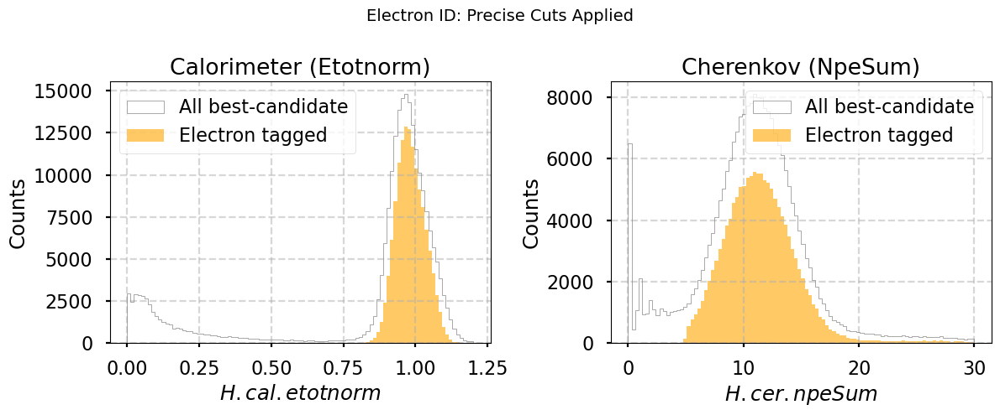


--- Event Summary ---
Total events: 1867180
Best-candidate events matched: 230468
Electron-tagged events (precise cuts): 133831
Fraction (electron/total) = 7.168%


In [61]:
import numpy as np
import awkward as ak
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# Load CSV and ROOT-like branches
# ============================================================
df_csv = pd.read_csv("cluster_tags_with_best_candidate.csv")

# Require at least two clusters for alignment
has_two_clust = ak.num(branches["NPS.cal.clusE"]) >= 2

# Electron PID variables (apply has_two_clust)
edt      = ak.to_numpy(branches["T.hms.hEDTM_tdcTimeRaw"])[has_two_clust]
dp       = ak.to_numpy(branches["H.gtr.dp"])[has_two_clust]
et       = ak.to_numpy(branches["H.gtr.p"])[has_two_clust]  # momentum as energy
etrnorm  = ak.to_numpy(branches["H.cal.etracknorm"])[has_two_clust]
npe      = ak.to_numpy(branches["H.cer.npeSum"])[has_two_clust]
th       = ak.to_numpy(branches["H.gtr.th"])[has_two_clust]
ph       = ak.to_numpy(branches["H.gtr.ph"])[has_two_clust]

H_cal_etotnorm = ak.to_numpy(branches["H.cal.etotnorm"])[has_two_clust]
H_cer_npesum   = ak.to_numpy(branches["H.cer.npeSum"])[has_two_clust]
clusT          = branches["NPS.cal.clusT"][has_two_clust]

# ============================================================
# Match CSV best-candidate events to ROOT events
# ============================================================
tagged_event_ids = df_csv["event"].unique()
event_to_index = {evt: idx for idx, evt in enumerate(np.arange(len(H_cal_etotnorm)))}

valid_events = [evt for evt in tagged_event_ids if evt in event_to_index]
etot_indices = [event_to_index[e] for e in valid_events]

# Convert all arrays to float
edt_valid     = np.array(edt[etot_indices], dtype=float)
dp_valid      = np.array(dp[etot_indices], dtype=float)
etrnorm_valid = np.array(etrnorm[etot_indices], dtype=float)
npe_valid     = np.array(npe[etot_indices], dtype=float)
th_valid      = np.array(th[etot_indices], dtype=float)
ph_valid      = np.array(ph[etot_indices], dtype=float)
H_cal_etotnorm_valid = np.array(H_cal_etotnorm[etot_indices], dtype=float)
H_cer_npesum_valid   = np.array(H_cer_npesum[etot_indices], dtype=float)

# Each condition in parentheses!
electron_tag = (
    (edt_valid < 0.1) &
    (np.abs(dp_valid) <= 8.5) &
    (np.abs(etrnorm_valid - 1) < 0.1) &
    (npe_valid > 1.0) &
    (np.abs(th_valid) <= 0.09) &
    (np.abs(ph_valid) <= 0.09) &
    (H_cer_npesum_valid > 5.0)  
)


electron_event_ids = np.array(valid_events)[electron_tag]
df_csv["electron_tag"] = df_csv["event"].isin(electron_event_ids)
df_csv.to_csv("cluster_tags_with_precise_electron_tag.csv", index=False)
print(f"Saved updated CSV with precise electron_tag: cluster_tags_with_precise_electron_tag.csv")

# ============================================================
# Plot PID distributions with precise cuts
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
plt.subplots_adjust(wspace=0.3)

# ----- Etotnorm -----
axes[0].hist(H_cal_etotnorm_valid, bins=100, density=False, range=(0, 1.2),
             histtype="step", color="gray", label="All best-candidate")
axes[0].hist(H_cal_etotnorm_valid[electron_tag], bins=100, density=False, range=(0, 1.2),
             histtype="stepfilled", alpha=0.6, color="orange", label="Electron tagged")
axes[0].set_xlabel(r"$H.cal.etotnorm$")
axes[0].set_ylabel("Counts")
axes[0].set_title("Calorimeter (Etotnorm)")
axes[0].legend()
axes[0].grid(True, linestyle="--", alpha=0.5)

# ----- Cer.npesum -----
axes[1].hist(H_cer_npesum_valid, bins=100, density=False, range=(0, 30),
             histtype="step", color="gray", label="All best-candidate")
axes[1].hist(H_cer_npesum_valid[electron_tag], bins=100, density=False, range=(0, 30),
             histtype="stepfilled", alpha=0.6, color="orange", label="Electron tagged")
axes[1].set_xlabel(r"$H.cer.npeSum$")
axes[1].set_ylabel("Counts")
axes[1].set_title("Cherenkov (NpeSum)")
axes[1].legend()
axes[1].grid(True, linestyle="--", alpha=0.5)

plt.suptitle("Electron ID: Precise Cuts Applied", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# ============================================================
# Summary
# ============================================================
print("\n--- Event Summary ---")
print(f"Total events: {len(clusT)}")
print(f"Best-candidate events matched: {len(valid_events)}")
print(f"Electron-tagged events (precise cuts): {len(electron_event_ids)}")
print(f"Fraction (electron/total) = {len(electron_event_ids)/len(clusT):.3%}")


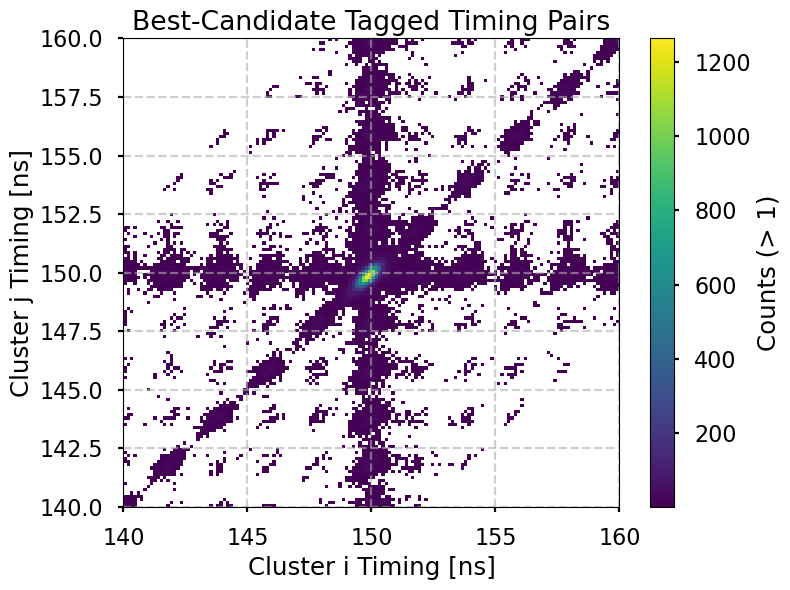

[INFO] Timing Gaussian Fit: μ=149.87 ns, σ=0.32 ns


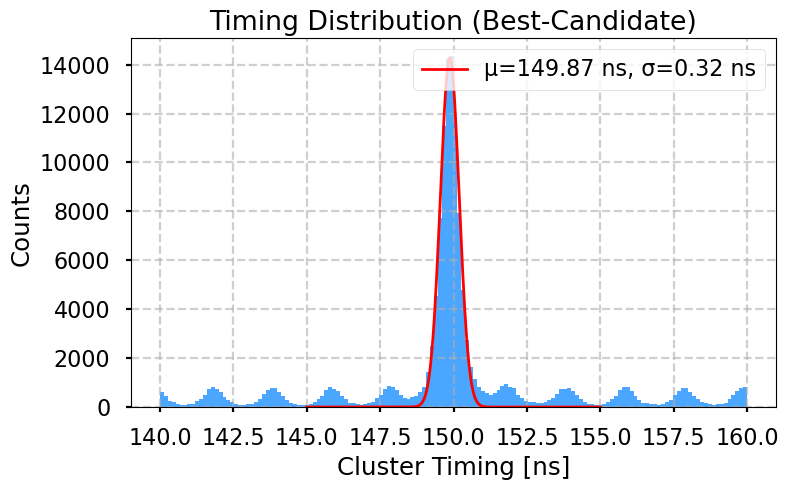

[INFO] Processing 98014 events with 196028 clusters...


/home/ubuntu/miniconda3/envs/everything/lib/python3.13/site-packages/numba/core/typed_passes.py:336: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.readthedocs.io/en/stable/user/parallel.html#diagnostics for help.

File "../../../../tmp/ipykernel_1139/3182078695.py", line 34:
<source missing, REPL/exec in use?>

  warnings.warn(errors.NumbaPerformanceWarning(msg,


[INFO] π⁰ Gaussian Fit: μ=129.43 MeV, σ=8.38 MeV


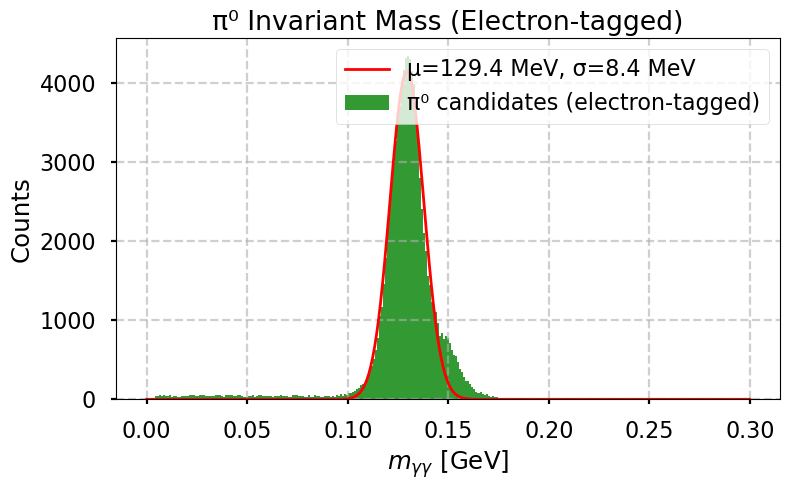

[INFO] Total electron-tagged γγ pairs: 98014


In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import numba as nb
from itertools import combinations

plt.ioff()

# ================================
# Gaussian for fitting
# ================================
def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# ================================
# Numba-accelerated π⁰ mass reconstruction
# ================================
@nb.njit(cache=True, fastmath=True)
def reconstruct_mass_numba(e1, e2, x1, y1, x2, y2, z_nps=407.0):
    """Compute invariant mass for a single γγ pair (GeV)."""
    n1 = (x1*x1 + y1*y1 + z_nps*z_nps)**0.5
    n2 = (x2*x2 + y2*y2 + z_nps*z_nps)**0.5
    u1x, u1y, u1z = x1/n1, y1/n1, z_nps/n1
    u2x, u2y, u2z = x2/n2, y2/n2, z_nps/n2
    p1x, p1y, p1z = e1*u1x, e1*u1y, e1*u1z
    p2x, p2y, p2z = e2*u2x, e2*u2y, e2*u2z
    total_E = e1 + e2
    px, py, pz = p1x + p2x, p1y + p2y, p1z + p2z
    m2 = total_E*total_E - (px*px + py*py + pz*pz)
    return (m2**0.5) if m2 > 0.0 else 0.0


@nb.njit(cache=True, fastmath=True, parallel=True)
def reconstruct_all_masses(unique_events, clusters_per_event, energies, xs, ys, z_nps=407.0):
    """Compute invariant masses for all γγ pairs (parallelized)."""
    masses = []
    i = 0
    for ev in range(len(clusters_per_event)):
        n = clusters_per_event[ev]
        if n < 2:
            i += n
            continue
        for j in range(n):
            for k in range(j+1, n):
                e1, e2 = energies[i+j], energies[i+k]
                x1, y1 = xs[i+j], ys[i+j]
                x2, y2 = xs[i+k], ys[i+k]
                m = reconstruct_mass_numba(e1, e2, x1, y1, x2, y2, z_nps)
                if m > 0:
                    masses.append(m)
        i += n
    return np.array(masses)

# ================================
# Plotting helpers
# ================================
def plot_2d_timing(hist_bc, hist_min, hist_max, threshold, save_path=None):
    counts_plot = np.where(hist_bc == -1, np.nan, hist_bc)
    n_bins = hist_bc.shape[0]
    X, Y = np.meshgrid(
        np.linspace(hist_min, hist_max, n_bins + 1),
        np.linspace(hist_min, hist_max, n_bins + 1)
    )
    plt.figure(figsize=(8,6))
    pcm = plt.pcolormesh(X, Y, counts_plot.T, cmap='viridis')
    cbar = plt.colorbar(pcm)
    cbar.set_label(f'Counts (> {threshold})')
    plt.title("Best-Candidate Tagged Timing Pairs")
    plt.xlabel("Cluster i Timing [ns]")
    plt.ylabel("Cluster j Timing [ns]")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    plt.show()


def plot_1d_timing_with_fit(centers_bc, counts_bc, peak_range=(145,155), save_path=None):
    plt.figure(figsize=(8,5))
    plt.bar(centers_bc, counts_bc, width=(centers_bc[1]-centers_bc[0]), color='dodgerblue', alpha=0.8)
    mask = (centers_bc >= peak_range[0]) & (centers_bc <= peak_range[1])
    x_fit, y_fit = centers_bc[mask], counts_bc[mask]
    try:
        popt, _ = curve_fit(gaussian, x_fit, y_fit, p0=[np.max(y_fit), np.mean(x_fit), 1.0])
        A, mu, sigma = popt
        x_line = np.linspace(peak_range[0], peak_range[1], 300)
        y_line = gaussian(x_line, *popt)
        plt.plot(x_line, y_line, 'r-', lw=2, label=f'μ={mu:.2f} ns, σ={sigma:.2f} ns')
        print(f"[INFO] Timing Gaussian Fit: μ={mu:.2f} ns, σ={sigma:.2f} ns")
    except RuntimeError:
        print("[WARN] Timing fit failed")

    plt.xlabel("Cluster Timing [ns]")
    plt.ylabel("Counts")
    plt.title("Timing Distribution (Best-Candidate)")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    plt.show()


# ================================
# π⁰ invariant mass with electron-tag
# ================================
def plot_pi0_mass(csv_file, z_nps=407.0, save_path=None):
    df = pd.read_csv(csv_file)

    # --- Select π⁰ best-candidate + electron-tagged ---
    df_sel = df[(df["best_candidate"] == True) & (df["electron_tag"] == True)].copy()
    if df_sel.empty:
        print("[WARN] No events with both π⁰ best-candidate and electron_tag")
        return

    # --- Prepare arrays for Numba ---
    df_sel = df_sel.sort_values("event")
    events = df_sel["event"].to_numpy()
    energies = df_sel["energy"].to_numpy()
    xs = df_sel["x"].to_numpy()
    ys = df_sel["y"].to_numpy()
    unique_events, counts = np.unique(events, return_counts=True)

    print(f"[INFO] Processing {len(unique_events)} events with {len(df_sel)} clusters...")

    # --- Fast invariant mass reconstruction ---
    masses = reconstruct_all_masses(unique_events, counts, energies, xs, ys, z_nps)
    if len(masses) == 0:
        print("[WARN] No valid γγ pairs after cuts.")
        return

    # --- Histogram and fit ---
    bins = np.linspace(0.0, 0.3, 300)
    counts_hist, edges = np.histogram(masses, bins=bins)
    centers = 0.5*(edges[1:] + edges[:-1])

    plt.figure(figsize=(8,5))
    plt.bar(centers, counts_hist, width=(centers[1]-centers[0]), color='green', alpha=0.8,
            label='π⁰ candidates (electron-tagged)')

    mask = (centers >= 0.10) & (centers <= 0.160)
    x_fit, y_fit = centers[mask], counts_hist[mask]
    try:
        popt, _ = curve_fit(gaussian, x_fit, y_fit,
                            p0=[np.max(y_fit), 0.135, 0.01],
                            bounds=([0, 0.12, 0], [np.inf, 0.14, 0.05]))
        A, mu, sigma = popt
        x_line = np.linspace(0.00, 0.3, 300)
        y_line = gaussian(x_line, *popt)
        plt.plot(x_line, y_line, 'r-', lw=2, label=f'μ={mu*1000:.1f} MeV, σ={sigma*1000:.1f} MeV')
        print(f"[INFO] π⁰ Gaussian Fit: μ={mu*1000:.2f} MeV, σ={sigma*1000:.2f} MeV")
    except RuntimeError:
        print("[WARN] π⁰ Gaussian fit failed")

    plt.xlabel(r"$m_{\gamma\gamma}$ [GeV]")
    plt.ylabel("Counts")
    plt.title("π⁰ Invariant Mass (Electron-tagged)")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    plt.show()

    print(f"[INFO] Total electron-tagged γγ pairs: {len(masses)}")


# ================================
# Load timing histograms
# ================================
data = np.load("cluster_timing_histograms_best_candidate.npz")
hist_bc = data["hist_bc"]
centers_bc = data["centers_bc"]
counts_bc = data["counts_bc"]
hist_min = float(data["hist_min"])
hist_max = float(data["hist_max"])
threshold = int(data["threshold"])

# ================================
# Produce all plots
# ================================
plot_2d_timing(hist_bc, hist_min, hist_max, threshold, save_path="timing_2d_best_candidate.png")
plot_1d_timing_with_fit(centers_bc, counts_bc, peak_range=(145,155), save_path="timing_1d_best_candidate.png")
plot_pi0_mass("cluster_tags_with_electron_tag.csv", save_path="pi0_mass_electron_tagged.png")


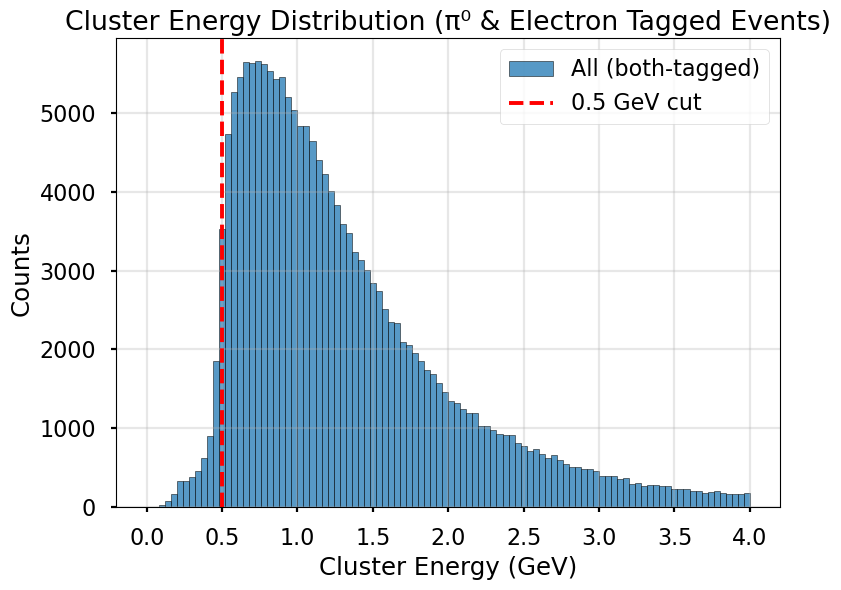

Total clusters in CSV: 526723
Best-candidate clusters: 304626
Electron-tagged clusters: 306119
Clusters passing both tags: 177482
Clusters with E < 0.5 GeV (both tags): 6696
Fraction below 0.5 GeV: 3.77%


In [62]:
import pandas as pd
import matplotlib.pyplot as plt

# ==============================
# Load CSV
# ==============================
# df = pd.read_csv("cluster_tags_with_electron_tag.csv")  # replace with your file name
df = pd.read_csv("cluster_tags_with_precise_electron_tag.csv")  # replace with your file name

# ==============================
# Select events passing both tags
# ==============================
df_both = df[(df["best_candidate"] == True) & (df["electron_tag"] == True)]

# ==============================
# Fraction with energy < 0.5 GeV
# ==============================
low_energy = df_both[df_both["energy"] < 0.5]
frac_low = len(low_energy) / len(df_both) if len(df_both) > 0 else 0.0

# ==============================
# Plot cluster energy distribution
# ==============================
plt.figure(figsize=(8, 6))
plt.hist(df_both["energy"], range=(0, 4), bins=100, alpha=0.75, edgecolor="black", label="All (both-tagged)")
plt.axvline(0.5, color="red", linestyle="--", label="0.5 GeV cut")
plt.xlabel("Cluster Energy (GeV)")
plt.ylabel("Counts")
plt.title("Cluster Energy Distribution (π⁰ & Electron Tagged Events)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ==============================
# Summary printout
# ==============================
print(f"Total clusters in CSV: {len(df)}")
print(f"Best-candidate clusters: {df['best_candidate'].sum()}")
print(f"Electron-tagged clusters: {df['electron_tag'].sum()}")
print(f"Clusters passing both tags: {len(df_both)}")
print(f"Clusters with E < 0.5 GeV (both tags): {len(low_energy)}")
print(f"Fraction below 0.5 GeV: {frac_low:.2%}")


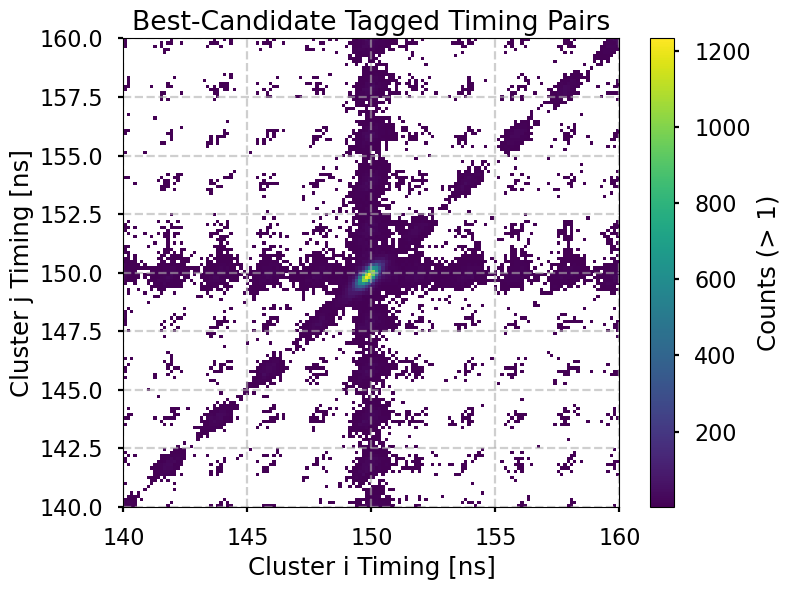

[INFO] Timing Gaussian Fit: μ=149.88 ns, σ=0.32 ns


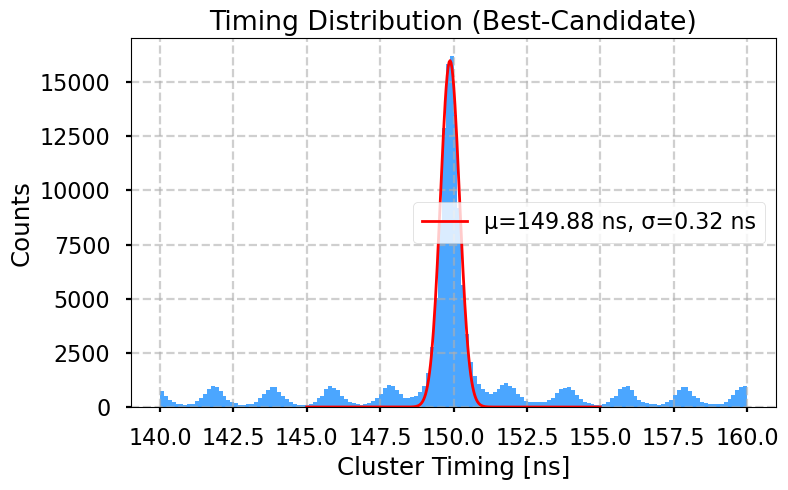

[INFO] Processing 88741 events with 177482 clusters...
[INFO] π⁰ Gaussian Fit: μ=129.24 MeV, σ=7.64 MeV


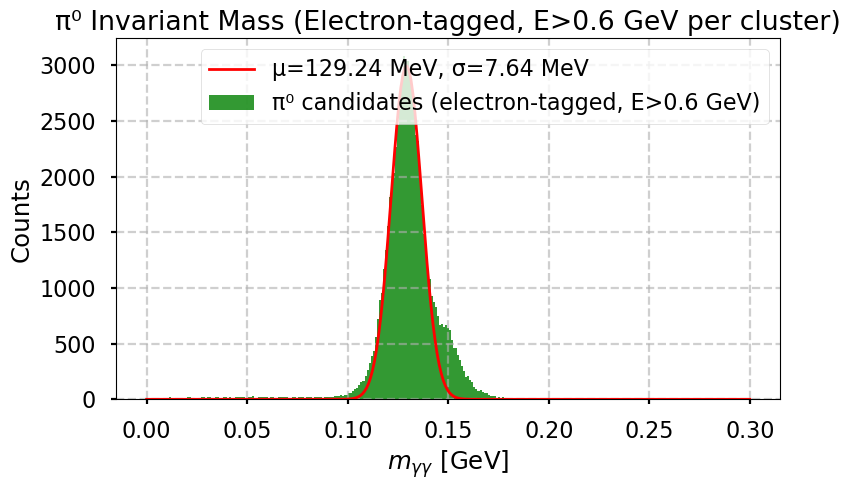

[INFO] Total electron-tagged γγ pairs (E>0.6 GeV): 70336


In [89]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import numba as nb
from itertools import combinations

plt.ioff()

# ================================
# Gaussian for fitting
# ================================
def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# ================================
# Numba-accelerated π⁰ mass reconstruction
# ================================
energy_min = 0.6
@nb.njit(cache=True, fastmath=True)
def reconstruct_mass_numba(e1, e2, x1, y1, x2, y2, z_nps=407.0):
    """Compute invariant mass for a single γγ pair (GeV)."""
    n1 = (x1*x1 + y1*y1 + z_nps*z_nps)**0.5
    n2 = (x2*x2 + y2*y2 + z_nps*z_nps)**0.5
    u1x, u1y, u1z = x1/n1, y1/n1, z_nps/n1
    u2x, u2y, u2z = x2/n2, y2/n2, z_nps/n2
    p1x, p1y, p1z = e1*u1x, e1*u1y, e1*u1z
    p2x, p2y, p2z = e2*u2x, e2*u2y, e2*u2z
    total_E = e1 + e2
    px, py, pz = p1x + p2x, p1y + p2y, p1z + p2z
    m2 = total_E*total_E - (px*px + py*py + pz*pz)
    return (m2**0.5) if m2 > 0.0 else 0.0


@nb.njit(cache=True, fastmath=True, parallel=True)
def reconstruct_all_masses(unique_events, clusters_per_event, energies, xs, ys, z_nps=407.0):
    """Compute invariant masses for all γγ pairs (parallelized) with E>0.5 GeV cut."""
    masses = []
    i = 0
    # energy_min = 0.6
    for ev in range(len(clusters_per_event)):
        n = clusters_per_event[ev]
        if n < 2:
            i += n
            continue
        for j in range(n):
            for k in range(j+1, n):
                e1, e2 = energies[i+j], energies[i+k]
                # --- Require both clusters to have energy > 0.5 GeV ---
                if e1 <= energy_min or e2 <=energy_min:
                    continue
                x1, y1 = xs[i+j], ys[i+j]
                x2, y2 = xs[i+k], ys[i+k]
                m = reconstruct_mass_numba(e1, e2, x1, y1, x2, y2, z_nps)
                if m > 0:
                    masses.append(m)
        i += n
    return np.array(masses)

# ================================
# Plotting helpers
# ================================
def plot_2d_timing(hist_bc, hist_min, hist_max, threshold, save_path=None):
    counts_plot = np.where(hist_bc == -1, np.nan, hist_bc)
    n_bins = hist_bc.shape[0]
    X, Y = np.meshgrid(
        np.linspace(hist_min, hist_max, n_bins + 1),
        np.linspace(hist_min, hist_max, n_bins + 1)
    )
    plt.figure(figsize=(8,6))
    pcm = plt.pcolormesh(X, Y, counts_plot.T, cmap='viridis')
    cbar = plt.colorbar(pcm)
    cbar.set_label(f'Counts (> {threshold})')
    plt.title("Best-Candidate Tagged Timing Pairs")
    plt.xlabel("Cluster i Timing [ns]")
    plt.ylabel("Cluster j Timing [ns]")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    plt.show()


def plot_1d_timing_with_fit(centers_bc, counts_bc, peak_range=(145,155), save_path=None):
    plt.figure(figsize=(8,5))
    plt.bar(centers_bc, counts_bc, width=(centers_bc[1]-centers_bc[0]), color='dodgerblue', alpha=0.8)
    mask = (centers_bc >= peak_range[0]) & (centers_bc <= peak_range[1])
    x_fit, y_fit = centers_bc[mask], counts_bc[mask]
    try:
        popt, _ = curve_fit(gaussian, x_fit, y_fit, p0=[np.max(y_fit), np.mean(x_fit), 1.0])
        A, mu, sigma = popt
        x_line = np.linspace(peak_range[0], peak_range[1], 300)
        y_line = gaussian(x_line, *popt)
        plt.plot(x_line, y_line, 'r-', lw=2, label=f'μ={mu:.2f} ns, σ={sigma:.2f} ns')
        print(f"[INFO] Timing Gaussian Fit: μ={mu:.2f} ns, σ={sigma:.2f} ns")
    except RuntimeError:
        print("[WARN] Timing fit failed")

    plt.xlabel("Cluster Timing [ns]")
    plt.ylabel("Counts")
    plt.title("Timing Distribution (Best-Candidate)")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    plt.show()


# ================================
# π⁰ invariant mass with electron-tag and E>0.5 GeV cut
# ================================
def plot_pi0_mass(csv_file, z_nps=407.0, save_path=None):
    df = pd.read_csv(csv_file)

    # --- Select π⁰ best-candidate + electron-tagged ---
    df_sel = df[(df["best_candidate"] == True) & (df["electron_tag"] == True)].copy()
    if df_sel.empty:
        print("[WARN] No events with both π⁰ best-candidate and electron_tag")
        return

    # --- Prepare arrays for Numba ---
    df_sel = df_sel.sort_values("event")
    events = df_sel["event"].to_numpy()
    energies = df_sel["energy"].to_numpy()
    xs = df_sel["x"].to_numpy()
    ys = df_sel["y"].to_numpy()
    unique_events, counts = np.unique(events, return_counts=True)

    print(f"[INFO] Processing {len(unique_events)} events with {len(df_sel)} clusters...")

    # --- Fast invariant mass reconstruction with energy > 0.5 GeV cut ---
    masses = reconstruct_all_masses(unique_events, counts, energies, xs, ys, z_nps)
    if len(masses) == 0:
        print("[WARN] No valid γγ pairs after cuts.")
        return

    # --- Histogram and fit ---
    bins = np.linspace(0.0, 0.3, 300)
    counts_hist, edges = np.histogram(masses, bins=bins)
    centers = 0.5*(edges[1:] + edges[:-1])

    plt.figure(figsize=(8,5))
    plt.bar(centers, counts_hist, width=(centers[1]-centers[0]), color='green', alpha=0.8,
            label=f'π⁰ candidates (electron-tagged, E>{energy_min} GeV)')

    mask = (centers >= 0.12) & (centers <= 0.140)
    x_fit, y_fit = centers[mask], counts_hist[mask]
    try:
        popt, _ = curve_fit(gaussian, x_fit, y_fit,
                            p0=[np.max(y_fit), 0.135, 0.01],
                            bounds=([0, 0.12, 0], [np.inf, 0.14, 0.05]))
        A, mu, sigma = popt
        x_line = np.linspace(0.00, 0.3, 300)
        y_line = gaussian(x_line, *popt)
        plt.plot(x_line, y_line, 'r-', lw=2, label=f'μ={mu*1000:.2f} MeV, σ={sigma*1000:.2f} MeV')
        print(f"[INFO] π⁰ Gaussian Fit: μ={mu*1000:.2f} MeV, σ={sigma*1000:.2f} MeV")
    except RuntimeError:
        print("[WARN] π⁰ Gaussian fit failed")

    plt.xlabel(r"$m_{\gamma\gamma}$ [GeV]")
    plt.ylabel("Counts")
    plt.title(f"π⁰ Invariant Mass (Electron-tagged, E>{energy_min} GeV per cluster)")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    plt.show()

    print(f"[INFO] Total electron-tagged γγ pairs (E>{energy_min} GeV): {len(masses)}")


# ================================
# Load timing histograms
# ================================
data = np.load("cluster_timing_histograms_best_candidate.npz")
hist_bc = data["hist_bc"]
centers_bc = data["centers_bc"]
counts_bc = data["counts_bc"]
hist_min = float(data["hist_min"])
hist_max = float(data["hist_max"])
threshold = int(data["threshold"])

# ================================
# Produce all plots
# ================================
plot_2d_timing(hist_bc, hist_min, hist_max, threshold, save_path="timing_2d_best_candidate.png")
plot_1d_timing_with_fit(centers_bc, counts_bc, peak_range=(145,155), save_path="timing_1d_best_candidate.png")
plot_pi0_mass("cluster_tags_with_precise_electron_tag.csv", save_path="pi0_mass_electron_tagged_Egt0p5.png")


Number of 2-cluster events (both tags): 88741
Mean distance: 46.75
Median distance: 46.63


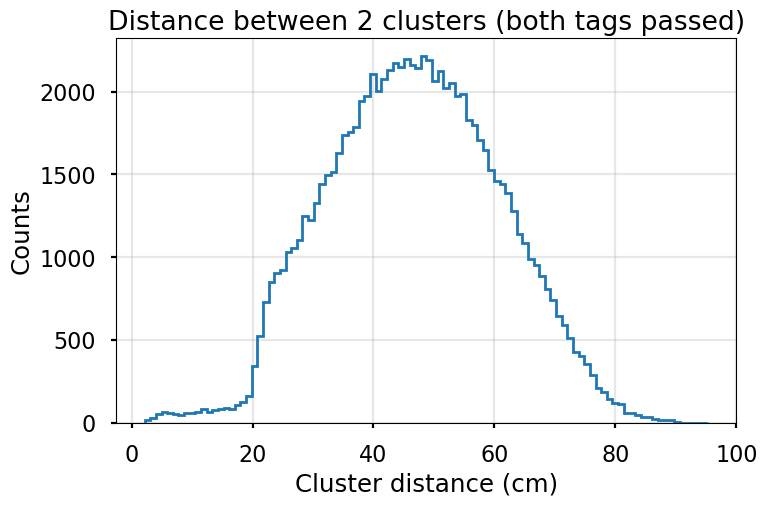

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numba as nb

# ==========================
# Load Data
# ==========================
# df = pd.read_csv("cluster_tags_with_electron_tag.csv")
df = pd.read_csv("cluster_tags_with_precise_electron_tag.csv")

# Apply both cuts
df_both = df[(df["best_candidate"]) & (df["electron_tag"])]

# ==========================
# Numba-accelerated distance calculation
# ==========================
@nb.njit
def compute_distances(events, xs, ys):
    # Assumes sorted by event number
    distances = []
    i = 0
    while i < len(events) - 1:
        if events[i] == events[i + 1]:
            dx = xs[i] - xs[i + 1]
            dy = ys[i] - ys[i + 1]
            distances.append((dx * dx + dy * dy) ** 0.5)
            i += 2  # skip the next since it's the same event
        else:
            i += 1
    return np.array(distances)

# Sort by event to make grouping fast
df_both = df_both.sort_values("event")

# Convert to numpy arrays
events = df_both["event"].to_numpy()
xs = df_both["x"].to_numpy()
ys = df_both["y"].to_numpy()

# Compute distances
distances = compute_distances(events, xs, ys)

# ==========================
# Print summary
# ==========================
print(f"Number of 2-cluster events (both tags): {len(distances)}")
print(f"Mean distance: {np.mean(distances):.2f}")
print(f"Median distance: {np.median(distances):.2f}")

# ==========================
# Plot histogram
# ==========================
plt.figure(figsize=(8,5))
plt.hist(distances, bins=100, histtype='step', linewidth=2)
plt.xlabel("Cluster distance (cm)")
plt.ylabel("Counts")
plt.title("Distance between 2 clusters (both tags passed)")
plt.grid(True, alpha=0.3)
plt.show()


Total events passing both tags: 177482
Number of reconstructed π⁰ candidates (2-cluster events): 88741
Mean cluster distance: 46.75 cm
Median cluster distance: 46.63 cm
Mean total energy: 2.71 GeV
Fraction of events with E_sum < 1 GeV: 0.21%
Mean energy asymmetry: 0.32


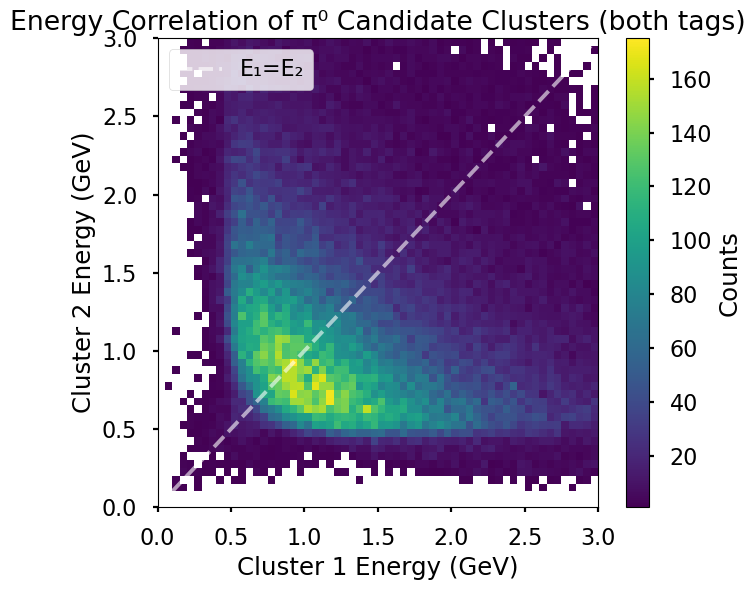

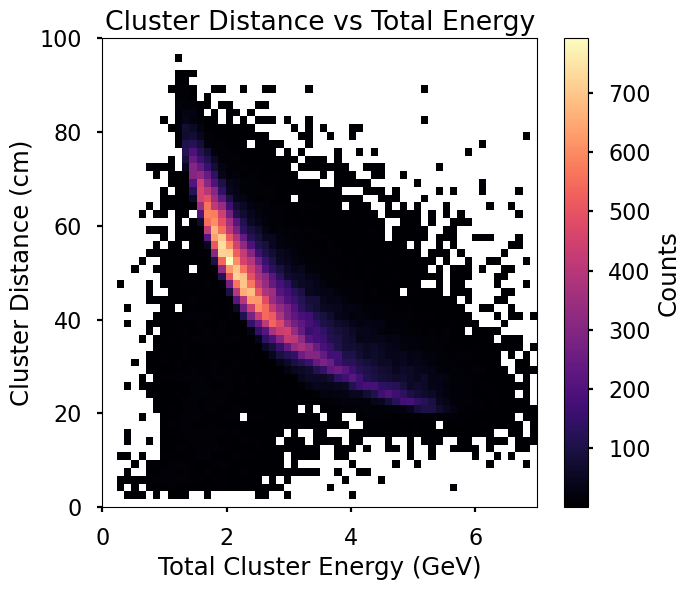

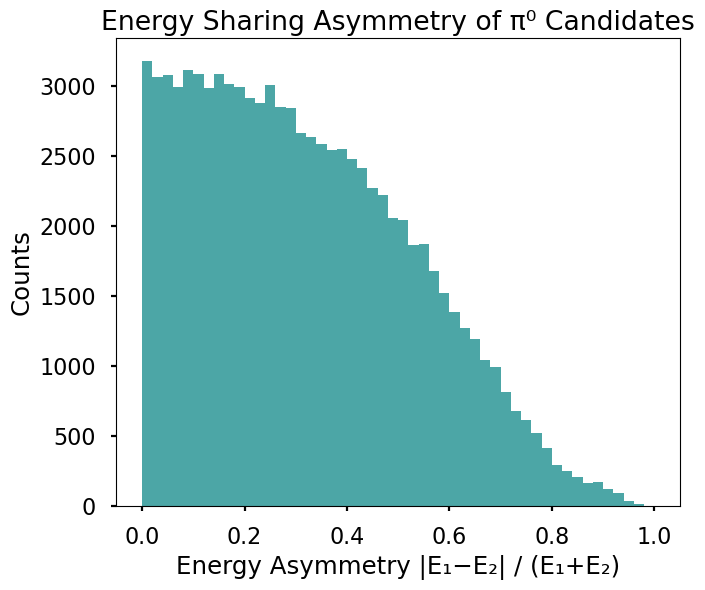

In [65]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numba as nb
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

# ==========================
# Load Data
# ==========================
# df = pd.read_csv("cluster_tags_with_electron_tag.csv")
df = pd.read_csv("cluster_tags_with_precise_electron_tag.csv")

# Apply both tags: π⁰ and electron selection
df_both = df[(df["best_candidate"]) & (df["electron_tag"])].copy()

if len(df_both) < 2:
    raise ValueError("No events found passing both tags!")

# ==========================
# Sort and Prepare
# ==========================
df_both = df_both.sort_values(["event", "cluster_index"])
events = df_both["event"].to_numpy()
xs = df_both["x"].to_numpy()
ys = df_both["y"].to_numpy()
energies = df_both["energy"].to_numpy()

# ==========================
# Numba accelerated distance computation
# ==========================
@nb.njit
def compute_distances_and_energies(events, xs, ys, energies):
    distances = []
    e1_list = []
    e2_list = []
    i = 0
    while i < len(events) - 1:
        if events[i] == events[i + 1]:
            dx = xs[i] - xs[i + 1]
            dy = ys[i] - ys[i + 1]
            dist = (dx * dx + dy * dy) ** 0.5
            distances.append(dist)
            e1_list.append(energies[i])
            e2_list.append(energies[i + 1])
            i += 2
        else:
            i += 1
    return np.array(distances), np.array(e1_list), np.array(e2_list)

distances, e1, e2 = compute_distances_and_energies(events, xs, ys, energies)

# ==========================
# Derived Quantities
# ==========================
E_sum = e1 + e2
E_diff = np.abs(e1 - e2)
E_asym = E_diff / E_sum  # energy asymmetry (0 = symmetric)
n_events = len(distances)

# ==========================
# Summary
# ==========================
print(f"Total events passing both tags: {len(df_both)}")
print(f"Number of reconstructed π⁰ candidates (2-cluster events): {n_events}")
print(f"Mean cluster distance: {np.mean(distances):.2f} cm")
print(f"Median cluster distance: {np.median(distances):.2f} cm")
print(f"Mean total energy: {np.mean(E_sum):.2f} GeV")
print(f"Fraction of events with E_sum < 1 GeV: {np.mean(E_sum < 1):.2%}")
print(f"Mean energy asymmetry: {np.mean(E_asym):.2f}")

# ==========================
# 3D Scatter Plot
# ==========================
# fig = plt.figure(figsize=(9,7))
# ax = fig.add_subplot(111, projection='3d')

# p = ax.scatter(e1, e2, distances, c=E_asym, cmap="plasma", s=45, alpha=0.8)
# ax.set_xlabel("Cluster 1 Energy (GeV)")
# ax.set_ylabel("Cluster 2 Energy (GeV)")
# ax.set_zlabel("Cluster Distance (cm)")
# ax.set_title("π⁰ Candidate Correlation: E₁ vs E₂ vs Distance")
# fig.colorbar(p, ax=ax, label="Energy Asymmetry |E₁−E₂| / (E₁+E₂)")

# ax.view_init(elev=25, azim=45)  # better perspective
# plt.tight_layout()
# plt.show()

# ==========================
# 2D Heatmaps
# ==========================

plt.figure(figsize=(7,6))
plt.hist2d(e1, e2, bins=[60,60], range=[[0,3],[0,3]], cmap="viridis", cmin=1)
plt.colorbar(label="Counts")
plt.xlabel("Cluster 1 Energy (GeV)")
plt.ylabel("Cluster 2 Energy (GeV)")
plt.title("Energy Correlation of π⁰ Candidate Clusters (both tags)")
plt.axline((0,0),(1,1), color='white', linestyle='--', alpha=0.6, label="E₁=E₂")
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(7,6))
plt.hist2d(E_sum, distances, bins=[60,60], range=[[0,7],[0,100]], cmap="magma", cmin=1)
plt.colorbar(label="Counts")
plt.xlabel("Total Cluster Energy (GeV)")
plt.ylabel("Cluster Distance (cm)")
plt.title("Cluster Distance vs Total Energy")
plt.tight_layout()
plt.show()

plt.figure(figsize=(7,6))
plt.hist(E_asym, bins=50, range=(0,1), color="teal", alpha=0.7)
plt.xlabel("Energy Asymmetry |E₁−E₂| / (E₁+E₂)")
plt.ylabel("Counts")
plt.title("Energy Sharing Asymmetry of π⁰ Candidates")
plt.tight_layout()
plt.show()


Accidental counts per region:
R1: 2316
R2: 3656
R3: 334
Final accidental estimate = 5638
Triple coincidence counts: 1031
Accidental contribution: 5638 (60.8%)


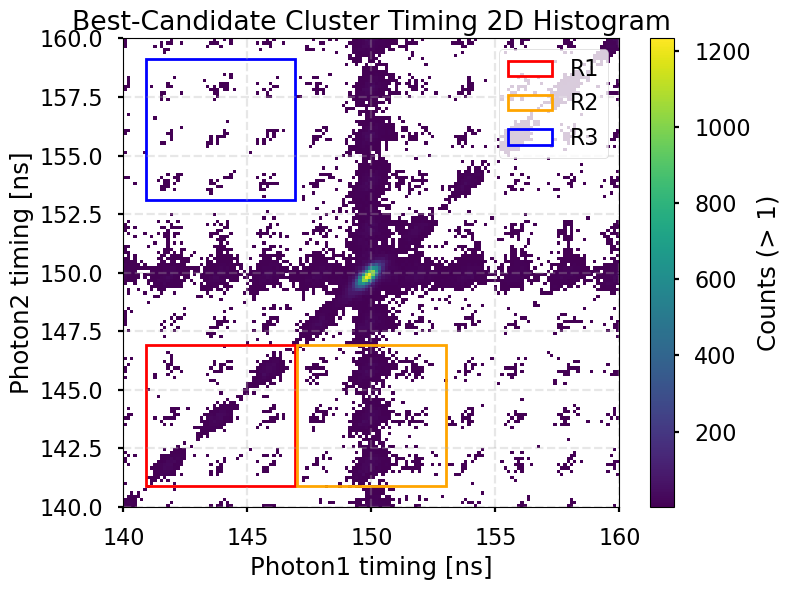

In [75]:
import numpy as np
import matplotlib.pyplot as plt

# ================================
# Load timing histogram
# ================================
data = np.load("cluster_timing_histograms_best_candidate.npz")
hist_bc = data["hist_bc"]
centers_bc = data["centers_bc"]
hist_min = float(data["hist_min"])
hist_max = float(data["hist_max"])
threshold = int(data["threshold"])
n_bins = hist_bc.shape[0]

# ================================
# Helper to convert ns -> bin index
# ================================
bin_w = (hist_max - hist_min) / n_bins
center_val = 150.0
def find_bin_idx(val):
    return int((val - hist_min) / bin_w)

# ================================
# Define accidental regions relative to central peak
# ================================
regions = {
    "R1": {"x": [-9.1,-3.1], "y": [-9.1,-3.1]},  # (acc_e, coinc γ1, γ2) + (acc_acc_acc)
    "R2": {"x": [-3,3],   "y": [-9.1,-3.1]},  # (coinc γ1, acc, γ2) + (acc_acc_acc)
    "R3": {"x": [-9.1,-3.1], "y": [3.1,9.1]}     # (acc_acc_acc)
}

def sum_region(hist, xlim, ylim):
    x0 = find_bin_idx(center_val + xlim[0])
    x1 = find_bin_idx(center_val + xlim[1])
    y0 = find_bin_idx(center_val + ylim[0])
    y1 = find_bin_idx(center_val + ylim[1])
    return np.sum(hist[x0:x1+1, y0:y1+1][hist[x0:x1+1, y0:y1+1] > 0])

# ================================
# Calculate accidentals
# ================================
R_counts = {k: sum_region(hist_bc, v["x"], v["y"]) for k,v in regions.items()}
accidental_estimate = R_counts["R1"] + R_counts["R2"] - R_counts["R3"]

print("Accidental counts per region:")
for k,v in R_counts.items():
    print(f"{k}: {v}")
print(f"Final accidental estimate = {accidental_estimate}")

# Triple coincidence bin index
i_center = find_bin_idx(center_val)
N_total_peak = hist_bc[i_center, i_center]
background_fraction = (accidental_estimate/9) / N_total_peak * 100.0

print(f"Triple coincidence counts: {N_total_peak}")
print(f"Accidental contribution: {accidental_estimate} ({background_fraction:.1f}%)")


# ================================
# 2D plot with masked bins
# ================================
counts_plot = np.where(hist_bc <= threshold, np.nan, hist_bc)
X, Y = np.meshgrid(
    np.linspace(hist_min, hist_max, n_bins+1),
    np.linspace(hist_min, hist_max, n_bins+1)
)
plt.figure(figsize=(8,6))
pcm = plt.pcolormesh(X, Y, counts_plot.T, cmap='viridis')
cbar = plt.colorbar(pcm)
cbar.set_label(f'Counts (> {threshold})')
plt.xlabel("Photon1 timing [ns]")
plt.ylabel("Photon2 timing [ns]")
plt.title("Best-Candidate Cluster Timing 2D Histogram")

# Overlay accidental regions
colors = {"R1":"red","R2":"orange","R3":"blue"}
for key,val in regions.items():
    plt.gca().add_patch(plt.Rectangle(
        (center_val+val["x"][0], center_val+val["y"][0]),
        val["x"][1]-val["x"][0],
        val["y"][1]-val["y"][0],
        fill=False, edgecolor=colors[key], lw=2, label=key
    ))

plt.legend()
plt.grid(True, linestyle="--", alpha=0.3)
plt.tight_layout()
plt.show()


Accidental counts per region:
R1: 2316
R2: 3656
R3: 334
Final accidental estimate = 5638
Central bin counts before: 30961
Central bin counts after: 30308.193761814742
Estimated background fraction: 2.1%


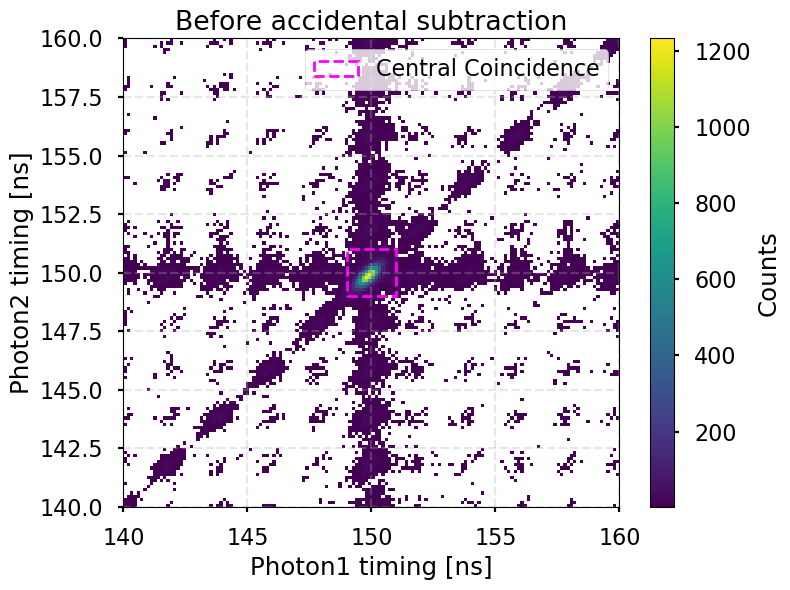

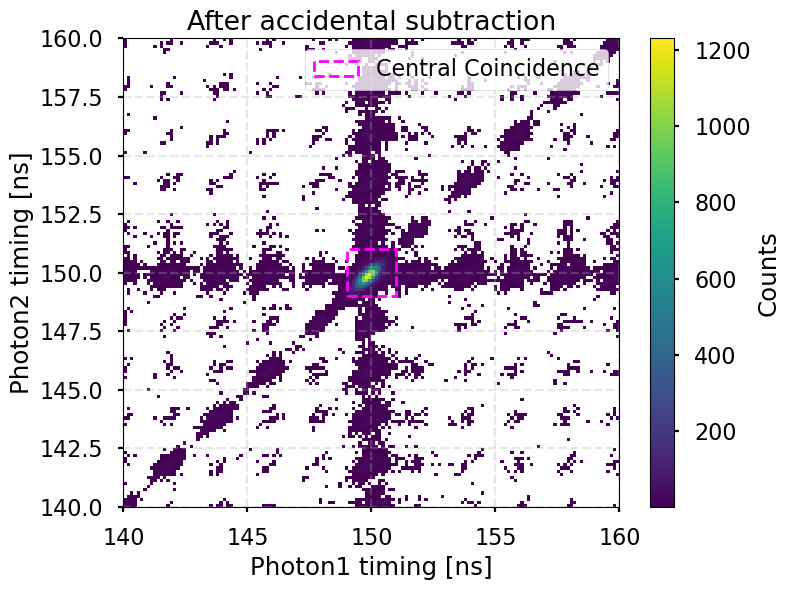

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# ================================
# Load timing histogram
# ================================
data = np.load("cluster_timing_histograms_best_candidate.npz")
hist_bc = data["hist_bc"]
centers_bc = data["centers_bc"]
hist_min = float(data["hist_min"])
hist_max = float(data["hist_max"])
threshold = int(data["threshold"])
n_bins = hist_bc.shape[0]

# ================================
# Helper to convert ns -> bin index
# ================================
bin_w = (hist_max - hist_min) / n_bins
center_val = 150.0
def find_bin_idx(val):
    return int((val - hist_min) / bin_w)

# ================================
# Define accidental regions
# ================================
regions = {
    "R1": {"x": [-9.1,-3.1], "y": [-9.1,-3.1]},
    "R2": {"x": [-3,3],   "y": [-9.1,-3.1]},
    "R3": {"x": [-9.1,-3.1], "y": [3.1,9.1]}
}

# Main window and central bin
main_window = {"x": [-3,3], "y": [-3,3]}
central_bin = {"x": [-1,1], "y": [-1,1]}

# ================================
# Function to sum region counts (positive only)
# ================================
def sum_region(hist, xlim, ylim):
    x0 = find_bin_idx(center_val + xlim[0])
    x1 = find_bin_idx(center_val + xlim[1])
    y0 = find_bin_idx(center_val + ylim[0])
    y1 = find_bin_idx(center_val + ylim[1])
    x0, x1 = min(x0,x1), max(x0,x1)
    y0, y1 = min(y0,y1), max(y0,y1)
    sub_hist = hist[x0:x1+1, y0:y1+1]
    return np.sum(sub_hist[sub_hist>0]), (x0,x1,y0,y1)

# ================================
# Calculate accidentals
# ================================
R_counts = {k: sum_region(hist_bc, v["x"], v["y"])[0] for k,v in regions.items()}
accidental_estimate = R_counts["R1"] + R_counts["R2"] - R_counts["R3"]
print("Accidental counts per region:")
for k,v in R_counts.items():
    print(f"{k}: {v}")
print(f"Final accidental estimate = {accidental_estimate}")

# ================================
# Subtract accidental from main window
# ================================
_, (x0_win, x1_win, y0_win, y1_win) = sum_region(hist_bc, main_window["x"], main_window["y"])

# Convert to float to allow subtraction
hist_corrected = hist_bc.astype(float)

# Distribute accidental estimate evenly across main window
n_bins_win = (x1_win-x0_win+1)*(y1_win-y0_win+1)
hist_corrected[x0_win:x1_win+1, y0_win:y1_win+1] -= accidental_estimate / n_bins_win
hist_corrected[hist_corrected < 0] = 0  # clip negatives


# ================================
# Background fraction in central [-1,1] bin
# ================================
central_counts_before, (x0_c, x1_c, y0_c, y1_c) = sum_region(hist_bc, central_bin["x"], central_bin["y"])
central_counts_after = np.sum(hist_corrected[x0_c:x1_c+1, y0_c:y1_c+1])
background_fraction = (central_counts_before - central_counts_after) / central_counts_before * 100
print(f"Central bin counts before: {central_counts_before}")
print(f"Central bin counts after: {central_counts_after}")
print(f"Estimated background fraction: {background_fraction:.1f}%")

# ================================
# 2D Plots
# ================================
def plot_hist(hist, title):
    counts_plot = np.where(hist <= threshold, np.nan, hist)
    X, Y = np.meshgrid(
        np.linspace(hist_min, hist_max, n_bins+1),
        np.linspace(hist_min, hist_max, n_bins+1)
    )
    plt.figure(figsize=(8,6))
    pcm = plt.pcolormesh(X, Y, counts_plot.T, cmap='viridis')
    cbar = plt.colorbar(pcm)
    cbar.set_label("Counts")
    plt.xlabel("Photon1 timing [ns]")
    plt.ylabel("Photon2 timing [ns]")
    plt.title(title)
    plt.grid(True, linestyle="--", alpha=0.3)
    # Overlay central bin
    plt.gca().add_patch(Rectangle(
        (center_val+central_bin["x"][0], center_val+central_bin["y"][0]),
        central_bin["x"][1]-central_bin["x"][0],
        central_bin["y"][1]-central_bin["y"][0],
        fill=False, edgecolor="magenta", lw=2, linestyle="--", label="Central Coincidence"
    ))
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_hist(hist_bc, "Before accidental subtraction")
plot_hist(hist_corrected, "After accidental subtraction")


Counts in central [-1,1] before subtraction: 30952.0
Counts in central [-1,1] after subtraction:  29157.0
Estimated background fraction: 5.8%


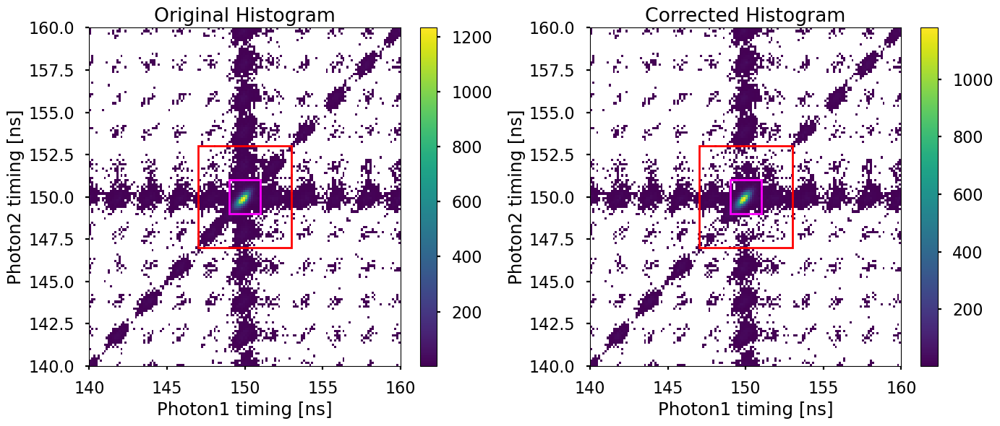

In [83]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# ================================
# Load timing histogram
# ================================
data = np.load("cluster_timing_histograms_best_candidate.npz")
hist_bc = data["hist_bc"].astype(float)  # ensure float for subtraction
hist_min = float(data["hist_min"])
hist_max = float(data["hist_max"])
threshold = int(data["threshold"])
n_bins = hist_bc.shape[0]

# ================================
# Helper to convert ns -> bin index
# ================================
bin_w = (hist_max - hist_min) / n_bins
center_val = 150.0
def find_bin_idx(val):
    idx = int((val - hist_min) / bin_w)
    return max(0, min(idx, n_bins-1))

# ================================
# Define accidental regions and central window
# ================================
regions = {
    "R1": {"x": [-9.1,-3.1], "y": [-9.1,-3.1]},
    "R2": {"x": [-3,3], "y": [-9.1,-3.1]},
    "R3": {"x": [-9.1,-3.1], "y": [3.1,9.1]}
    # "R4": {"x": [-9.1,-3.1], "y": [-3,3]}
}

central_window = {"x": [-3,3], "y": [-3,3]}
central_bin = {"x": [-1,1], "y": [-1,1]}

# ================================
# Sum counts in a region
# ================================
def extract_region(hist, xlim, ylim):
    x0 = find_bin_idx(center_val + xlim[0])
    x1 = find_bin_idx(center_val + xlim[1])
    y0 = find_bin_idx(center_val + ylim[0])
    y1 = find_bin_idx(center_val + ylim[1])
    x0, x1 = min(x0,x1), max(x0,x1)
    y0, y1 = min(y0,y1), max(y0,y1)
    return hist[x0:x1+1, y0:y1+1]

# ================================
# Compute accidental histogram structure
# ================================
hist_R1 = extract_region(hist_bc, regions["R1"]["x"], regions["R1"]["y"])
hist_R2 = extract_region(hist_bc, regions["R2"]["x"], regions["R2"]["y"])
hist_R3 = extract_region(hist_bc, regions["R3"]["x"], regions["R3"]["y"])

# For subtraction: R1 + R2 - R3
hist_acc = hist_R1 + hist_R2 - hist_R3
hist_acc[hist_acc < 0] = 0  # avoid negatives

# ================================
# Apply this accidental structure to central [-3,3] window
# ================================
x0_win = find_bin_idx(center_val + central_window["x"][0])
x1_win = find_bin_idx(center_val + central_window["x"][1])
y0_win = find_bin_idx(center_val + central_window["y"][0])
y1_win = find_bin_idx(center_val + central_window["y"][1])

# Ensure sizes match; if necessary, pad/truncate
win_shape = (x1_win - x0_win + 1, y1_win - y0_win + 1)
acc_shape = hist_acc.shape
x_size = min(win_shape[0], acc_shape[0])
y_size = min(win_shape[1], acc_shape[1])

hist_corrected = hist_bc.copy()
hist_corrected[x0_win:x0_win+x_size, y0_win:y0_win+y_size] -= hist_acc[:x_size,:y_size]
hist_corrected[hist_corrected < 0] = 0

# ================================
# Compute background fraction in [-1,1] bin
# ================================
i0 = find_bin_idx(center_val + central_bin["x"][0])
i1 = find_bin_idx(center_val + central_bin["x"][1])
j0 = find_bin_idx(center_val + central_bin["y"][0])
j1 = find_bin_idx(center_val + central_bin["y"][1])

before = np.sum(hist_bc[i0:i1+1, j0:j1+1])
after  = np.sum(hist_corrected[i0:i1+1, j0:j1+1])
background_fraction = (before - after)/before * 100.0 if before>0 else 0.0

print(f"Counts in central [-1,1] before subtraction: {before}")
print(f"Counts in central [-1,1] after subtraction:  {after}")
print(f"Estimated background fraction: {background_fraction:.1f}%")

# ================================
# Plot original vs corrected histogram
# ================================
counts_plot_orig = np.where(hist_bc <= threshold, np.nan, hist_bc)
counts_plot_corr = np.where(hist_corrected <= threshold, np.nan, hist_corrected)
X, Y = np.meshgrid(np.linspace(hist_min, hist_max, n_bins+1),
                   np.linspace(hist_min, hist_max, n_bins+1))

fig, axs = plt.subplots(1,2,figsize=(14,6))

# Original
pcm1 = axs[0].pcolormesh(X, Y, counts_plot_orig.T, cmap='viridis')
axs[0].set_title("Original Histogram")
axs[0].set_xlabel("Photon1 timing [ns]")
axs[0].set_ylabel("Photon2 timing [ns]")
fig.colorbar(pcm1, ax=axs[0])
axs[0].add_patch(Rectangle((center_val-3,center_val-3),6,6,fill=False,lw=2,edgecolor="red",label="[-3,3] window"))
axs[0].add_patch(Rectangle((center_val-1,center_val-1),2,2,fill=False,lw=2,edgecolor="magenta",label="[-1,1] central"))

# Corrected
pcm2 = axs[1].pcolormesh(X, Y, counts_plot_corr.T, cmap='viridis')
axs[1].set_title("Corrected Histogram")
axs[1].set_xlabel("Photon1 timing [ns]")
axs[1].set_ylabel("Photon2 timing [ns]")
fig.colorbar(pcm2, ax=axs[1])
axs[1].add_patch(Rectangle((center_val-3,center_val-3),6,6,fill=False,lw=2,edgecolor="red",label="[-3,3] window"))
axs[1].add_patch(Rectangle((center_val-1,center_val-1),2,2,fill=False,lw=2,edgecolor="magenta",label="[-1,1] central"))

plt.tight_layout()
plt.show()
